In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter
import copy

import math
import torch
from torch.nn.modules.transformer import TransformerEncoder, TransformerEncoderLayer
from torch.nn.modules import LayerNorm, Linear, ReLU
import torch.nn as nn
import torch.nn.functional as F
import sklearn.metrics
from sklearn.model_selection import train_test_split
from tqdm import tqdm
import pickle
from torch.utils.data import DataLoader

from torch.utils.data import DataLoader
import torch.nn.functional as F
import numpy as np
import torch
from sklearn.metrics import pairwise_distances
from sklearn.neighbors import NearestNeighbors


device = 'cuda' if torch.cuda.is_available() else 'cpu'


# Data Loader

In [2]:
X = np.load('/kaggle/input/active-learning-subset/tar_image_subset.npy') 
y = np.load('/kaggle/input/active-learning-subset/label_target_subset.npy')


test_size = 20/100
X_pool, X_val, y_pool, y_val = train_test_split(X, y, test_size=test_size, stratify=y, random_state=42)

print(f"X shape: {X.shape}")
print(f"y shape: {y.shape}")
print(f"X_val shape: {X_val.shape}")
print(f"y_val  shape: {y_val .shape}")


X shape: (20000, 6, 28)
y shape: (20000,)
X_val shape: (4000, 6, 28)
y_val  shape: (4000,)


In [3]:
y_sample = y
X_sample = X

# Label distribution
label_counts = Counter(y_sample)
df_labels = pd.DataFrame.from_dict(label_counts, orient='index').sort_index()
df_labels.columns = ['count']
df_labels['percent'] = 100 * df_labels['count'] / len(y_sample)
print("\nLabel distribution:")
print(df_labels)

channel_variance = np.var(X_sample, axis=2).mean(axis=0)
channel_mean = X_sample.mean(axis=(0, 2))
channel_std = X_sample.std(axis=(0, 2))
df_stats = pd.DataFrame({
    'channel': range(6),
    'mean': channel_mean,
    'std_dev': channel_std,
    'variance': channel_variance
})
print("\nMean, Std Dev and Variance per Channel:")
print(df_stats)


Label distribution:
   count  percent
0   9081   45.405
1   2603   13.015
2   8316   41.580

Mean, Std Dev and Variance per Channel:
   channel      mean   std_dev  variance
0        0  0.004546  0.999189  0.730689
1        1  0.004955  0.999538  0.721030
2        2  0.003958  1.000457  0.755685
3        3  0.001807  1.000751  0.783507
4        4  0.001153  1.000271  0.634434
5        5  0.001723  1.000909  0.731176


In [4]:
# Total number of samples
total_samples = sum(label_counts.values())

# Number of classes
num_classes = max(label_counts.keys()) + 1  # assuming labels start from 0

# Compute weight for each class as inverse frequency
class_weights = []
for i in range(num_classes):
    count = label_counts.get(i, 0)
    if count == 0:
        class_weights.append(0.0)  # or very small value like 1e-6
    else:
        class_weights.append(total_samples / (num_classes * count))

# Convert to torch tensor for CE loss
class_weights = torch.tensor(class_weights, dtype=torch.float32).to(device)


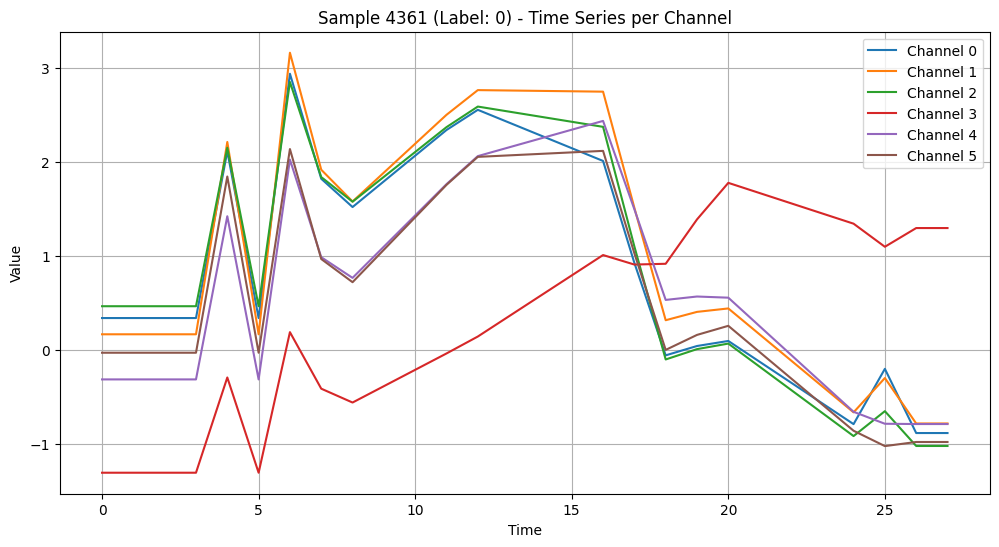

In [5]:
i = np.random.randint(0, len(X))
sample = X[i]  # Shape: (6, T)

plt.figure(figsize=(12, 6))
for c in range(6):
    plt.plot(sample[c], label=f'Channel {c}')
plt.title(f"Sample {i} (Label: {y[i]}) - Time Series per Channel")
plt.xlabel("Time")
plt.ylabel("Value")
plt.legend()
plt.grid(True)
plt.show()

# Dataloader

In [6]:
class Dataset():
    def __init__(self, X, y):
        self.X = torch.tensor(X, dtype=torch.float32)
        self.y = torch.tensor(y, dtype=torch.long)

    def __getitem__(self, index):
        return {
            "x": self.X[index],  # shape: [C, T]
            "y": self.y[index]
        }

    def __len__(self):
        return len(self.X)

# Model

In [7]:
################ CNN Backbone 
def conv_block(in_channels: int, out_channels: int, dropout=0.3) -> nn.Module:
    return nn.Sequential(
        nn.Conv1d(in_channels, out_channels, 5, padding='same'),
        nn.BatchNorm1d(out_channels),
        nn.ReLU(),
        nn.Dropout(dropout),
    )

class cnn(nn.Module):
    def __init__(self):
        super(cnn, self).__init__()
        self.conv1 = conv_block(6, 64)
        self.conv2 = conv_block(64, 128)
        self.conv3 = conv_block(128, 256)
        self.conv4 = conv_block(256, 512)
        self.conv5 = conv_block(512, 1024)
        self.global_pool = nn.AdaptiveAvgPool1d(1)

    def forward(self, x):
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.conv3(x)
        x = self.conv4(x)
        x = self.conv5(x)
        x = self.global_pool(x)
        x = x.view(x.size(0), -1)
        return x

 
################ Fully connected network
class FC(nn.Module):
    def __init__(self, input_dim):
        super(FC, self).__init__()
        self.dropout = nn.Dropout(0.5)
        self.fco = nn.Linear(input_dim, 3)

    def forward(self, x):
        x = self.dropout(x)
        x = self.fco(x)
        return x



class FullModel(nn.Module):
    def __init__(self, backbone, fc):
        super().__init__()
        self.backbone = backbone
        self.fc = fc

    def forward(self, x):
        feat = self.backbone(x)
        out = self.fc(feat)
        return feat, out

# Loading weights

In [8]:
#pretrained weights
map_location=torch.device(device)

backbone = cnn()
fc = FC(1024)

#loading backbone weights
state_dict = torch.load('/kaggle/input/active-learning-subset/backboneSiteA2019.pth', map_location=map_location)
# Remove "module." prefix
new_state_dict = {}
for k, v in state_dict.items():
    new_key = k.replace("module.", "")  # remove module. prefix
    new_state_dict[new_key] = v

backbone.load_state_dict(new_state_dict)

#loading fc weights
state_dict = torch.load('/kaggle/input/active-learning-subset/fcSiteA2019.pth', map_location=map_location)
# Remove "module." prefix
new_state_dict = {}
for k, v in state_dict.items():
    new_key = k.replace("module.", "")  # remove module. prefix
    new_state_dict[new_key] = v

fc.load_state_dict(new_state_dict)

model = FullModel(backbone, fc).to(device)
initial_state_dict = copy.deepcopy(model.state_dict())

# Train/eval loop

In [9]:
def train_one_epoch(model, dataloader, optimizer, criterion, device):
    model.train()
    total_loss, all_preds, all_targets = 0, [], []

    for batch in dataloader:
        x, y = batch["x"].to(device), batch["y"].to(device)

        optimizer.zero_grad()
        _, out = model(x)
        loss = criterion(out, y)
        loss.backward()
        optimizer.step()

        total_loss += loss.item() * len(x)
        preds = torch.argmax(out, dim=1)
        all_preds.extend(preds.cpu().numpy())
        all_targets.extend(y.cpu().numpy())

    avg_loss = total_loss / len(dataloader.dataset)
    acc = np.mean(np.array(all_preds) == np.array(all_targets))
    f1s = sklearn.metrics.f1_score(all_targets, all_preds, average=None)
    return avg_loss, acc, f1s, np.mean(f1s)



def _eval_perf(model, dataloader, device, criterion=None):
    model.eval()
    pred, gt = [], []
    total_loss = 0

    with torch.no_grad():
        for batch in dataloader:
            x, y = batch["x"].to(device), batch["y"].to(device)
            _, outputs = model(x)
            preds = torch.argmax(outputs, dim=1)
            if criterion:
                total_loss += criterion(outputs, y).item() * len(x)

            pred.extend(preds.cpu().numpy())
            gt.extend(y.cpu().numpy())

    acc = np.mean(np.array(pred) == np.array(gt))
    f1s = sklearn.metrics.f1_score(gt, pred, average=None)
    avg_f1 = np.mean(f1s)

    if criterion:
        avg_loss = total_loss / len(dataloader.dataset)
        return avg_loss, f1s, acc, avg_f1
    else:
        return 0, f1s, acc, avg_f1



class LabelSmoothingCrossEntropy(nn.Module):
    def __init__(self, weight=None, smoothing=0.1):
        super().__init__()
        self.weight = weight
        self.smoothing = smoothing
        self.confidence = 1.0 - smoothing

    def forward(self, pred, target):
        log_probs = F.log_softmax(pred, dim=-1)
        nll_loss = -log_probs.gather(dim=-1, index=target.unsqueeze(1)).squeeze(1)
        smooth_loss = -log_probs.mean(dim=-1)
        loss = self.confidence * nll_loss + self.smoothing * smooth_loss
        if self.weight is not None:
            loss = loss * self.weight[target]
        return loss.mean()

# Active Learning methods

In [10]:
def plot_round_metrics(history):
    round_id = len(history["epoch_metrics"]) - 1
    epoch_stats = history["epoch_metrics"][round_id]
    epochs = list(range(1, len(epoch_stats) + 1))

    train_loss = [e["train_loss"] for e in epoch_stats]
    val_loss = [e["val_loss"] for e in epoch_stats]
    train_acc = [e["train_acc"] for e in epoch_stats]
    train_f1 = [e["train_avg_f1"] for e in epoch_stats]
    val_acc = [e["val_acc"] for e in epoch_stats]
    val_f1 = [e["val_avg_f1"] for e in epoch_stats]

    plt.figure(figsize=(15, 4))

    # Loss plot
    plt.subplot(1, 3, 1)
    plt.plot(epochs, train_loss, label="Train Loss")
    plt.plot(epochs, val_loss, label="Val Loss")
    plt.title(f"[Round {round_id+1}] Loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.legend()

    # Accuracy plot
    plt.subplot(1, 3, 2)
    plt.plot(epochs, train_acc, label="Train Acc")
    plt.plot(epochs, val_acc, label="Val Acc")
    plt.title(f"[Round {round_id+1}] Accuracy")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.legend()

    # Avg F1 plot
    plt.subplot(1, 3, 3)
    plt.plot(epochs, train_f1, label="Train F1")
    plt.plot(epochs, val_f1, label="Val F1")
    plt.title(f"[Round {round_id+1}] Avg F1")
    plt.xlabel("Epoch")
    plt.ylabel("Avg F1")
    plt.legend()

    plt.tight_layout()
    plt.show()



def plot_final_performance(history):
    samples = history["samples"]
    val_acc = history["round_val_acc"]
    val_f1 = history["round_val_avg_f1"]

    plt.figure(figsize=(10, 4))

    plt.subplot(1, 2, 1)
    plt.plot(samples, val_acc, marker='o')
    plt.title("Val Accuracy vs Labeled Samples")
    plt.xlabel("Labeled Samples")
    plt.ylabel("Accuracy")

    plt.subplot(1, 2, 2)
    plt.plot(samples, val_f1, marker='o')
    plt.title("Val Avg F1 vs Labeled Samples")
    plt.xlabel("Labeled Samples")
    plt.ylabel("Avg F1")

    plt.tight_layout()
    plt.show()


In [11]:
def query_samples(model, dataset, query_size, strategy, device, already_selected_idx=None):
    model.eval()
    dataloader = DataLoader(dataset, batch_size=128)
    all_scores = []
    all_features = []
    if already_selected_idx is None:
        already_selected_idx = []

    with torch.no_grad():
        for batch in dataloader:
            x = batch["x"].to(device)
            features, out = model(x)
            probs = F.softmax(out, dim=1)

            if strategy in ["entropy", "least_confident", "margin", "random", "entropy_diversity"]:
                score = None
                if strategy in ["entropy", "entropy_diversity"]:
                    score = -torch.sum(probs * torch.log(probs + 1e-10), dim=1)
                elif strategy == "least_confident":
                    score = 1 - probs.max(dim=1)[0]
                elif strategy == "margin":
                    sorted_probs, _ = probs.sort(dim=1, descending=True)
                    score = -(sorted_probs[:, 0] - sorted_probs[:, 1])
                elif strategy == "random":
                    score = torch.rand(len(x), device=device)

                all_scores.extend(score.cpu().numpy())

            if strategy in ["diversity", "density", "entropy_diversity"]:
                all_features.append(features.cpu().numpy())

    if strategy in ["entropy", "least_confident", "margin", "random"]:
        indices = np.argsort(all_scores)[-query_size:]
        return indices

    all_features = np.concatenate(all_features, axis=0)

    if strategy == "diversity":
        # Core-set (k-Center Greedy)
        if already_selected_idx is None or len(already_selected_idx) == 0:
            selected = [np.random.randint(len(all_features))]
        else:
            selected = already_selected_idx.copy()

        selected_features = all_features[selected]
        remaining = list(set(range(len(all_features))) - set(selected))

        for _ in range(query_size):
            dists = pairwise_distances(all_features[remaining], selected_features, metric="euclidean")
            min_dists = np.min(dists, axis=1)
            next_idx = remaining[np.argmax(min_dists)]
            selected.append(next_idx)
            selected_features = np.vstack([selected_features, all_features[next_idx].reshape(1, -1)])
            remaining.remove(next_idx)

        new_indices = list(set(selected) - set(already_selected_idx))[-query_size:]
        return np.array(new_indices)

    elif strategy == "density":
        if all_features.shape[1] > 64:
            from sklearn.decomposition import PCA
            pca = PCA(n_components=64)
            all_features = pca.fit_transform(all_features)

        all_features = all_features.astype(np.float32)
        nbrs = NearestNeighbors(n_neighbors=6, algorithm='auto', metric='euclidean').fit(all_features)
        distances, _ = nbrs.kneighbors(all_features)
        avg_neighbor_dist = distances[:, 1:].mean(axis=1)
        density_scores = -avg_neighbor_dist
        indices = np.argsort(density_scores)[-query_size:]
        return indices

    elif strategy == "entropy_diversity":
        # Hybrid: Select top-2×query_size most uncertain samples, then apply core-set
        all_scores = np.array(all_scores)
        all_features = np.array(all_features)

        top_uncertain_idx = np.argsort(all_scores)[-2 * query_size:]
        uncertain_features = all_features[top_uncertain_idx]

        # Core-set on uncertain samples
        selected = [np.random.randint(len(uncertain_features))]
        selected_features = uncertain_features[selected]
        remaining = list(set(range(len(uncertain_features))) - set(selected))

        for _ in range(query_size - 1):
            dists = pairwise_distances(uncertain_features[remaining], selected_features, metric="euclidean")
            min_dists = np.min(dists, axis=1)
            next_idx = remaining[np.argmax(min_dists)]
            selected.append(next_idx)
            selected_features = np.vstack([selected_features, uncertain_features[next_idx].reshape(1, -1)])
            remaining.remove(next_idx)

        final_indices = top_uncertain_idx[selected]
        return np.array(final_indices)


# Active Learning Loop

In [12]:
def active_learning_loop(model, labeled_dataset, unlabeled_dataset, val_dataset, strategy, device, iters=10, query_size=100, final_epochs=5):
    
    criterion = LabelSmoothingCrossEntropy(weight=class_weights, smoothing=0.1)
    optimizer = torch.optim.AdamW(model.parameters(), lr=1e-4, weight_decay=1e-4)

    
    history = {
        "strategy": strategy,
        "samples": [],
        "epoch_metrics": [],
        "round_val_acc": [],
        "round_val_avg_f1": []
    }

    for it in range(iters):
        print(f"\n[AL Round {it+1}/{iters}] — Labeled samples: {len(labeled_dataset)}")

        train_loader = DataLoader(labeled_dataset, batch_size=64, shuffle=True)
        val_loader = DataLoader(val_dataset, batch_size=64)

        epoch_stats = []

        if it <= 3:
            epochs = 5
        elif 4 <= it <= 10:
            epochs = 10
        elif 11 <= it:
            epochs = final_epochs
        else:
            epochs = final_epochs
        
        for ep in tqdm(range(epochs), desc="Epoch", leave=False):
            tr_loss, tr_acc, tr_f1s, tr_avgf1 = train_one_epoch(model, train_loader, optimizer, criterion, device)
            val_loss, val_f1s, val_acc, val_avgf1 = _eval_perf(model, val_loader, device, criterion)

            epoch_stats.append({
                "train_loss": tr_loss,
                "train_acc": tr_acc,
                "train_avg_f1": tr_avgf1,
                "val_loss": val_loss,
                "val_acc": val_acc,
                "val_avg_f1": val_avgf1
            })

        history["samples"].append(len(labeled_dataset))
        history["epoch_metrics"].append(epoch_stats)
        history["round_val_acc"].append(val_acc)
        history["round_val_avg_f1"].append(val_avgf1)

        # Query next samples
        if len(unlabeled_dataset) < query_size:
            print("Unlabeled pool exhausted.")
            break

        selected_idxs = query_samples(model, unlabeled_dataset, query_size, strategy, device)

        new_x = [unlabeled_dataset.X[i] for i in selected_idxs]
        new_y = [unlabeled_dataset.y[i] for i in selected_idxs]

        labeled_dataset.X = torch.cat([labeled_dataset.X, torch.stack(new_x)], dim=0)
        labeled_dataset.y = torch.cat([labeled_dataset.y, torch.tensor(new_y)], dim=0)

        keep_idxs = list(set(range(len(unlabeled_dataset))) - set(selected_idxs))
        unlabeled_dataset.X = torch.stack([unlabeled_dataset.X[i] for i in keep_idxs])
        unlabeled_dataset.y = torch.tensor([unlabeled_dataset.y[i] for i in keep_idxs])

        print(f"\nEpoch {epochs}/{epochs}")
        print(f"Train — Loss: {tr_loss:.4f} | Acc: {tr_acc:.4f} | Avg F1: {tr_avgf1:.4f}")
        print(f"Val   — Loss: {val_loss:.4f} | Acc: {val_acc:.4f} | Avg F1: {val_avgf1:.4f}")

        
        plot_round_metrics(history)

    plot_final_performance(history)
    return history


X_labeled shape: (100, 6, 28)
y_labeled shape: (100,)
X_unlabeled shape: (15900, 6, 28)
y_unlabeled shape: (15900,)

=== Running strategy: DIVERSITY ===

[AL Round 1/20] — Labeled samples: 100



Epoch 5/5
Train — Loss: 2.3353 | Acc: 0.2700 | Avg F1: 0.2656
Val   — Loss: 1.0932 | Acc: 0.6813 | Avg F1: 0.6693


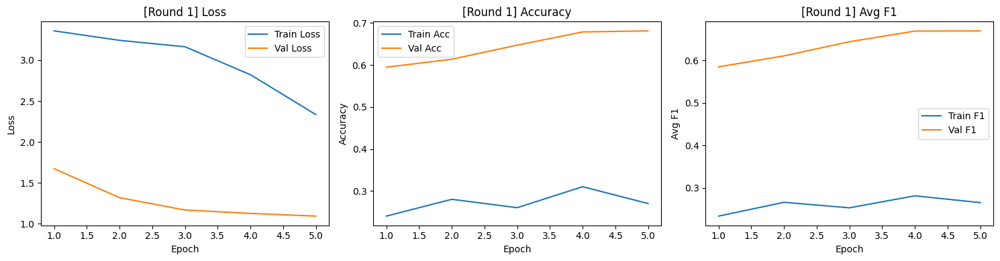


[AL Round 2/20] — Labeled samples: 110



Epoch 5/5
Train — Loss: 2.0135 | Acc: 0.4636 | Avg F1: 0.4586
Val   — Loss: 1.7685 | Acc: 0.5797 | Avg F1: 0.5461


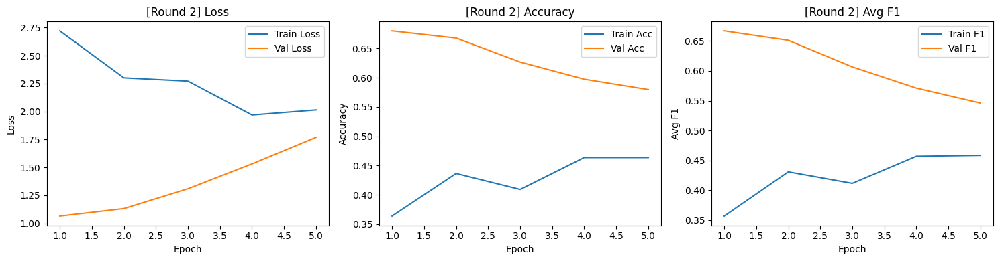


[AL Round 3/20] — Labeled samples: 120



Epoch 5/5
Train — Loss: 1.4833 | Acc: 0.6167 | Avg F1: 0.6000
Val   — Loss: 1.6595 | Acc: 0.6805 | Avg F1: 0.6617


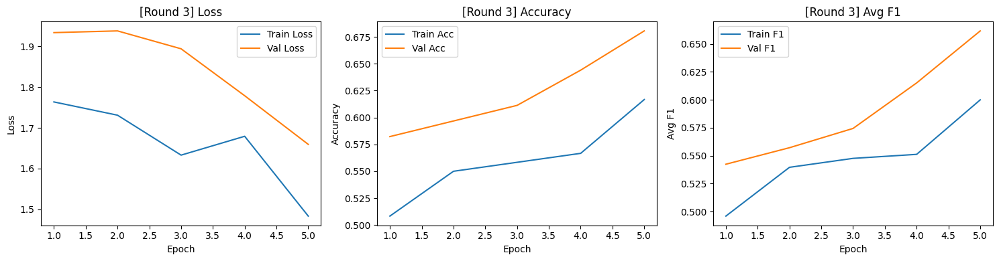


[AL Round 4/20] — Labeled samples: 130



Epoch 5/5
Train — Loss: 1.3306 | Acc: 0.6692 | Avg F1: 0.6510
Val   — Loss: 1.8195 | Acc: 0.6345 | Avg F1: 0.6193


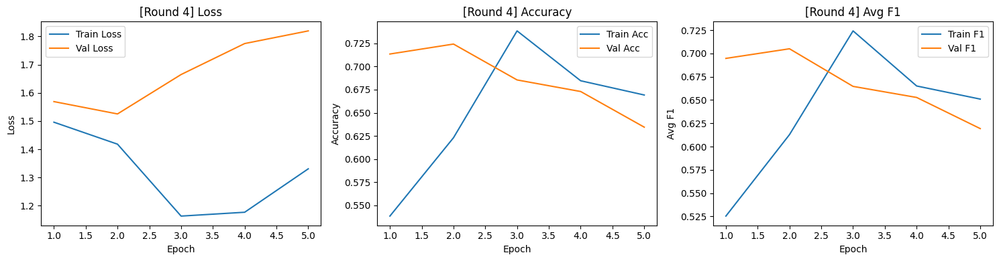


[AL Round 5/20] — Labeled samples: 140



Epoch 10/10
Train — Loss: 1.0094 | Acc: 0.7143 | Avg F1: 0.7021
Val   — Loss: 1.3660 | Acc: 0.7280 | Avg F1: 0.7145


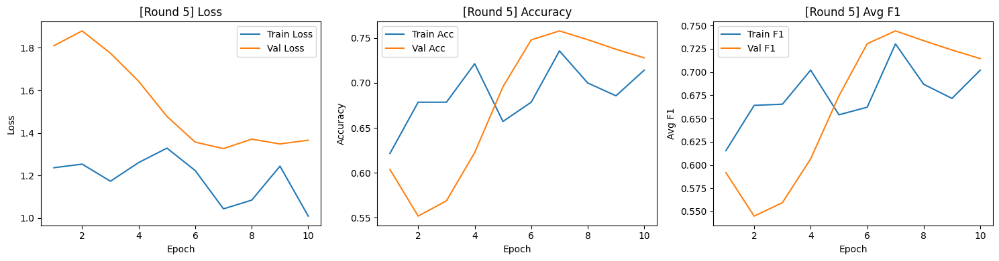


[AL Round 6/20] — Labeled samples: 150



Epoch 10/10
Train — Loss: 0.8666 | Acc: 0.7667 | Avg F1: 0.7605
Val   — Loss: 1.1669 | Acc: 0.7572 | Avg F1: 0.7442


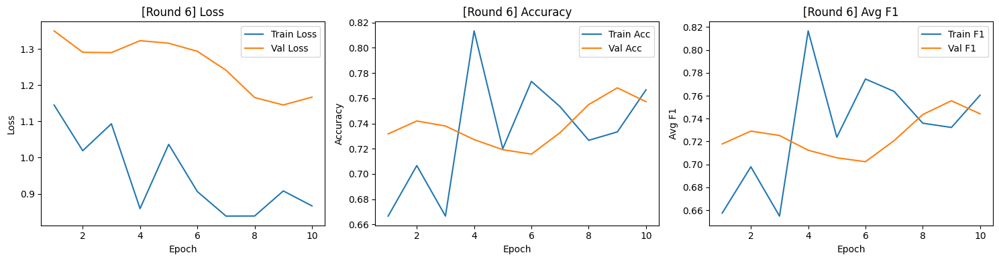


[AL Round 7/20] — Labeled samples: 160



Epoch 10/10
Train — Loss: 0.8341 | Acc: 0.7875 | Avg F1: 0.7849
Val   — Loss: 1.0103 | Acc: 0.7340 | Avg F1: 0.7300


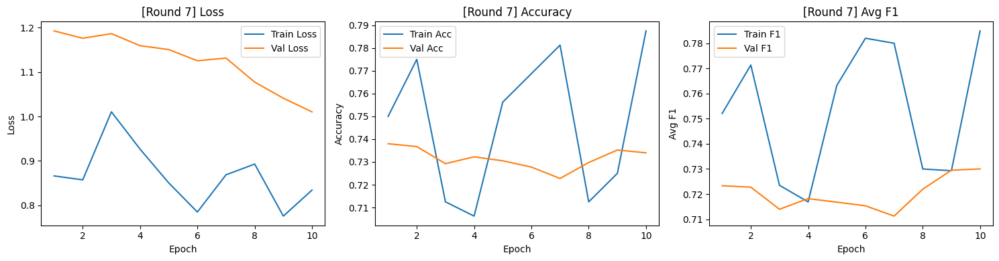


[AL Round 8/20] — Labeled samples: 170



Epoch 10/10
Train — Loss: 0.8200 | Acc: 0.7353 | Avg F1: 0.7524
Val   — Loss: 0.9300 | Acc: 0.7492 | Avg F1: 0.7419


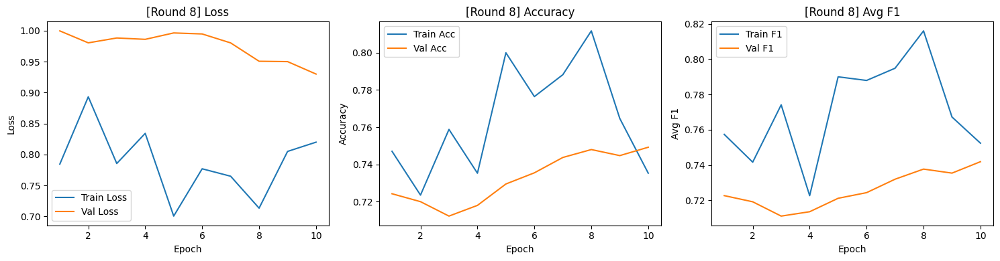


[AL Round 9/20] — Labeled samples: 180



Epoch 10/10
Train — Loss: 0.7125 | Acc: 0.7556 | Avg F1: 0.7644
Val   — Loss: 0.8863 | Acc: 0.7358 | Avg F1: 0.7331


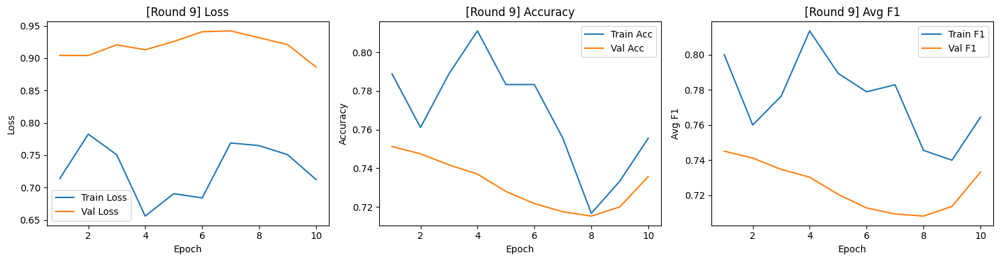


[AL Round 10/20] — Labeled samples: 190



Epoch 10/10
Train — Loss: 0.6501 | Acc: 0.8053 | Avg F1: 0.8240
Val   — Loss: 0.8979 | Acc: 0.7087 | Avg F1: 0.7108


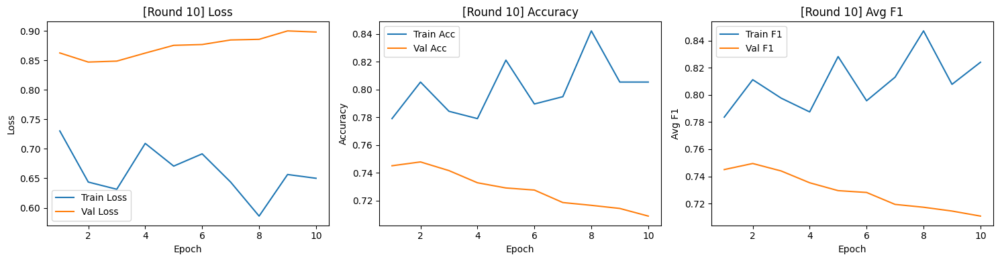


[AL Round 11/20] — Labeled samples: 200



Epoch 10/10
Train — Loss: 0.6875 | Acc: 0.8100 | Avg F1: 0.8141
Val   — Loss: 0.8685 | Acc: 0.7495 | Avg F1: 0.7533


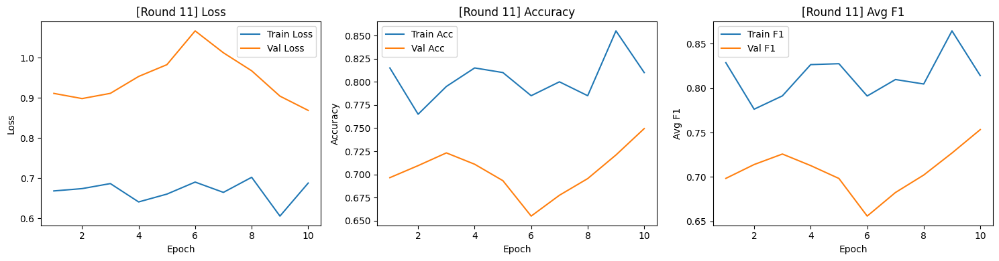


[AL Round 12/20] — Labeled samples: 210



Epoch 15/15
Train — Loss: 0.5794 | Acc: 0.8476 | Avg F1: 0.8642
Val   — Loss: 0.8942 | Acc: 0.7205 | Avg F1: 0.7244


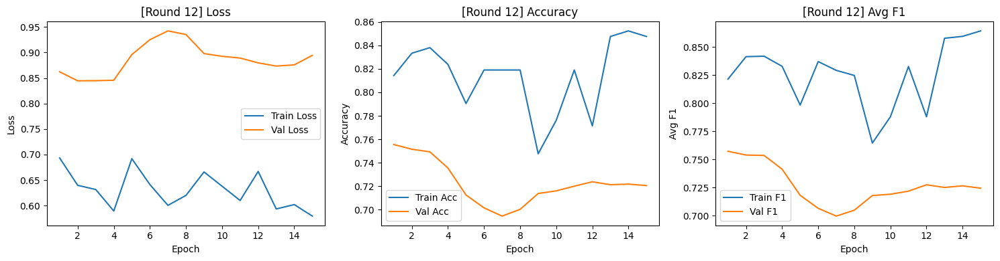


[AL Round 13/20] — Labeled samples: 220



Epoch 15/15
Train — Loss: 0.5950 | Acc: 0.8045 | Avg F1: 0.8245
Val   — Loss: 0.8462 | Acc: 0.7210 | Avg F1: 0.7249


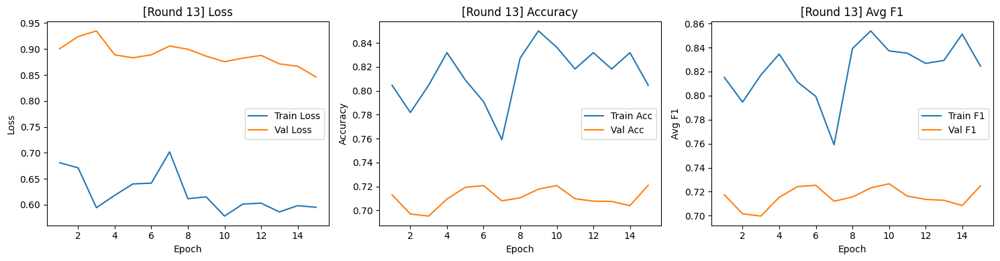


[AL Round 14/20] — Labeled samples: 230



Epoch 15/15
Train — Loss: 0.5317 | Acc: 0.8478 | Avg F1: 0.8531
Val   — Loss: 0.8209 | Acc: 0.7425 | Avg F1: 0.7480


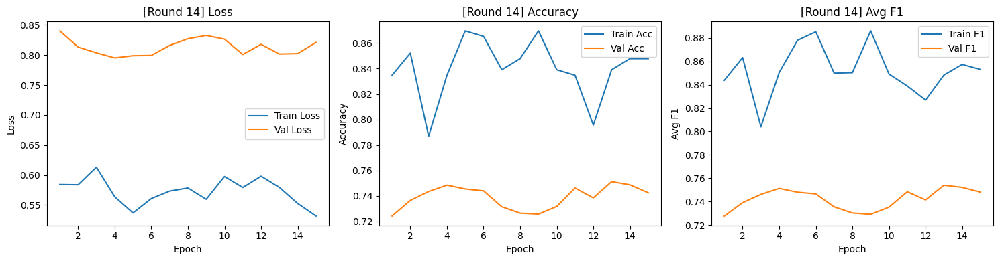


[AL Round 15/20] — Labeled samples: 240



Epoch 15/15
Train — Loss: 0.5566 | Acc: 0.8583 | Avg F1: 0.8778
Val   — Loss: 0.7717 | Acc: 0.7515 | Avg F1: 0.7540


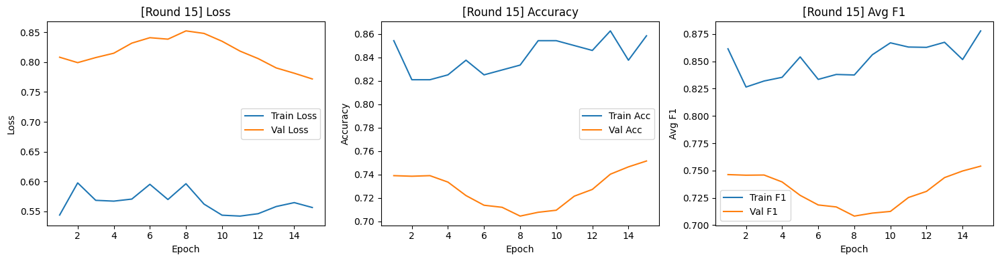


[AL Round 16/20] — Labeled samples: 250



Epoch 15/15
Train — Loss: 0.5853 | Acc: 0.8320 | Avg F1: 0.8475
Val   — Loss: 0.7461 | Acc: 0.7738 | Avg F1: 0.7745


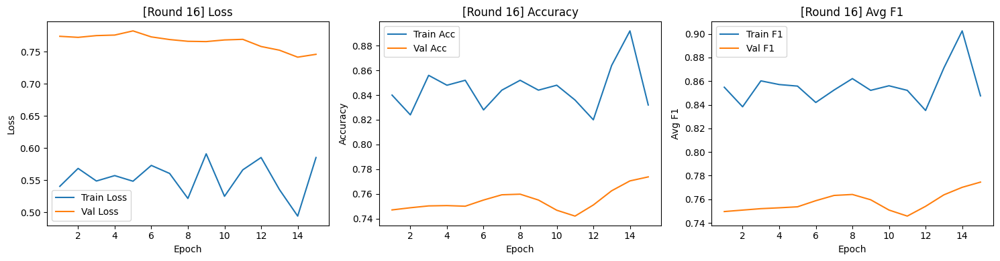


[AL Round 17/20] — Labeled samples: 260



Epoch 15/15
Train — Loss: 0.6290 | Acc: 0.7769 | Avg F1: 0.7800
Val   — Loss: 0.8930 | Acc: 0.6763 | Avg F1: 0.6964


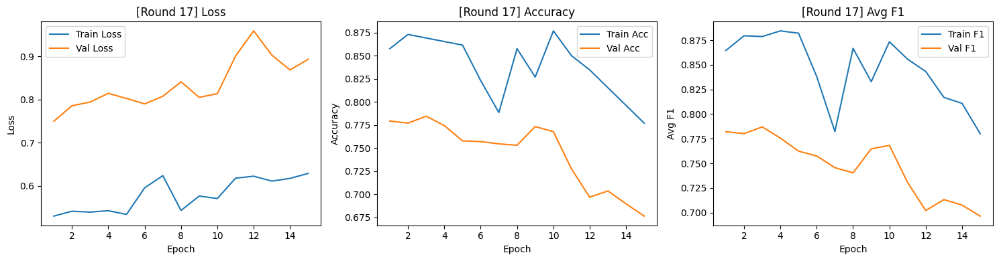


[AL Round 18/20] — Labeled samples: 270



Epoch 15/15
Train — Loss: 0.5878 | Acc: 0.8222 | Avg F1: 0.8362
Val   — Loss: 0.7309 | Acc: 0.7730 | Avg F1: 0.7743


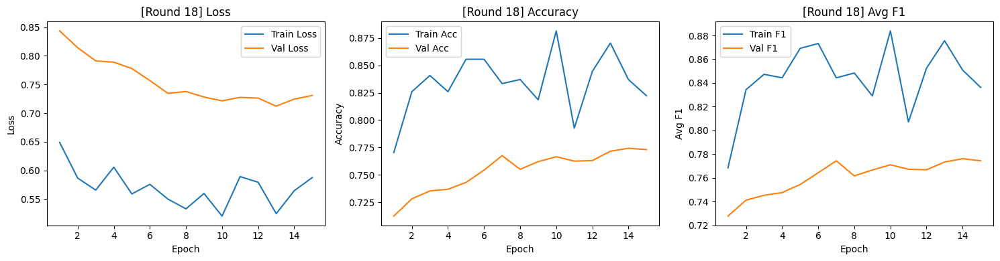


[AL Round 19/20] — Labeled samples: 280



Epoch 15/15
Train — Loss: 0.5852 | Acc: 0.8464 | Avg F1: 0.8550
Val   — Loss: 0.7396 | Acc: 0.7730 | Avg F1: 0.7760


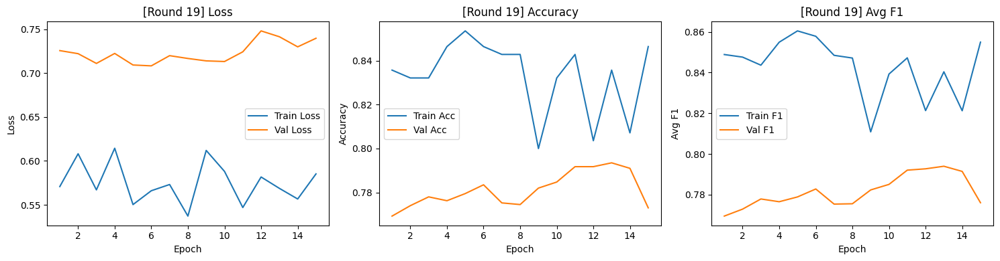


[AL Round 20/20] — Labeled samples: 290



Epoch 15/15
Train — Loss: 0.5265 | Acc: 0.8690 | Avg F1: 0.8726
Val   — Loss: 0.7343 | Acc: 0.7825 | Avg F1: 0.7830


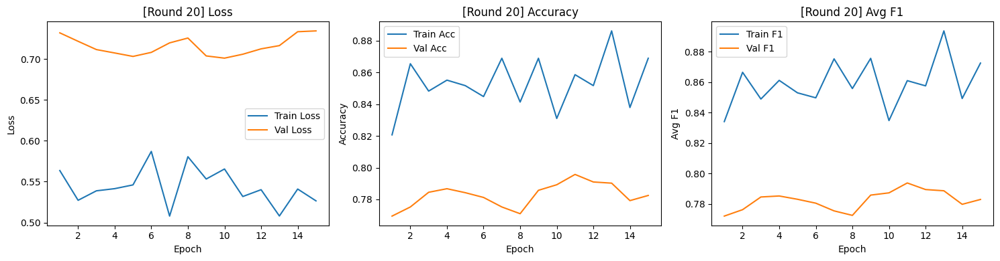

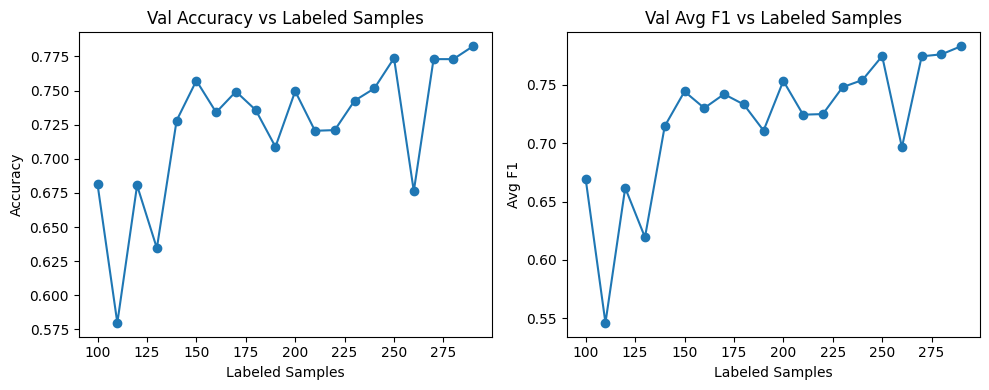


=== Running strategy: ENTROPY ===

[AL Round 1/20] — Labeled samples: 100



Epoch 5/5
Train — Loss: 2.7579 | Acc: 0.3300 | Avg F1: 0.3152
Val   — Loss: 1.2696 | Acc: 0.6435 | Avg F1: 0.6203


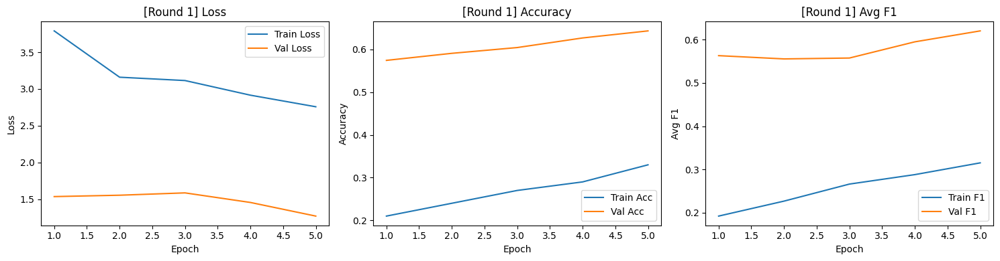


[AL Round 2/20] — Labeled samples: 110



Epoch 5/5
Train — Loss: 2.0573 | Acc: 0.4364 | Avg F1: 0.4321
Val   — Loss: 1.6931 | Acc: 0.5387 | Avg F1: 0.5297


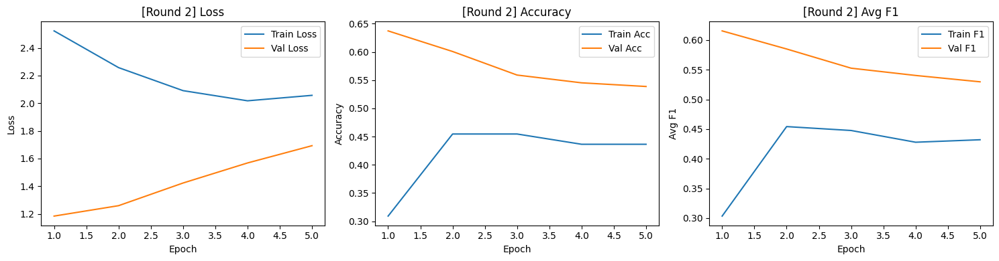


[AL Round 3/20] — Labeled samples: 120



Epoch 5/5
Train — Loss: 1.5942 | Acc: 0.5583 | Avg F1: 0.5419
Val   — Loss: 2.9645 | Acc: 0.5583 | Avg F1: 0.4957


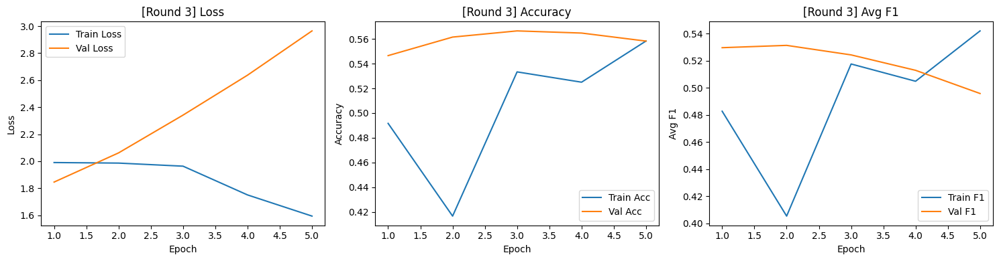


[AL Round 4/20] — Labeled samples: 130



Epoch 5/5
Train — Loss: 1.3424 | Acc: 0.6769 | Avg F1: 0.6368
Val   — Loss: 3.2851 | Acc: 0.5942 | Avg F1: 0.5511


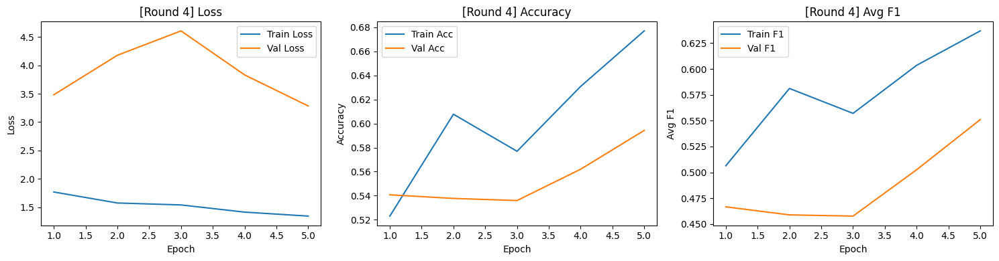


[AL Round 5/20] — Labeled samples: 140



Epoch 10/10
Train — Loss: 1.1761 | Acc: 0.6214 | Avg F1: 0.6011
Val   — Loss: 3.2220 | Acc: 0.5975 | Avg F1: 0.5550


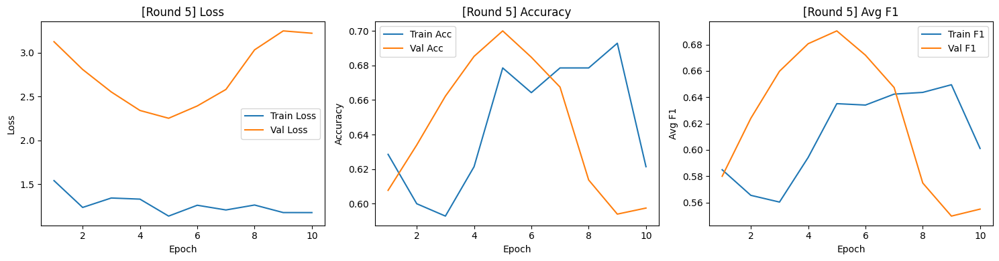


[AL Round 6/20] — Labeled samples: 150



Epoch 10/10
Train — Loss: 0.9289 | Acc: 0.7800 | Avg F1: 0.7622
Val   — Loss: 2.2036 | Acc: 0.7515 | Avg F1: 0.7441


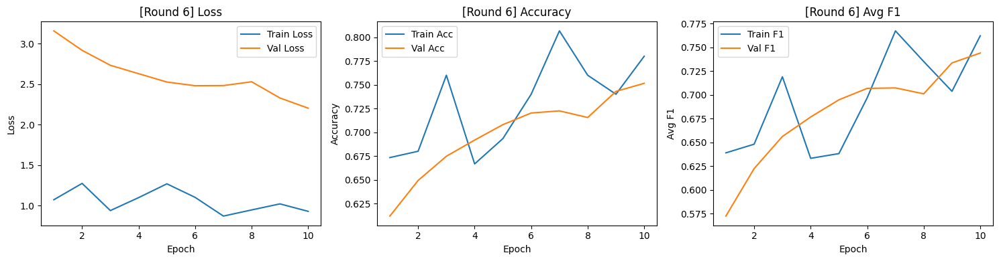


[AL Round 7/20] — Labeled samples: 160



Epoch 10/10
Train — Loss: 0.8312 | Acc: 0.7688 | Avg F1: 0.7591
Val   — Loss: 1.9291 | Acc: 0.7362 | Avg F1: 0.7262


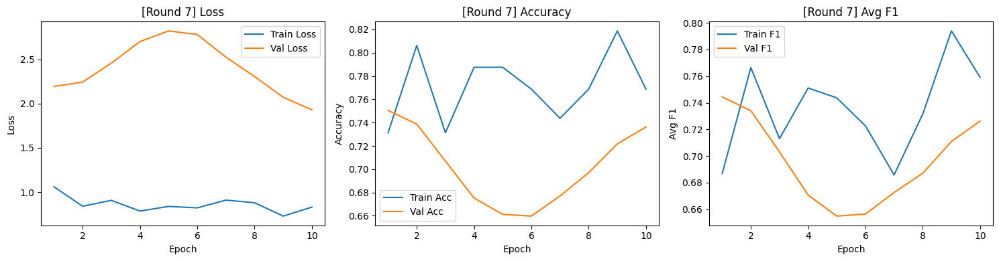


[AL Round 8/20] — Labeled samples: 170



Epoch 10/10
Train — Loss: 0.7367 | Acc: 0.8353 | Avg F1: 0.7870
Val   — Loss: 2.2282 | Acc: 0.6795 | Avg F1: 0.6595


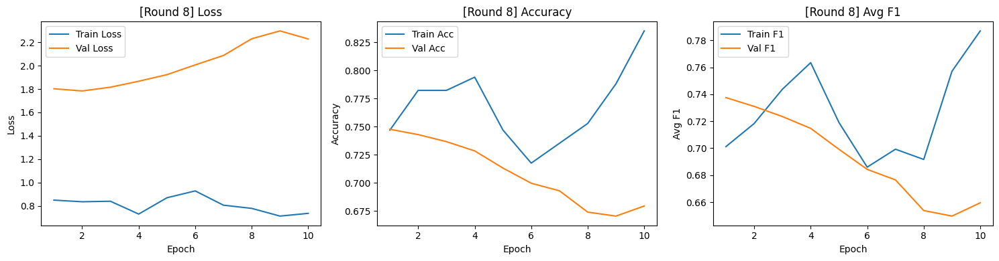


[AL Round 9/20] — Labeled samples: 180



Epoch 10/10
Train — Loss: 0.7502 | Acc: 0.7833 | Avg F1: 0.7520
Val   — Loss: 1.4402 | Acc: 0.7610 | Avg F1: 0.7528


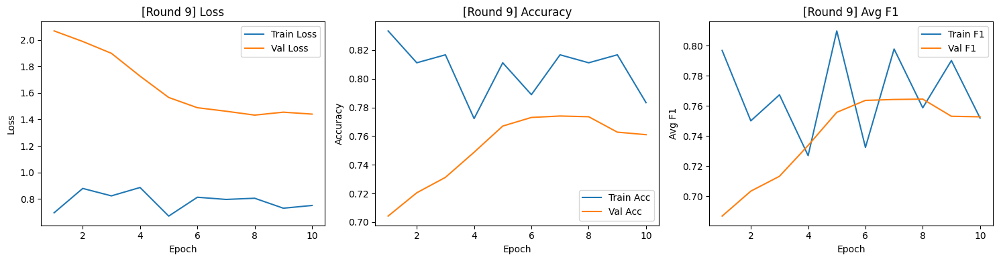


[AL Round 10/20] — Labeled samples: 190



Epoch 10/10
Train — Loss: 0.7803 | Acc: 0.7632 | Avg F1: 0.7312
Val   — Loss: 1.2325 | Acc: 0.7665 | Avg F1: 0.7607


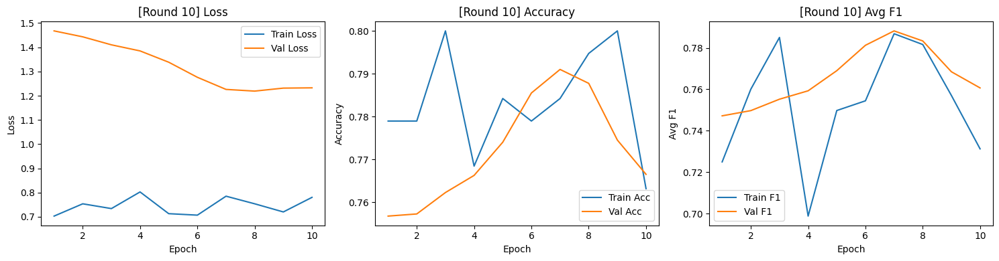


[AL Round 11/20] — Labeled samples: 200



Epoch 10/10
Train — Loss: 0.6904 | Acc: 0.7600 | Avg F1: 0.7146
Val   — Loss: 1.0343 | Acc: 0.7905 | Avg F1: 0.7830


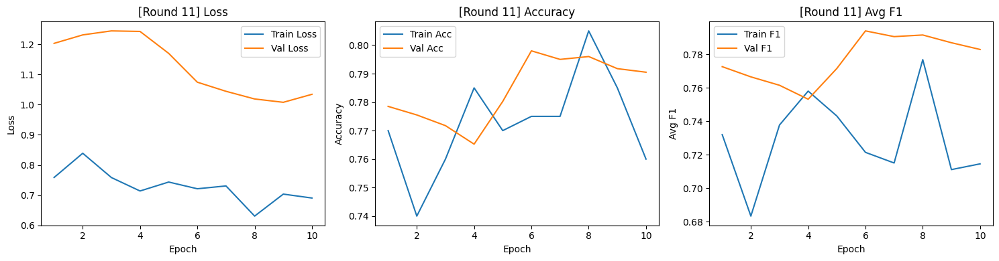


[AL Round 12/20] — Labeled samples: 210



Epoch 15/15
Train — Loss: 0.6301 | Acc: 0.7952 | Avg F1: 0.7926
Val   — Loss: 1.0716 | Acc: 0.7458 | Avg F1: 0.7506


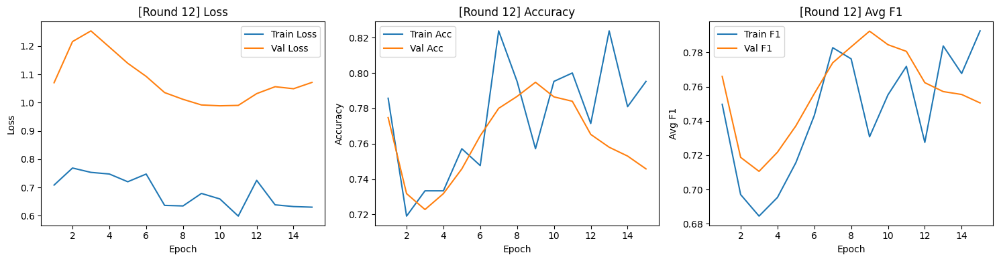


[AL Round 13/20] — Labeled samples: 220



Epoch 15/15
Train — Loss: 0.6377 | Acc: 0.7500 | Avg F1: 0.7176
Val   — Loss: 1.0530 | Acc: 0.7480 | Avg F1: 0.7612


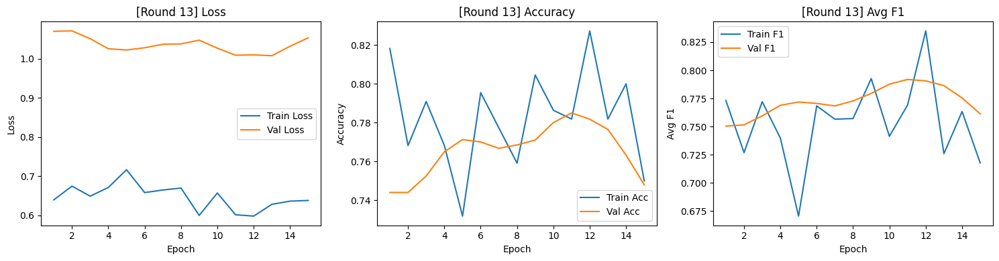


[AL Round 14/20] — Labeled samples: 230



Epoch 15/15
Train — Loss: 0.5765 | Acc: 0.8565 | Avg F1: 0.8210
Val   — Loss: 0.9312 | Acc: 0.7970 | Avg F1: 0.8061


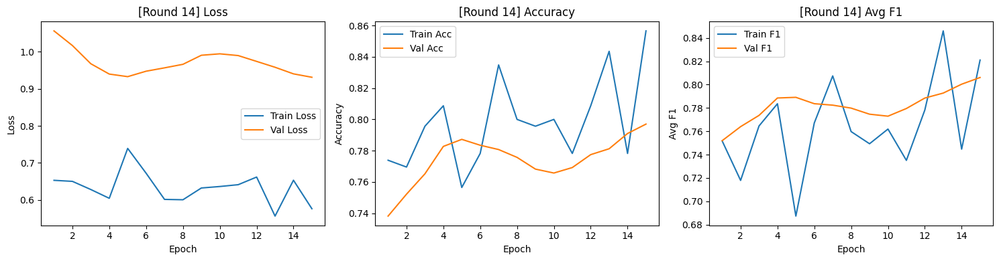


[AL Round 15/20] — Labeled samples: 240



Epoch 15/15
Train — Loss: 0.5909 | Acc: 0.8208 | Avg F1: 0.7736
Val   — Loss: 1.0115 | Acc: 0.7702 | Avg F1: 0.7826


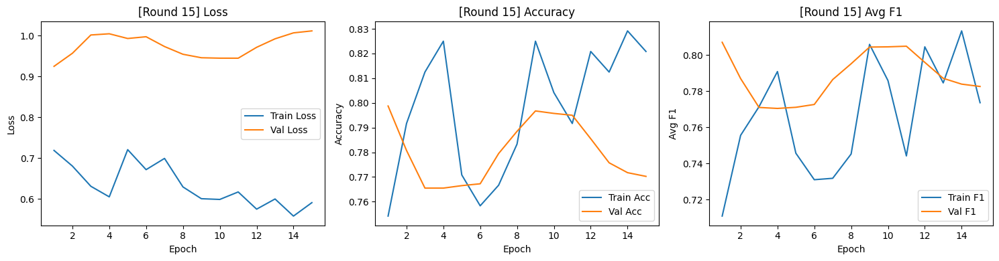


[AL Round 16/20] — Labeled samples: 250



Epoch 15/15
Train — Loss: 0.6069 | Acc: 0.8000 | Avg F1: 0.7740
Val   — Loss: 0.9701 | Acc: 0.7800 | Avg F1: 0.7907


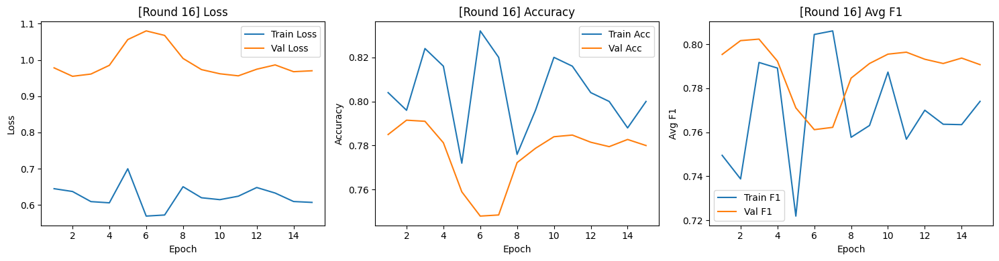


[AL Round 17/20] — Labeled samples: 260



Epoch 15/15
Train — Loss: 0.6777 | Acc: 0.7654 | Avg F1: 0.7462
Val   — Loss: 0.9891 | Acc: 0.7937 | Avg F1: 0.8041


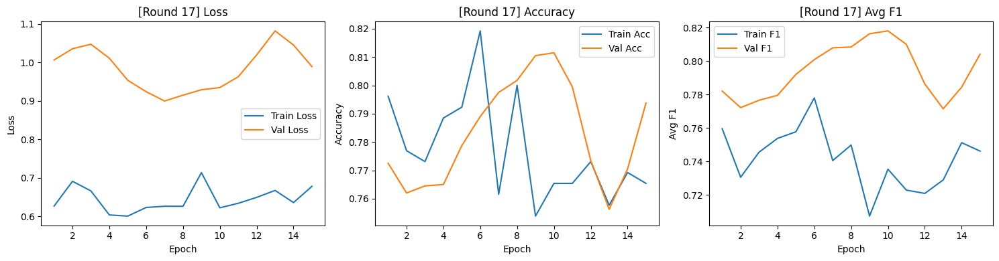


[AL Round 18/20] — Labeled samples: 270



Epoch 15/15
Train — Loss: 0.6927 | Acc: 0.7926 | Avg F1: 0.7540
Val   — Loss: 0.9383 | Acc: 0.7983 | Avg F1: 0.8099


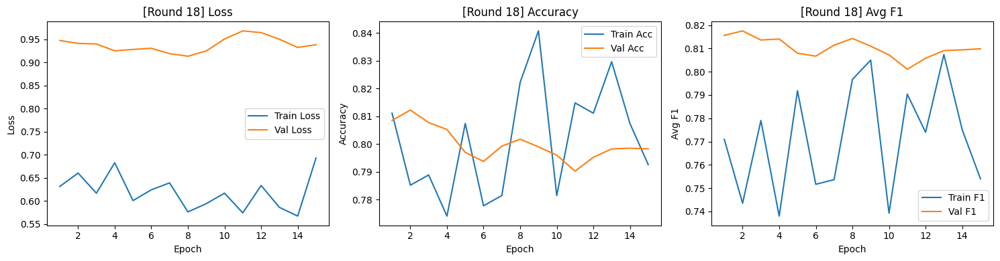


[AL Round 19/20] — Labeled samples: 280



Epoch 15/15
Train — Loss: 0.5846 | Acc: 0.8179 | Avg F1: 0.7882
Val   — Loss: 0.9340 | Acc: 0.7967 | Avg F1: 0.8083


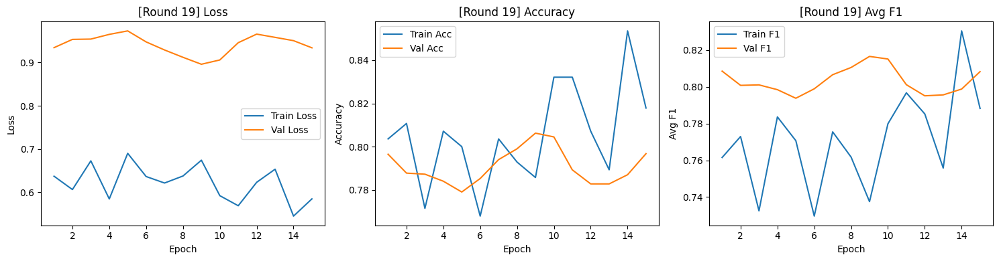


[AL Round 20/20] — Labeled samples: 290



Epoch 15/15
Train — Loss: 0.6060 | Acc: 0.7931 | Avg F1: 0.7690
Val   — Loss: 0.9298 | Acc: 0.7985 | Avg F1: 0.8096


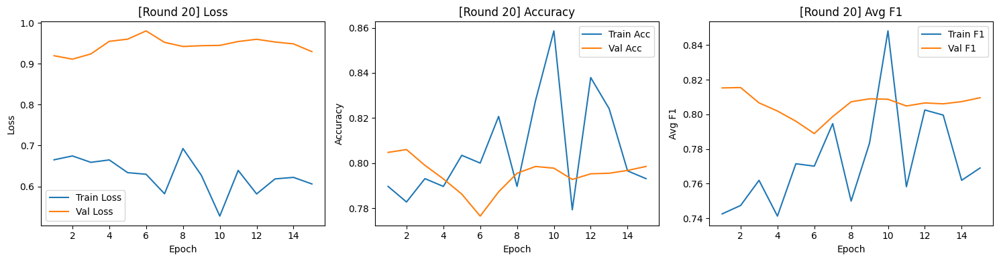

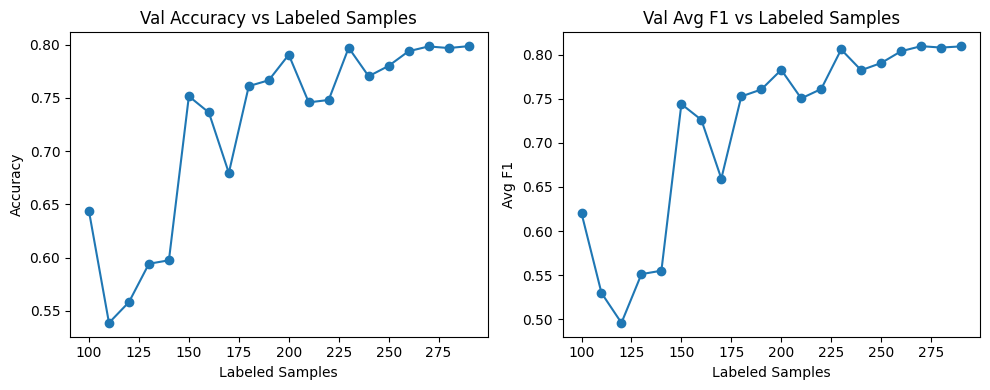


=== Running strategy: ENTROPY_DIVERSITY ===

[AL Round 1/20] — Labeled samples: 100



Epoch 5/5
Train — Loss: 2.6460 | Acc: 0.3800 | Avg F1: 0.3874
Val   — Loss: 1.2098 | Acc: 0.6228 | Avg F1: 0.6068


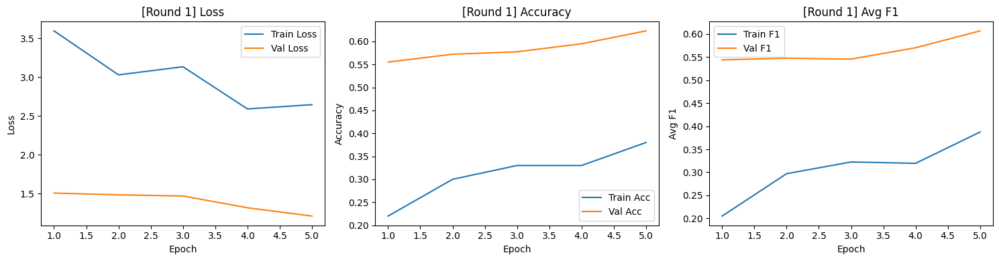


[AL Round 2/20] — Labeled samples: 110



Epoch 5/5
Train — Loss: 2.0066 | Acc: 0.4455 | Avg F1: 0.4417
Val   — Loss: 1.6100 | Acc: 0.6380 | Avg F1: 0.6176


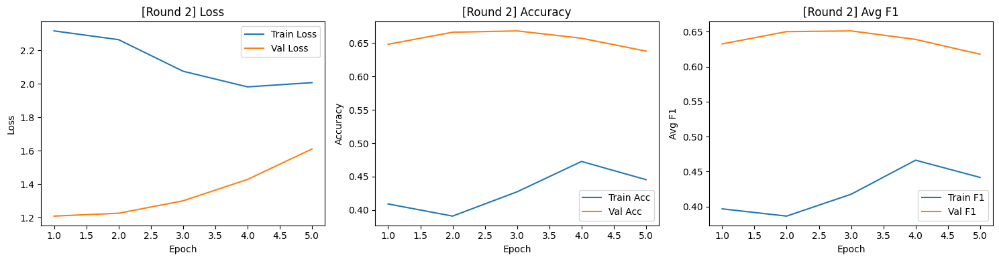


[AL Round 3/20] — Labeled samples: 120



Epoch 5/5
Train — Loss: 1.6414 | Acc: 0.5583 | Avg F1: 0.5417
Val   — Loss: 2.8650 | Acc: 0.5630 | Avg F1: 0.5117


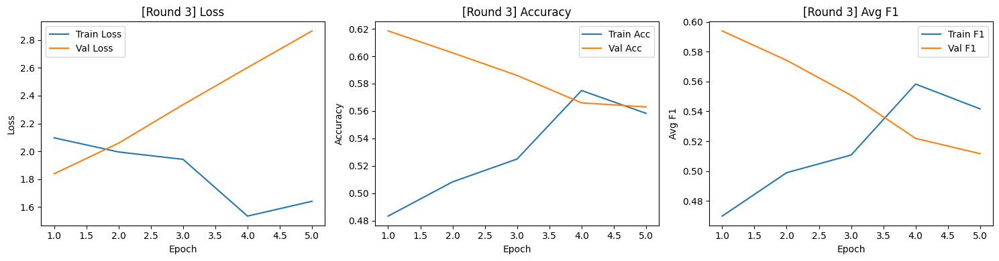


[AL Round 4/20] — Labeled samples: 130



Epoch 5/5
Train — Loss: 1.6969 | Acc: 0.5923 | Avg F1: 0.5512
Val   — Loss: 3.6774 | Acc: 0.5897 | Avg F1: 0.5476


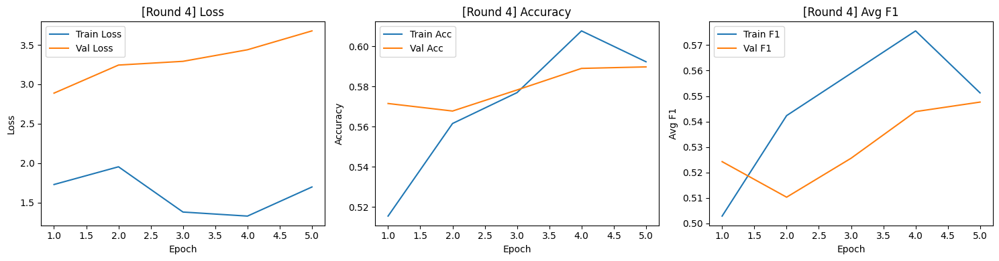


[AL Round 5/20] — Labeled samples: 140



Epoch 10/10
Train — Loss: 1.0154 | Acc: 0.7286 | Avg F1: 0.6986
Val   — Loss: 2.7143 | Acc: 0.6415 | Avg F1: 0.6167


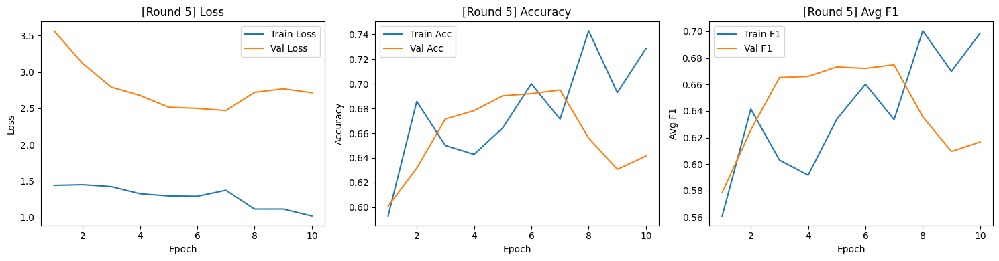


[AL Round 6/20] — Labeled samples: 150



Epoch 10/10
Train — Loss: 0.9955 | Acc: 0.7600 | Avg F1: 0.7057
Val   — Loss: 1.7279 | Acc: 0.7788 | Avg F1: 0.7769


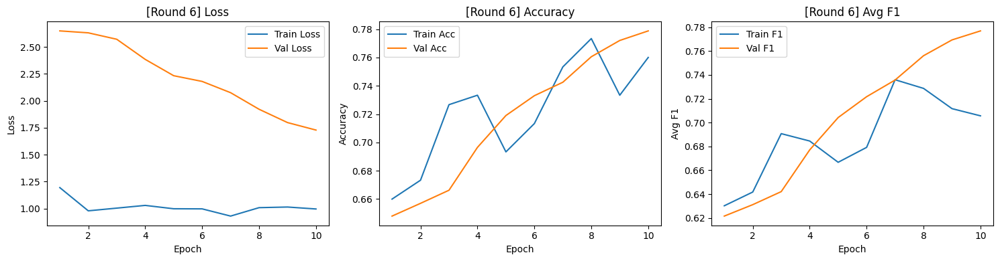


[AL Round 7/20] — Labeled samples: 160



Epoch 10/10
Train — Loss: 0.9283 | Acc: 0.7500 | Avg F1: 0.6895
Val   — Loss: 1.6591 | Acc: 0.7568 | Avg F1: 0.7420


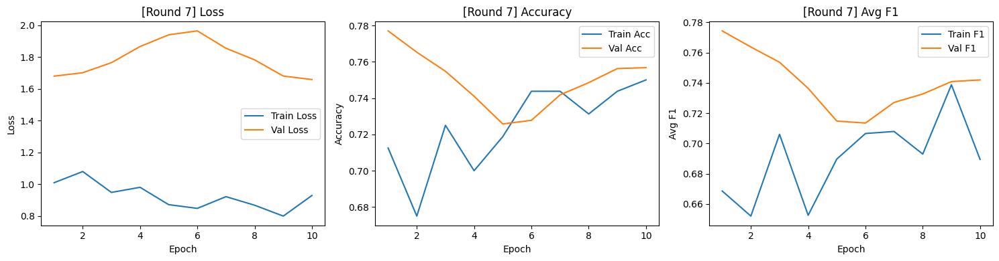


[AL Round 8/20] — Labeled samples: 170



Epoch 10/10
Train — Loss: 0.8677 | Acc: 0.7471 | Avg F1: 0.7565
Val   — Loss: 1.6455 | Acc: 0.7422 | Avg F1: 0.7278


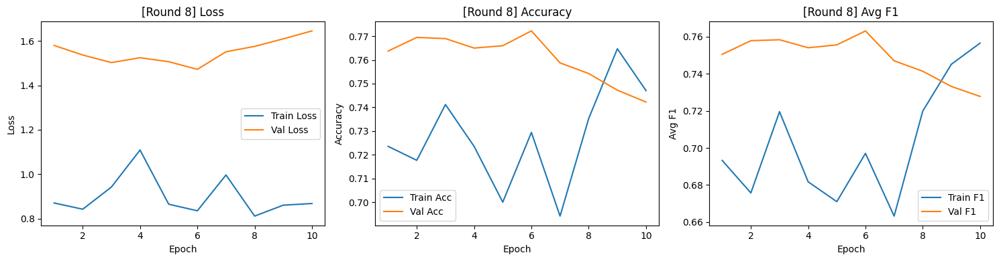


[AL Round 9/20] — Labeled samples: 180



Epoch 10/10
Train — Loss: 0.7502 | Acc: 0.7722 | Avg F1: 0.7197
Val   — Loss: 1.4274 | Acc: 0.7758 | Avg F1: 0.7703


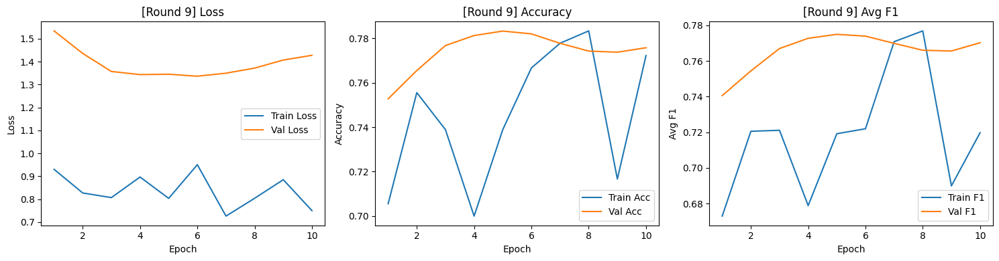


[AL Round 10/20] — Labeled samples: 190



Epoch 10/10
Train — Loss: 0.7309 | Acc: 0.7737 | Avg F1: 0.7468
Val   — Loss: 1.2004 | Acc: 0.8010 | Avg F1: 0.7972


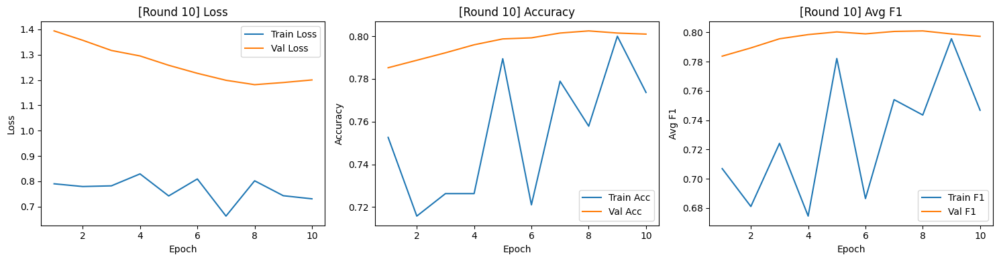


[AL Round 11/20] — Labeled samples: 200



Epoch 10/10
Train — Loss: 0.7298 | Acc: 0.7900 | Avg F1: 0.7682
Val   — Loss: 1.1090 | Acc: 0.7715 | Avg F1: 0.7721


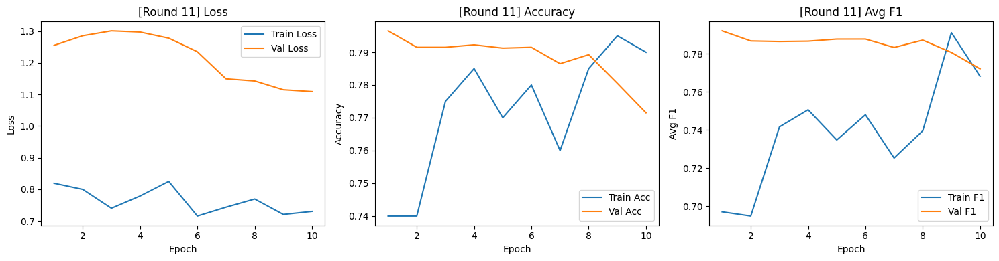


[AL Round 12/20] — Labeled samples: 210



Epoch 15/15
Train — Loss: 0.6265 | Acc: 0.8000 | Avg F1: 0.7845
Val   — Loss: 0.9713 | Acc: 0.8050 | Avg F1: 0.8071


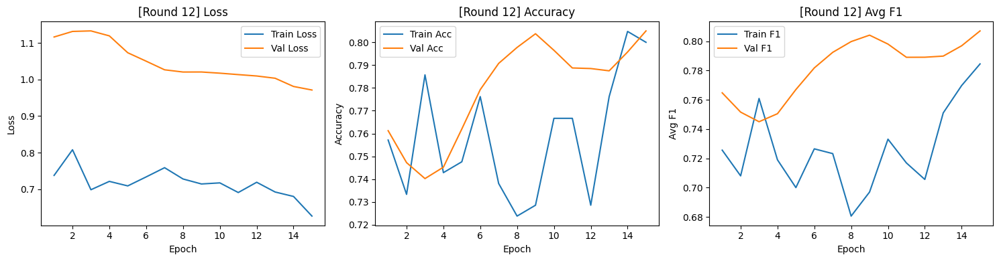


[AL Round 13/20] — Labeled samples: 220



Epoch 15/15
Train — Loss: 0.6532 | Acc: 0.7864 | Avg F1: 0.7606
Val   — Loss: 0.8948 | Acc: 0.8205 | Avg F1: 0.8251


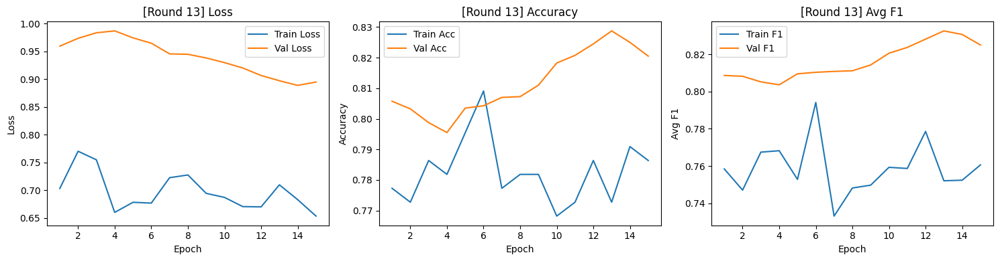


[AL Round 14/20] — Labeled samples: 230



Epoch 15/15
Train — Loss: 0.5958 | Acc: 0.8043 | Avg F1: 0.7986
Val   — Loss: 0.9111 | Acc: 0.7975 | Avg F1: 0.8100


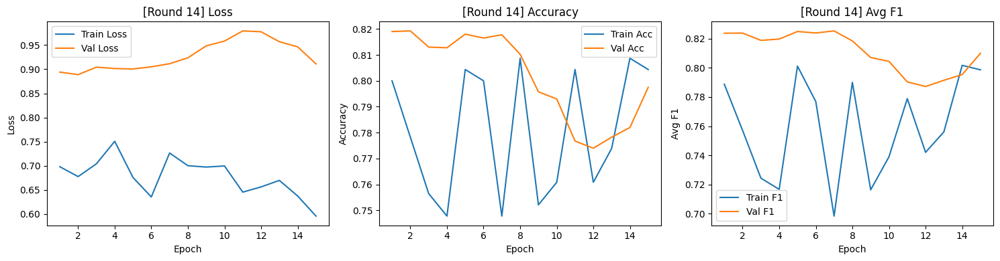


[AL Round 15/20] — Labeled samples: 240



Epoch 15/15
Train — Loss: 0.6560 | Acc: 0.7875 | Avg F1: 0.7814
Val   — Loss: 0.9005 | Acc: 0.7910 | Avg F1: 0.8048


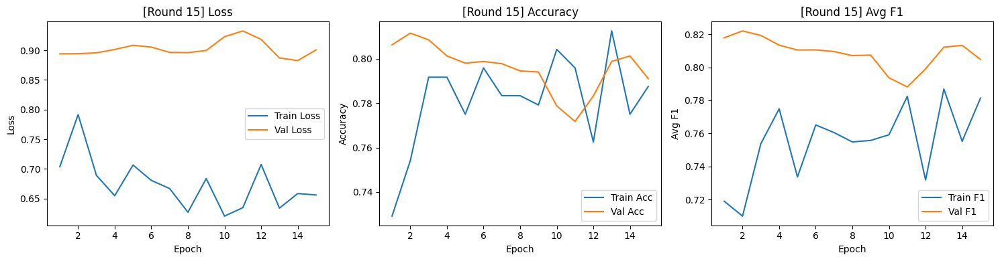


[AL Round 16/20] — Labeled samples: 250



Epoch 15/15
Train — Loss: 0.6439 | Acc: 0.7920 | Avg F1: 0.7475
Val   — Loss: 0.9055 | Acc: 0.7655 | Avg F1: 0.7822


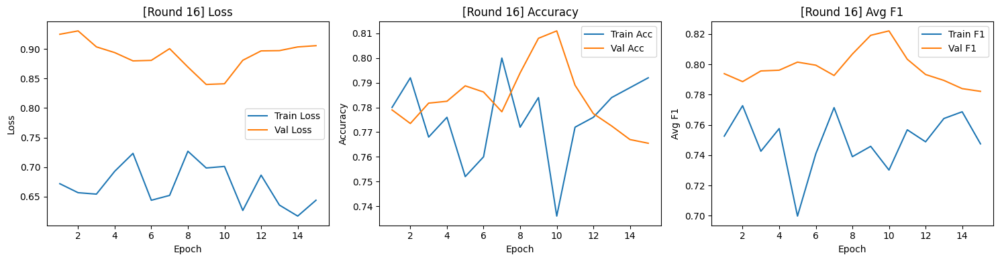


[AL Round 17/20] — Labeled samples: 260



Epoch 15/15
Train — Loss: 0.6319 | Acc: 0.8077 | Avg F1: 0.7974
Val   — Loss: 0.9441 | Acc: 0.7522 | Avg F1: 0.7682


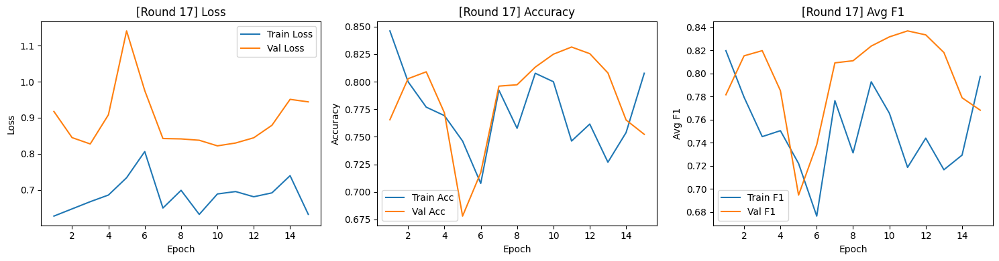


[AL Round 18/20] — Labeled samples: 270



Epoch 15/15
Train — Loss: 0.6495 | Acc: 0.8074 | Avg F1: 0.7810
Val   — Loss: 0.8623 | Acc: 0.7893 | Avg F1: 0.8004


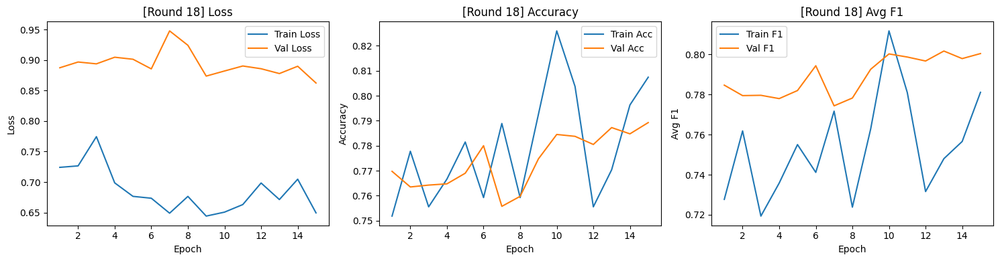


[AL Round 19/20] — Labeled samples: 280



Epoch 15/15
Train — Loss: 0.6460 | Acc: 0.8214 | Avg F1: 0.7936
Val   — Loss: 0.9129 | Acc: 0.7883 | Avg F1: 0.8044


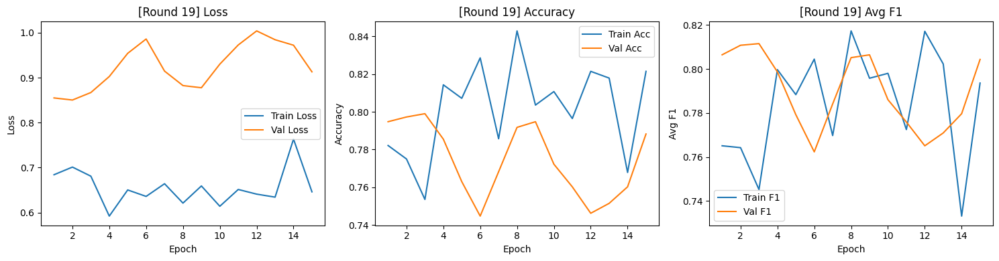


[AL Round 20/20] — Labeled samples: 290



Epoch 15/15
Train — Loss: 0.6424 | Acc: 0.7931 | Avg F1: 0.7773
Val   — Loss: 0.9800 | Acc: 0.7615 | Avg F1: 0.7781


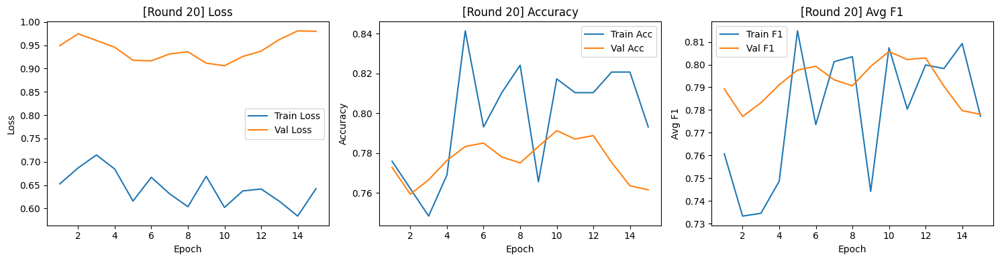

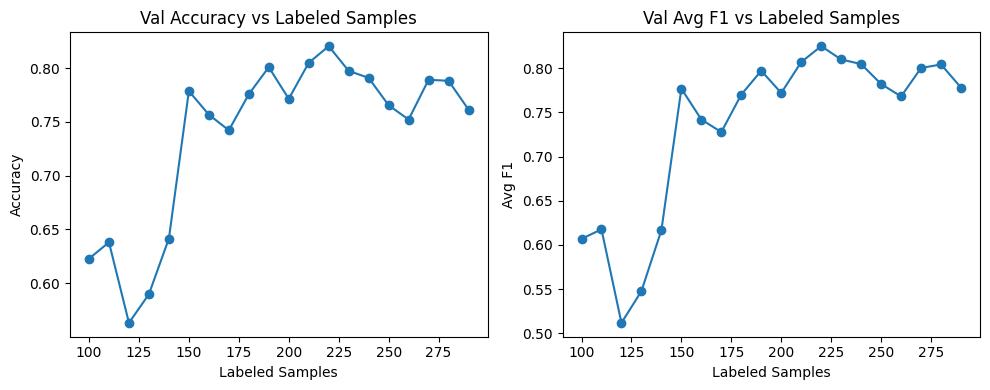

X_labeled shape: (300, 6, 28)
y_labeled shape: (300,)
X_unlabeled shape: (15700, 6, 28)
y_unlabeled shape: (15700,)

=== Running strategy: DIVERSITY ===

[AL Round 1/20] — Labeled samples: 300



Epoch 5/5
Train — Loss: 1.8380 | Acc: 0.5600 | Avg F1: 0.5463
Val   — Loss: 1.6190 | Acc: 0.7060 | Avg F1: 0.6881


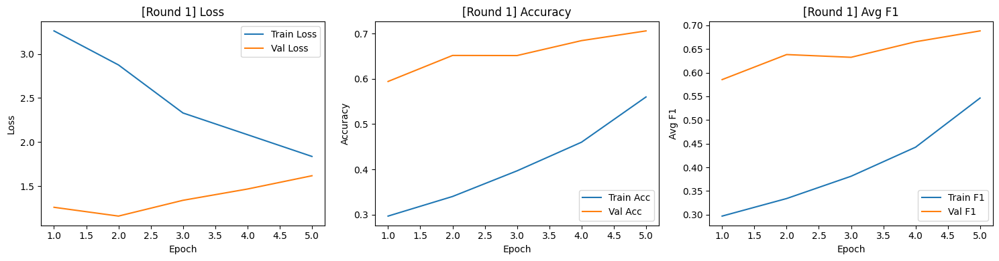


[AL Round 2/20] — Labeled samples: 310



Epoch 5/5
Train — Loss: 1.4780 | Acc: 0.6355 | Avg F1: 0.6141
Val   — Loss: 1.3629 | Acc: 0.7875 | Avg F1: 0.7714


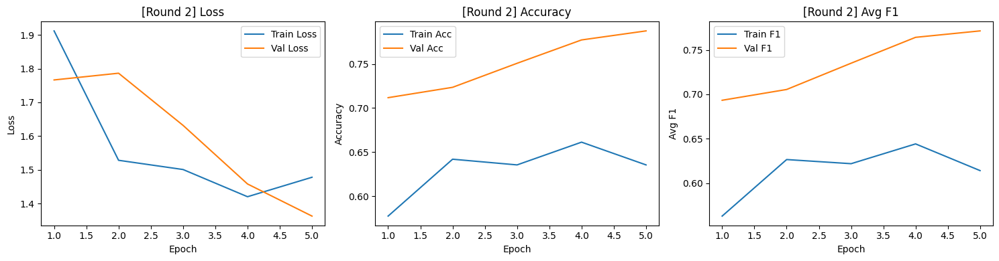


[AL Round 3/20] — Labeled samples: 320



Epoch 5/5
Train — Loss: 1.0383 | Acc: 0.7562 | Avg F1: 0.7424
Val   — Loss: 1.1796 | Acc: 0.7930 | Avg F1: 0.7843


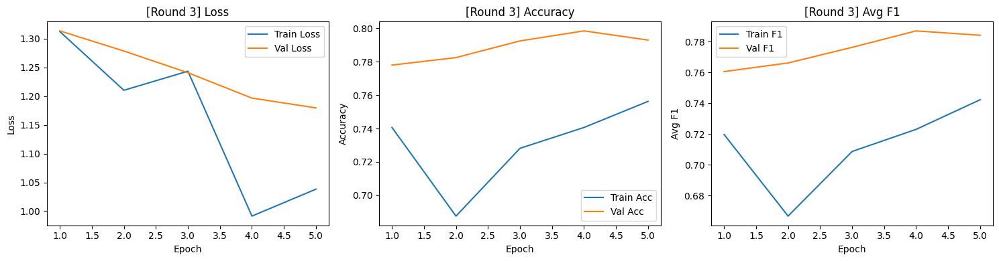


[AL Round 4/20] — Labeled samples: 330



Epoch 5/5
Train — Loss: 1.0505 | Acc: 0.7697 | Avg F1: 0.7507
Val   — Loss: 1.1571 | Acc: 0.7690 | Avg F1: 0.7622


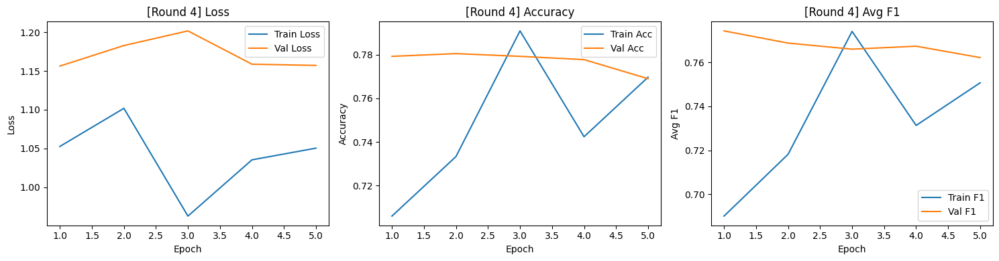


[AL Round 5/20] — Labeled samples: 340



Epoch 10/10
Train — Loss: 0.7993 | Acc: 0.8118 | Avg F1: 0.8180
Val   — Loss: 0.9484 | Acc: 0.7880 | Avg F1: 0.7848


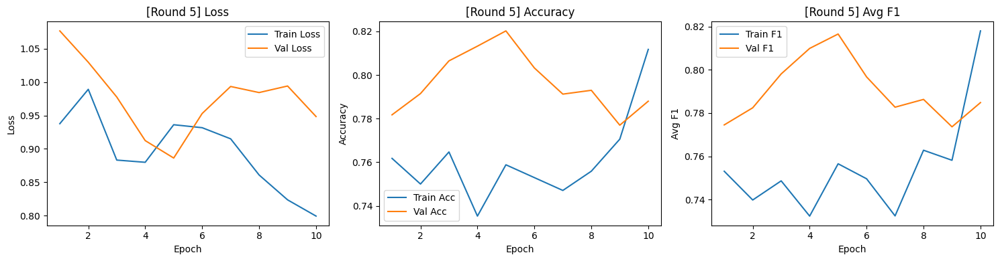


[AL Round 6/20] — Labeled samples: 350



Epoch 10/10
Train — Loss: 0.8138 | Acc: 0.7829 | Avg F1: 0.7778
Val   — Loss: 0.8986 | Acc: 0.7770 | Avg F1: 0.7850


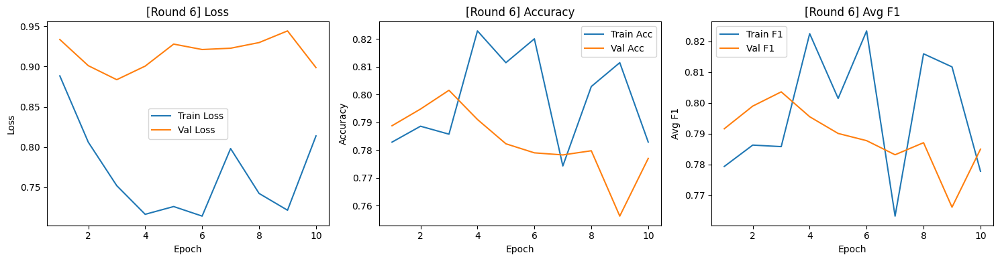


[AL Round 7/20] — Labeled samples: 360



Epoch 10/10
Train — Loss: 0.6272 | Acc: 0.7972 | Avg F1: 0.8168
Val   — Loss: 0.8393 | Acc: 0.7965 | Avg F1: 0.8037


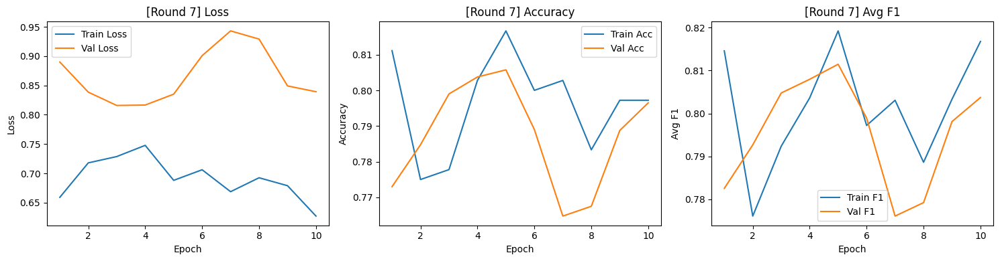


[AL Round 8/20] — Labeled samples: 370



Epoch 10/10
Train — Loss: 0.6370 | Acc: 0.8405 | Avg F1: 0.8416
Val   — Loss: 0.8839 | Acc: 0.7482 | Avg F1: 0.7610


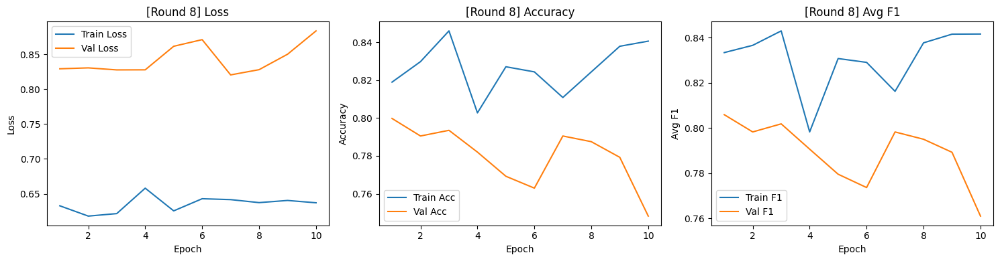


[AL Round 9/20] — Labeled samples: 380



Epoch 10/10
Train — Loss: 0.5836 | Acc: 0.8526 | Avg F1: 0.8532
Val   — Loss: 0.8278 | Acc: 0.7435 | Avg F1: 0.7578


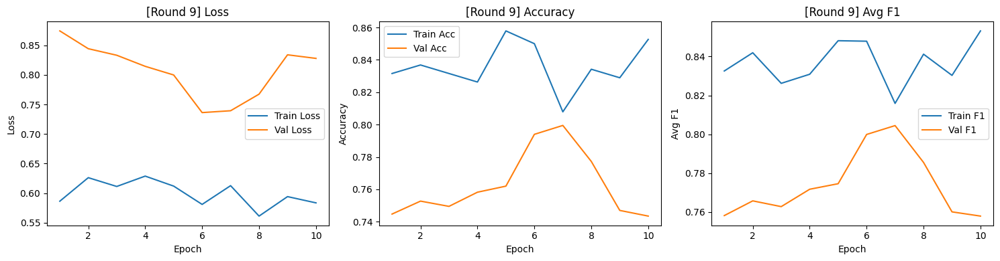


[AL Round 10/20] — Labeled samples: 390



Epoch 10/10
Train — Loss: 0.5834 | Acc: 0.8385 | Avg F1: 0.8452
Val   — Loss: 0.7459 | Acc: 0.8055 | Avg F1: 0.8116


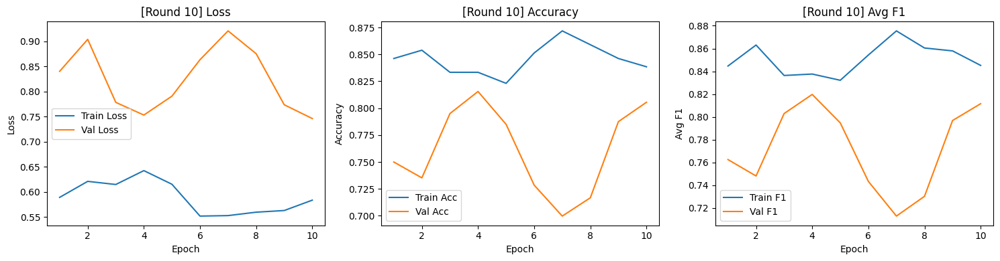


[AL Round 11/20] — Labeled samples: 400



Epoch 10/10
Train — Loss: 0.5383 | Acc: 0.8500 | Avg F1: 0.8675
Val   — Loss: 0.8364 | Acc: 0.7360 | Avg F1: 0.7494


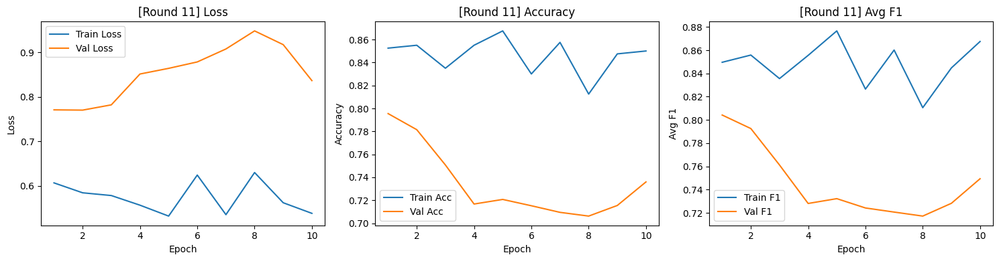


[AL Round 12/20] — Labeled samples: 410



Epoch 15/15
Train — Loss: 0.4863 | Acc: 0.8805 | Avg F1: 0.8949
Val   — Loss: 0.8176 | Acc: 0.7458 | Avg F1: 0.7568


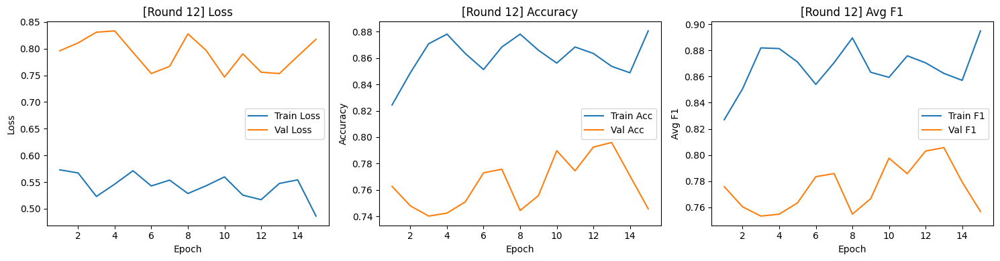


[AL Round 13/20] — Labeled samples: 420



Epoch 15/15
Train — Loss: 0.5323 | Acc: 0.8929 | Avg F1: 0.8977
Val   — Loss: 0.7944 | Acc: 0.7608 | Avg F1: 0.7720


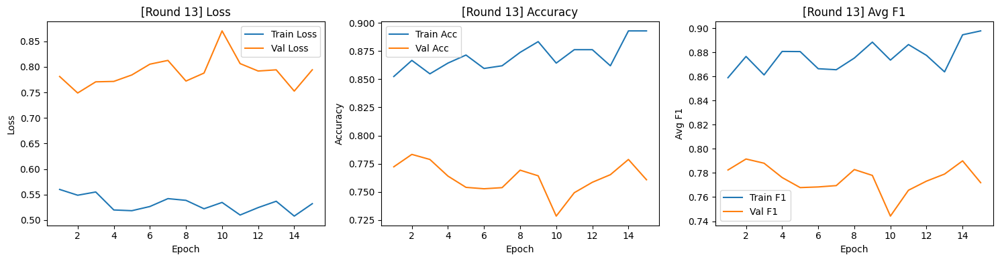


[AL Round 14/20] — Labeled samples: 430



Epoch 15/15
Train — Loss: 0.5086 | Acc: 0.8930 | Avg F1: 0.8976
Val   — Loss: 0.7415 | Acc: 0.7923 | Avg F1: 0.8052


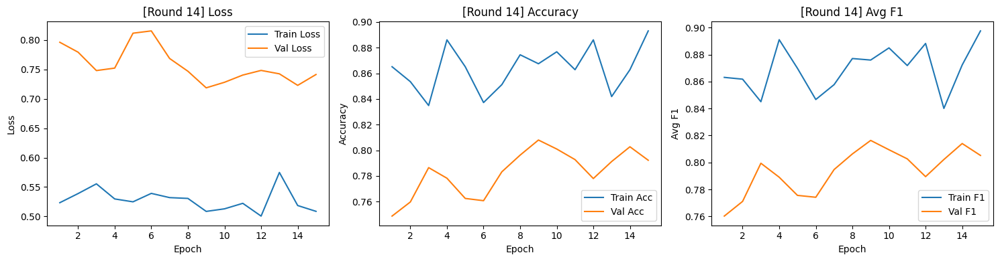


[AL Round 15/20] — Labeled samples: 440



Epoch 15/15
Train — Loss: 0.5096 | Acc: 0.8705 | Avg F1: 0.8843
Val   — Loss: 0.7093 | Acc: 0.8040 | Avg F1: 0.8137


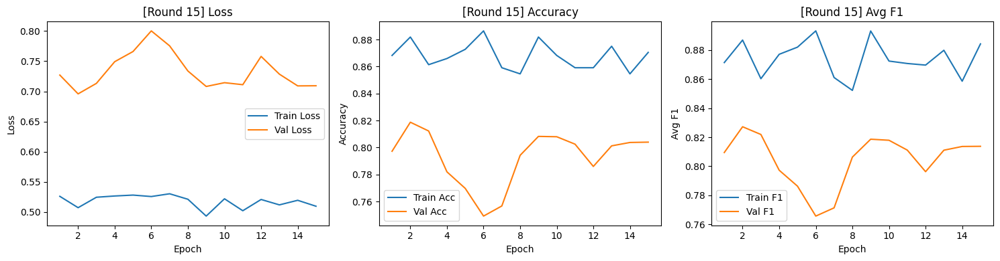


[AL Round 16/20] — Labeled samples: 450



Epoch 15/15
Train — Loss: 0.5559 | Acc: 0.8533 | Avg F1: 0.8616
Val   — Loss: 0.8043 | Acc: 0.7855 | Avg F1: 0.7952


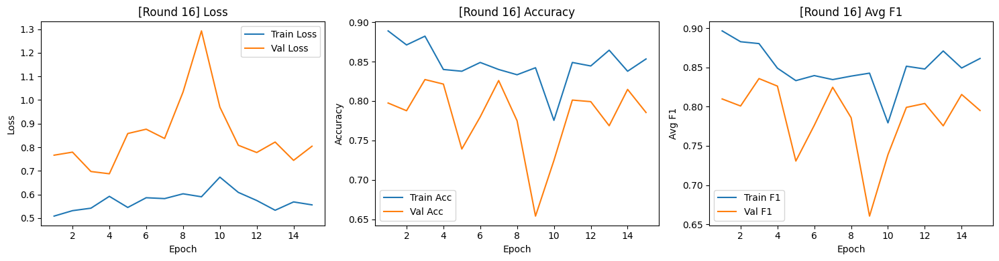


[AL Round 17/20] — Labeled samples: 460



Epoch 15/15
Train — Loss: 0.4880 | Acc: 0.8870 | Avg F1: 0.8919
Val   — Loss: 0.7728 | Acc: 0.7970 | Avg F1: 0.8090


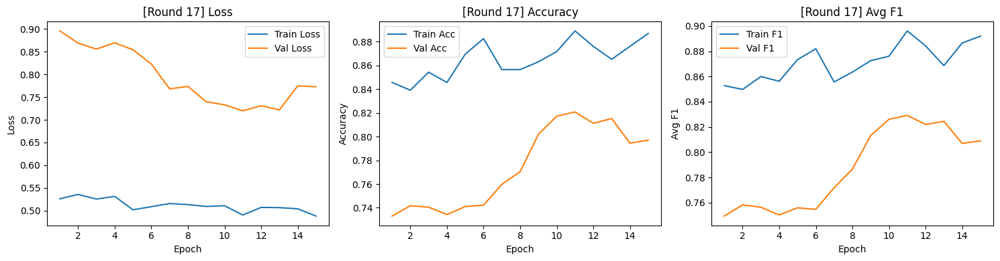


[AL Round 18/20] — Labeled samples: 470



Epoch 15/15
Train — Loss: 0.4851 | Acc: 0.9064 | Avg F1: 0.9085
Val   — Loss: 0.7863 | Acc: 0.7890 | Avg F1: 0.8031


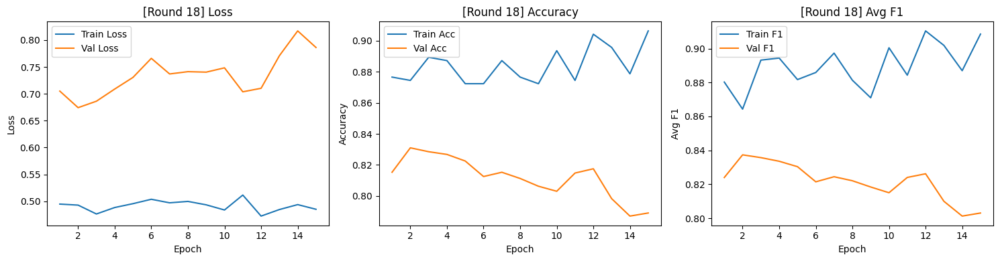


[AL Round 19/20] — Labeled samples: 480



Epoch 15/15
Train — Loss: 0.4983 | Acc: 0.8729 | Avg F1: 0.8803
Val   — Loss: 0.7495 | Acc: 0.8025 | Avg F1: 0.8145


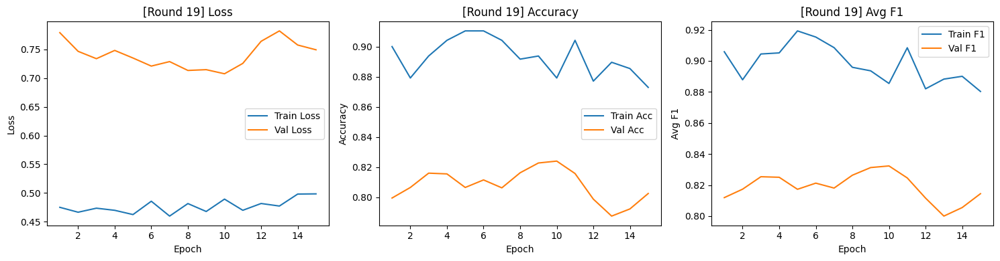


[AL Round 20/20] — Labeled samples: 490



Epoch 15/15
Train — Loss: 0.4703 | Acc: 0.9041 | Avg F1: 0.9004
Val   — Loss: 0.7210 | Acc: 0.8130 | Avg F1: 0.8244


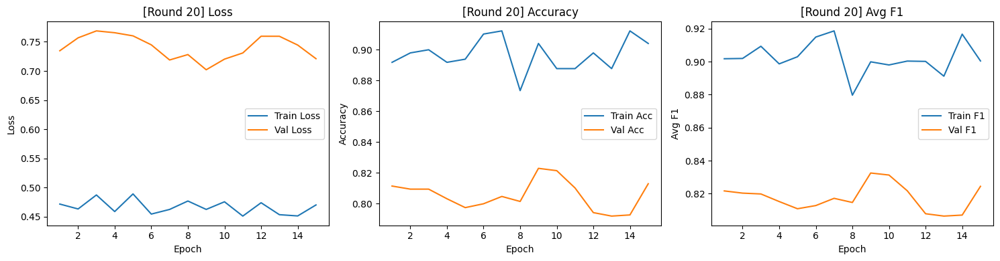

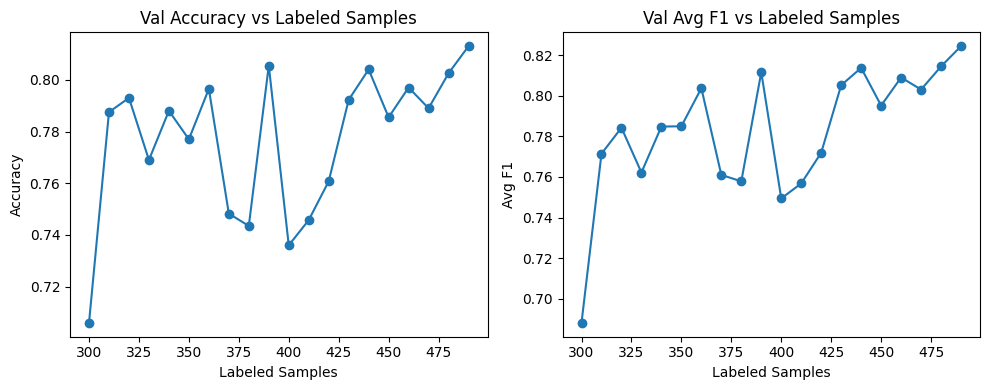


=== Running strategy: ENTROPY ===

[AL Round 1/20] — Labeled samples: 300



Epoch 5/5
Train — Loss: 1.9358 | Acc: 0.5233 | Avg F1: 0.5161
Val   — Loss: 1.5236 | Acc: 0.6905 | Avg F1: 0.6706


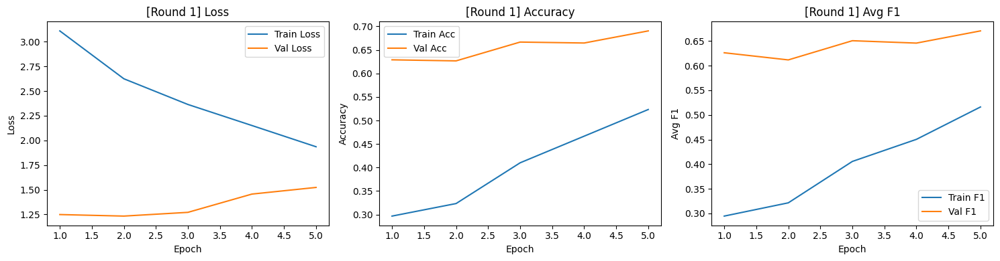


[AL Round 2/20] — Labeled samples: 310



Epoch 5/5
Train — Loss: 1.5289 | Acc: 0.6355 | Avg F1: 0.6111
Val   — Loss: 1.4479 | Acc: 0.7808 | Avg F1: 0.7615


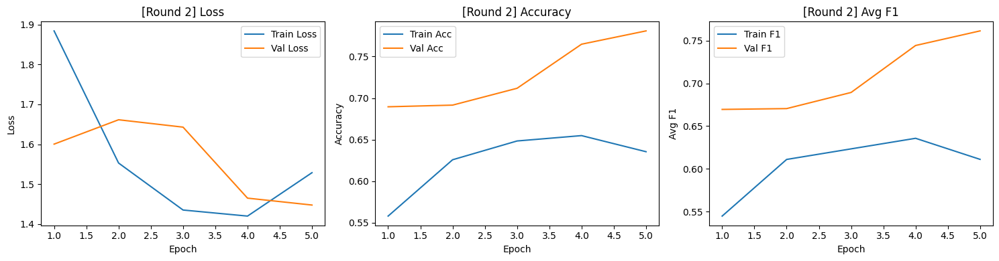


[AL Round 3/20] — Labeled samples: 320



Epoch 5/5
Train — Loss: 1.1049 | Acc: 0.7406 | Avg F1: 0.7156
Val   — Loss: 1.1434 | Acc: 0.8215 | Avg F1: 0.8174


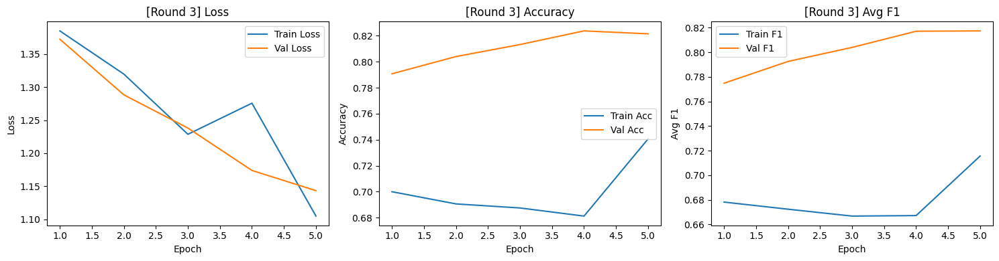


[AL Round 4/20] — Labeled samples: 330



Epoch 5/5
Train — Loss: 0.9762 | Acc: 0.7545 | Avg F1: 0.7369
Val   — Loss: 1.0328 | Acc: 0.8293 | Avg F1: 0.8253


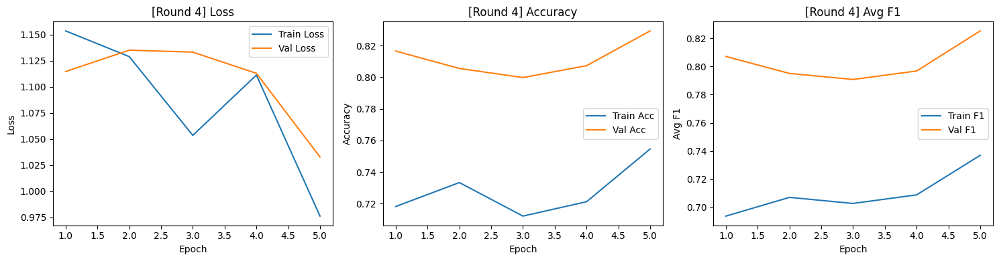


[AL Round 5/20] — Labeled samples: 340



Epoch 10/10
Train — Loss: 0.8823 | Acc: 0.7618 | Avg F1: 0.7447
Val   — Loss: 0.9862 | Acc: 0.8125 | Avg F1: 0.8100


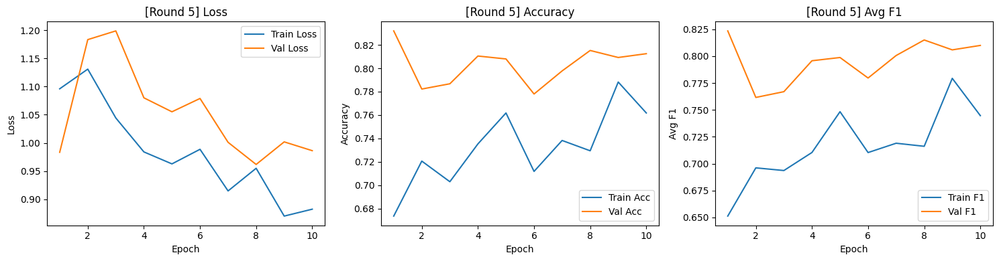


[AL Round 6/20] — Labeled samples: 350



Epoch 10/10
Train — Loss: 0.7525 | Acc: 0.7714 | Avg F1: 0.7665
Val   — Loss: 0.8809 | Acc: 0.8410 | Avg F1: 0.8379


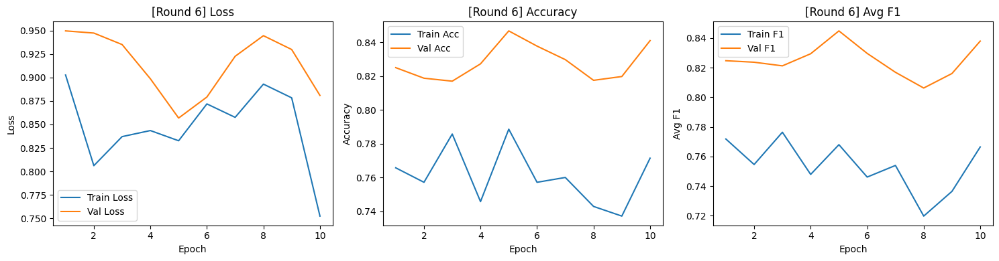


[AL Round 7/20] — Labeled samples: 360



Epoch 10/10
Train — Loss: 0.7381 | Acc: 0.7583 | Avg F1: 0.7527
Val   — Loss: 0.8303 | Acc: 0.8403 | Avg F1: 0.8366


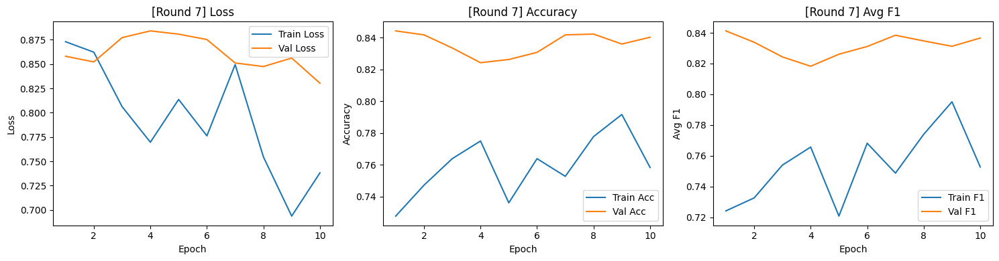


[AL Round 8/20] — Labeled samples: 370



Epoch 10/10
Train — Loss: 0.7967 | Acc: 0.7541 | Avg F1: 0.7416
Val   — Loss: 0.8392 | Acc: 0.8310 | Avg F1: 0.8303


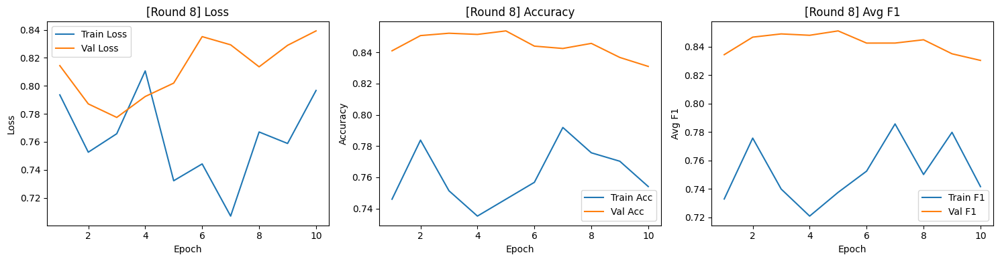


[AL Round 9/20] — Labeled samples: 380



Epoch 10/10
Train — Loss: 0.7203 | Acc: 0.7737 | Avg F1: 0.7714
Val   — Loss: 0.7636 | Acc: 0.8470 | Avg F1: 0.8466


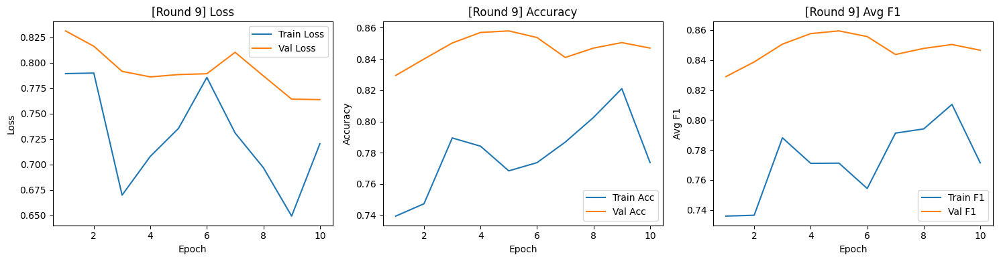


[AL Round 10/20] — Labeled samples: 390



Epoch 10/10
Train — Loss: 0.6850 | Acc: 0.7744 | Avg F1: 0.7692
Val   — Loss: 0.8337 | Acc: 0.8057 | Avg F1: 0.8150


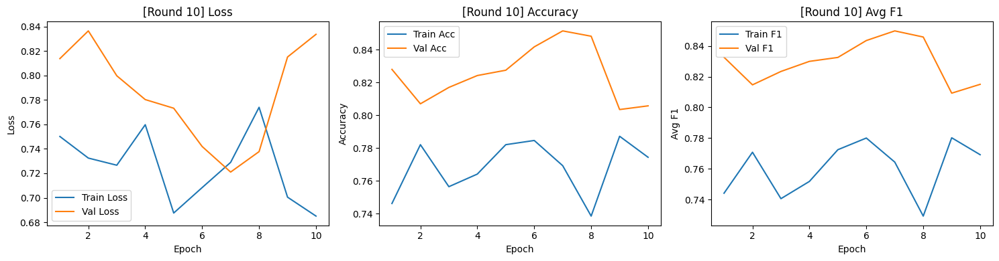


[AL Round 11/20] — Labeled samples: 400



Epoch 10/10
Train — Loss: 0.6784 | Acc: 0.7600 | Avg F1: 0.7604
Val   — Loss: 0.7772 | Acc: 0.8317 | Avg F1: 0.8362


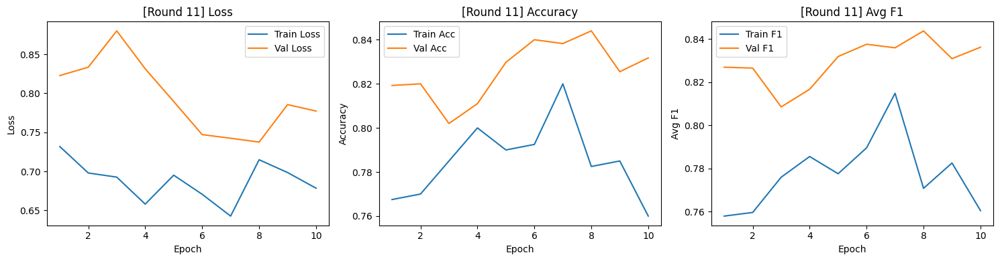


[AL Round 12/20] — Labeled samples: 410



Epoch 15/15
Train — Loss: 0.6787 | Acc: 0.7927 | Avg F1: 0.7759
Val   — Loss: 0.7673 | Acc: 0.8373 | Avg F1: 0.8412


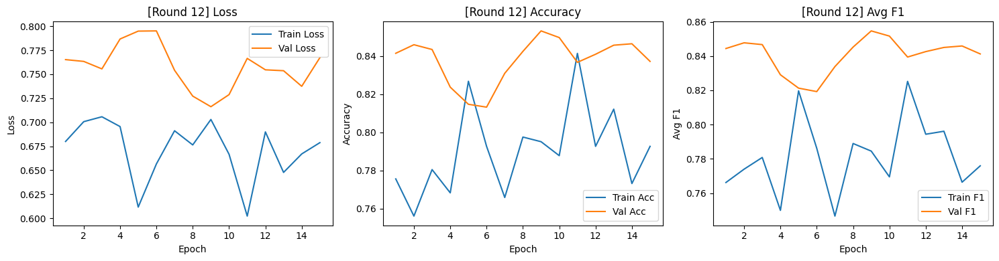


[AL Round 13/20] — Labeled samples: 420



Epoch 15/15
Train — Loss: 0.6421 | Acc: 0.7976 | Avg F1: 0.7918
Val   — Loss: 0.7184 | Acc: 0.8490 | Avg F1: 0.8516


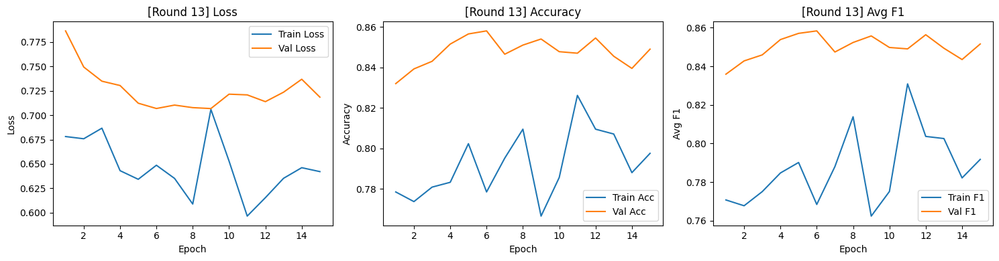


[AL Round 14/20] — Labeled samples: 430



Epoch 15/15
Train — Loss: 0.5878 | Acc: 0.8233 | Avg F1: 0.8148
Val   — Loss: 0.7569 | Acc: 0.8260 | Avg F1: 0.8307


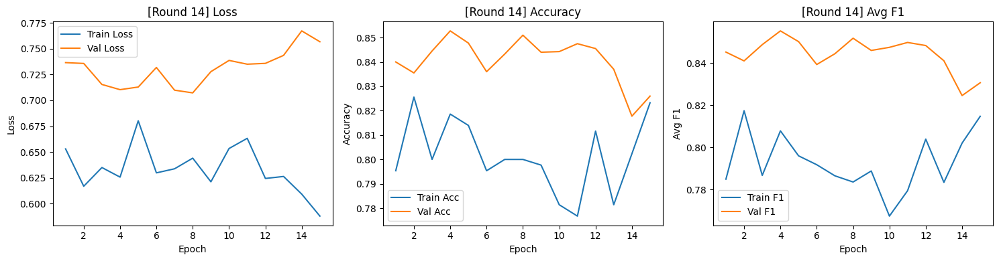


[AL Round 15/20] — Labeled samples: 440



Epoch 15/15
Train — Loss: 0.6155 | Acc: 0.8159 | Avg F1: 0.8053
Val   — Loss: 0.7276 | Acc: 0.8468 | Avg F1: 0.8492


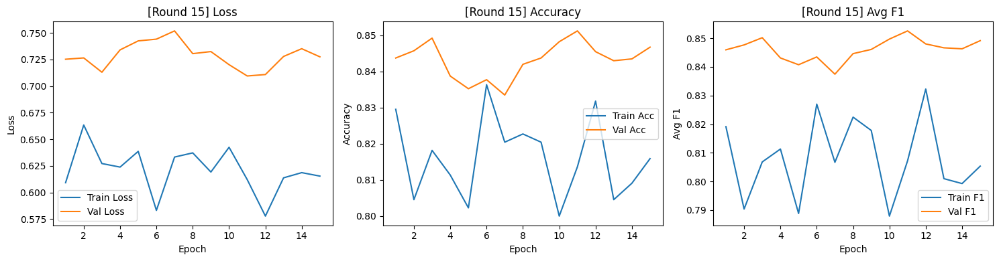


[AL Round 16/20] — Labeled samples: 450



Epoch 15/15
Train — Loss: 0.6396 | Acc: 0.7800 | Avg F1: 0.7673
Val   — Loss: 0.9057 | Acc: 0.7605 | Avg F1: 0.7705


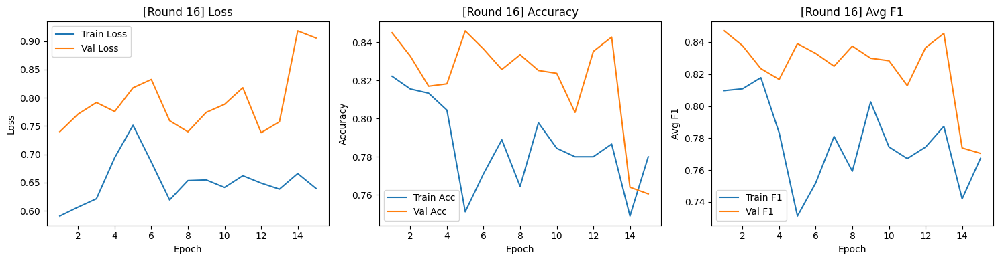


[AL Round 17/20] — Labeled samples: 460



Epoch 15/15
Train — Loss: 0.6017 | Acc: 0.8217 | Avg F1: 0.8156
Val   — Loss: 0.7778 | Acc: 0.8430 | Avg F1: 0.8428


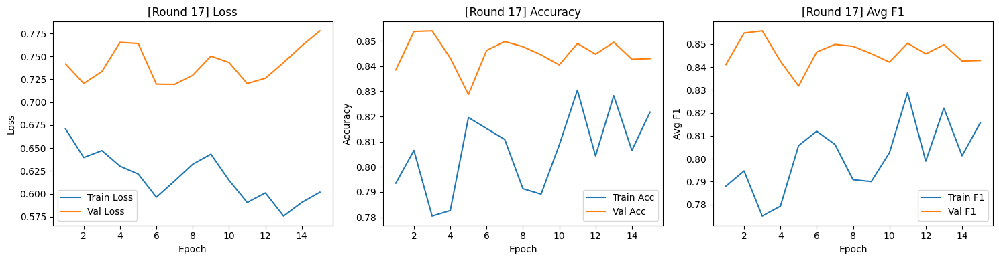


[AL Round 18/20] — Labeled samples: 470



Epoch 15/15
Train — Loss: 0.5937 | Acc: 0.8191 | Avg F1: 0.8111
Val   — Loss: 0.7355 | Acc: 0.8462 | Avg F1: 0.8459


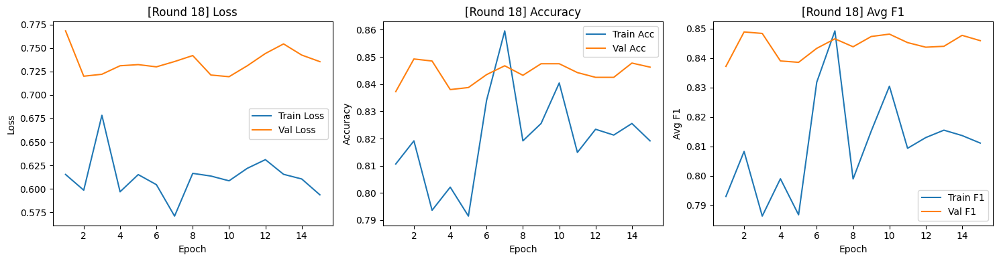


[AL Round 19/20] — Labeled samples: 480



Epoch 15/15
Train — Loss: 0.5640 | Acc: 0.8438 | Avg F1: 0.8338
Val   — Loss: 0.7204 | Acc: 0.8480 | Avg F1: 0.8497


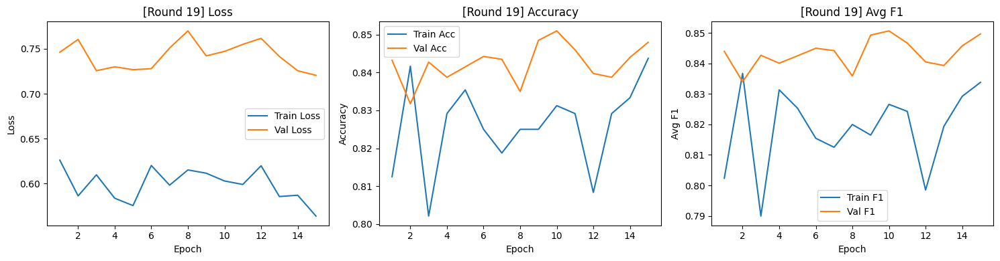


[AL Round 20/20] — Labeled samples: 490



Epoch 15/15
Train — Loss: 0.5947 | Acc: 0.8143 | Avg F1: 0.8080
Val   — Loss: 0.7763 | Acc: 0.8343 | Avg F1: 0.8374


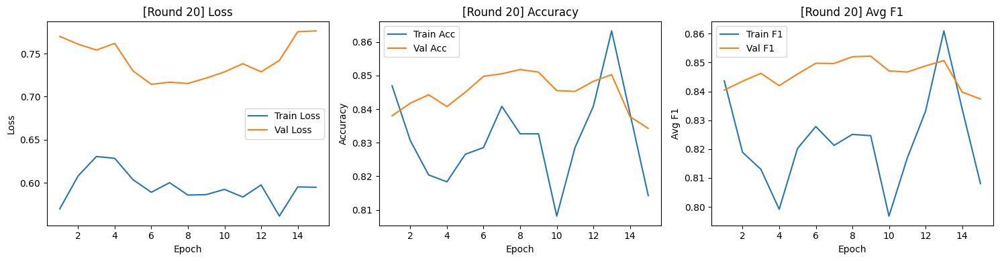

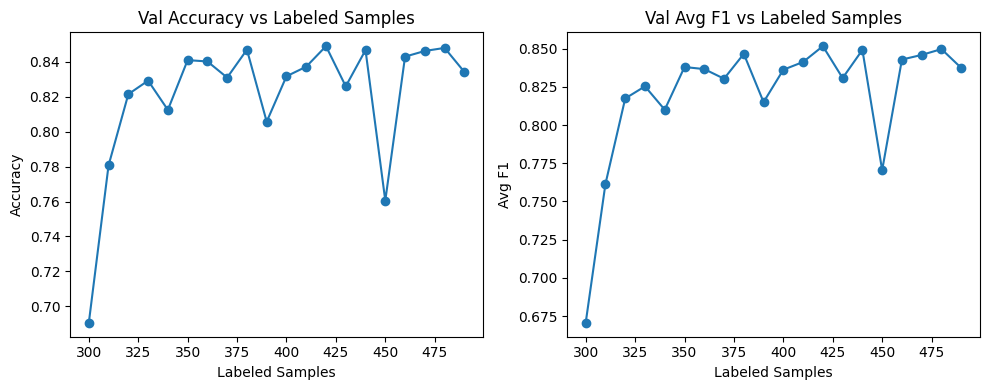


=== Running strategy: ENTROPY_DIVERSITY ===

[AL Round 1/20] — Labeled samples: 300



Epoch 5/5
Train — Loss: 1.9928 | Acc: 0.5000 | Avg F1: 0.4890
Val   — Loss: 1.8503 | Acc: 0.6800 | Avg F1: 0.6598


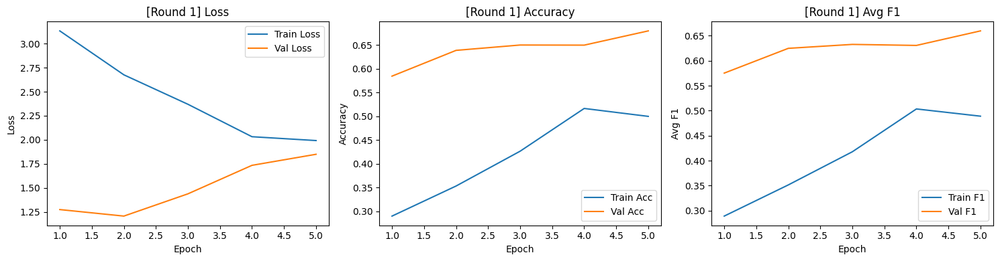


[AL Round 2/20] — Labeled samples: 310



Epoch 5/5
Train — Loss: 1.3486 | Acc: 0.6645 | Avg F1: 0.6469
Val   — Loss: 1.5400 | Acc: 0.7498 | Avg F1: 0.7288


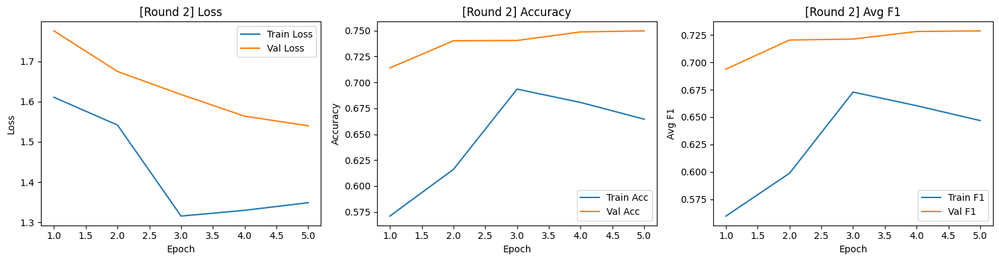


[AL Round 3/20] — Labeled samples: 320



Epoch 5/5
Train — Loss: 1.2078 | Acc: 0.7188 | Avg F1: 0.7022
Val   — Loss: 1.2531 | Acc: 0.7893 | Avg F1: 0.7775


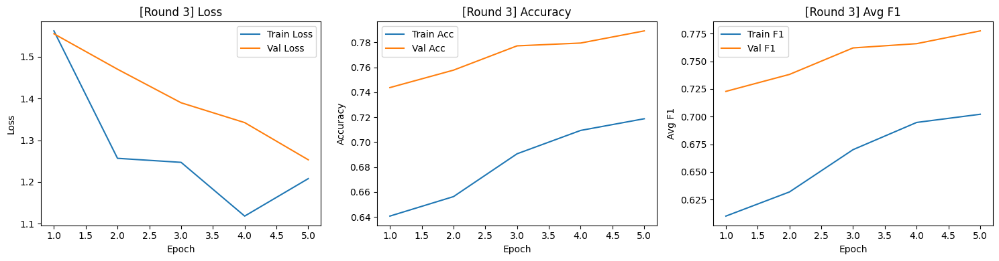


[AL Round 4/20] — Labeled samples: 330



Epoch 5/5
Train — Loss: 1.0837 | Acc: 0.6818 | Avg F1: 0.6619
Val   — Loss: 0.9822 | Acc: 0.8125 | Avg F1: 0.8061


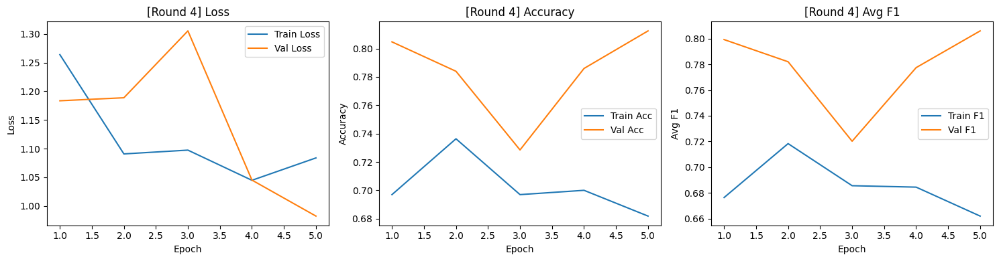


[AL Round 5/20] — Labeled samples: 340



Epoch 10/10
Train — Loss: 0.8237 | Acc: 0.7500 | Avg F1: 0.7540
Val   — Loss: 0.9217 | Acc: 0.8117 | Avg F1: 0.8116


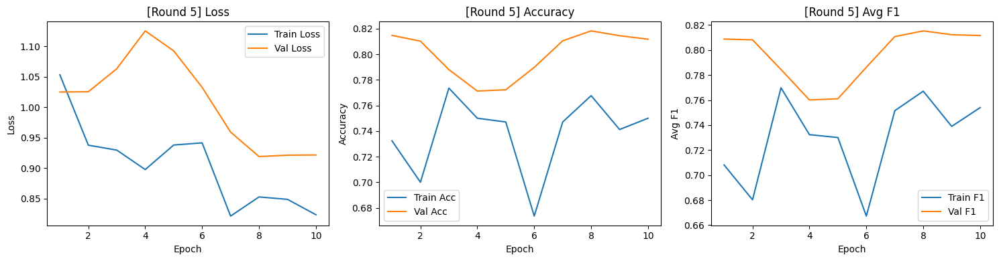


[AL Round 6/20] — Labeled samples: 350



Epoch 10/10
Train — Loss: 0.8117 | Acc: 0.7429 | Avg F1: 0.7293
Val   — Loss: 1.1227 | Acc: 0.7183 | Avg F1: 0.7272


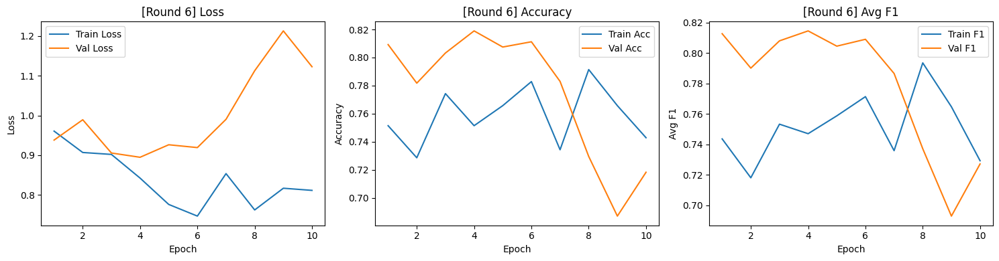


[AL Round 7/20] — Labeled samples: 360



Epoch 10/10
Train — Loss: 0.7632 | Acc: 0.7944 | Avg F1: 0.7901
Val   — Loss: 0.8222 | Acc: 0.8085 | Avg F1: 0.8131


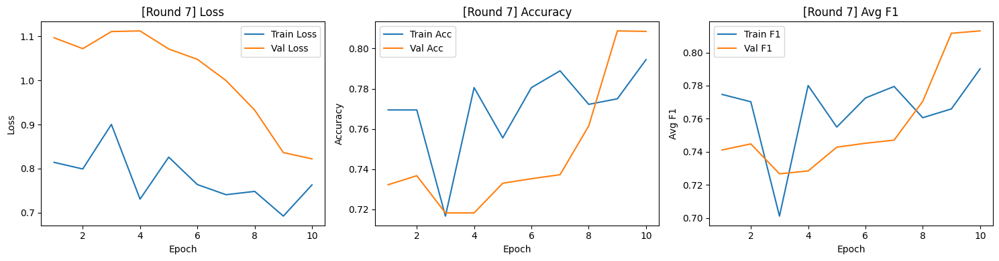


[AL Round 8/20] — Labeled samples: 370



Epoch 10/10
Train — Loss: 0.6906 | Acc: 0.8054 | Avg F1: 0.7980
Val   — Loss: 0.7684 | Acc: 0.8287 | Avg F1: 0.8323


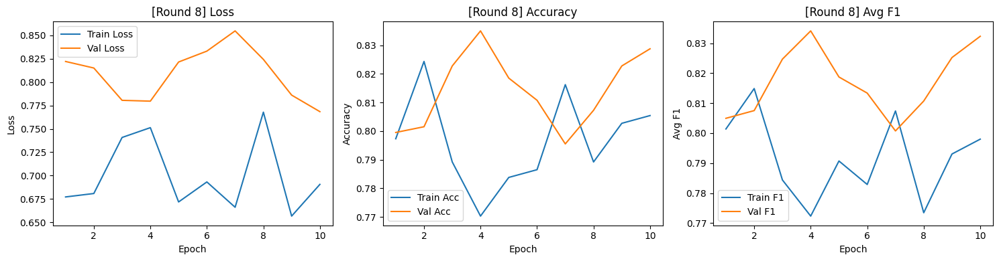


[AL Round 9/20] — Labeled samples: 380



Epoch 10/10
Train — Loss: 0.6546 | Acc: 0.8079 | Avg F1: 0.8041
Val   — Loss: 0.7945 | Acc: 0.8203 | Avg F1: 0.8209


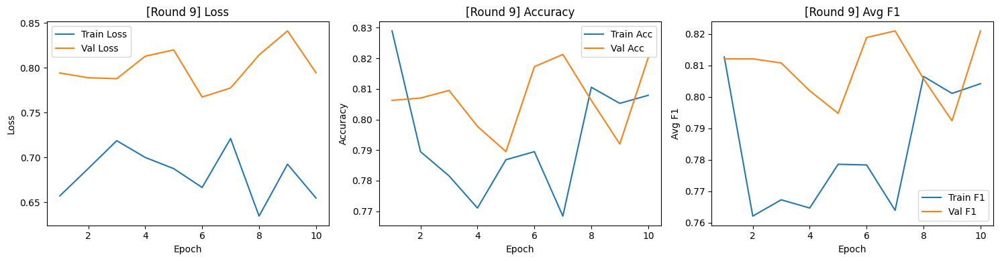


[AL Round 10/20] — Labeled samples: 390



Epoch 10/10
Train — Loss: 0.6506 | Acc: 0.8128 | Avg F1: 0.8117
Val   — Loss: 0.7480 | Acc: 0.8430 | Avg F1: 0.8422


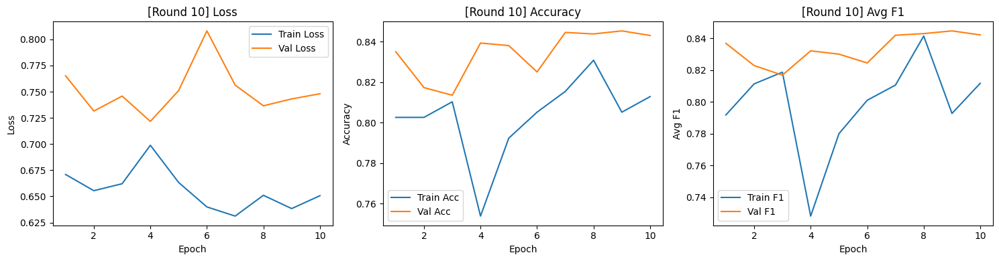


[AL Round 11/20] — Labeled samples: 400



Epoch 10/10
Train — Loss: 0.6180 | Acc: 0.8225 | Avg F1: 0.8135
Val   — Loss: 0.7357 | Acc: 0.8410 | Avg F1: 0.8382


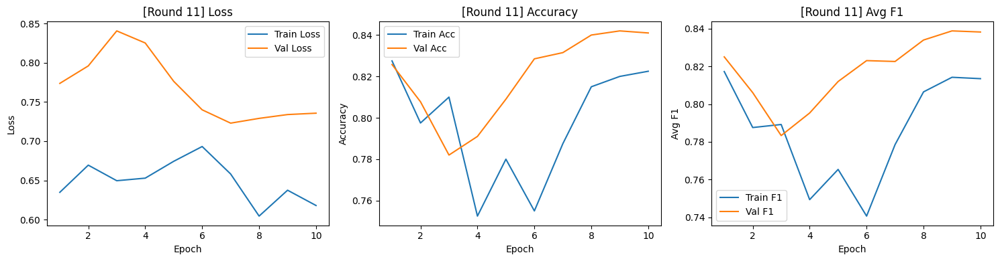


[AL Round 12/20] — Labeled samples: 410



Epoch 15/15
Train — Loss: 0.5943 | Acc: 0.8000 | Avg F1: 0.8013
Val   — Loss: 0.7565 | Acc: 0.8307 | Avg F1: 0.8333


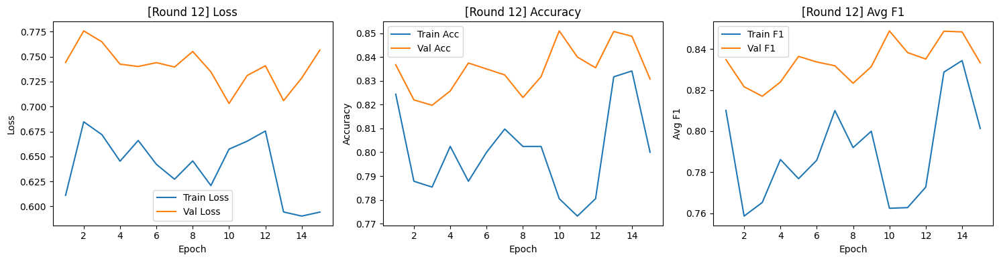


[AL Round 13/20] — Labeled samples: 420



Epoch 15/15
Train — Loss: 0.5704 | Acc: 0.8381 | Avg F1: 0.8316
Val   — Loss: 0.7130 | Acc: 0.8488 | Avg F1: 0.8457


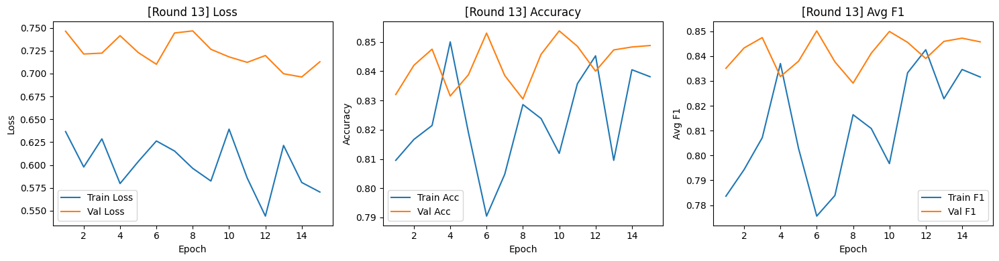


[AL Round 14/20] — Labeled samples: 430



Epoch 15/15
Train — Loss: 0.6030 | Acc: 0.8233 | Avg F1: 0.8257
Val   — Loss: 0.7141 | Acc: 0.8397 | Avg F1: 0.8380


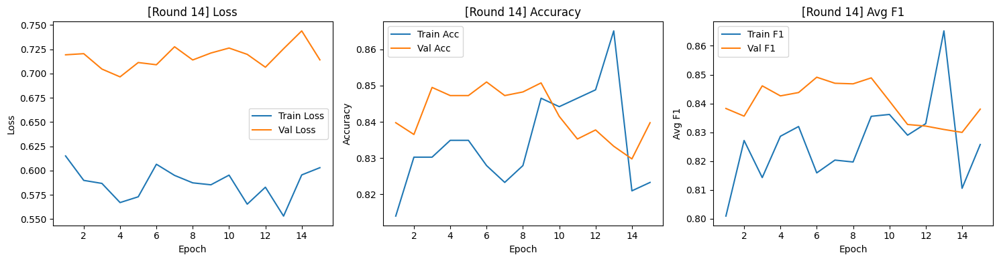


[AL Round 15/20] — Labeled samples: 440



Epoch 15/15
Train — Loss: 0.5388 | Acc: 0.8545 | Avg F1: 0.8490
Val   — Loss: 0.7096 | Acc: 0.8495 | Avg F1: 0.8523


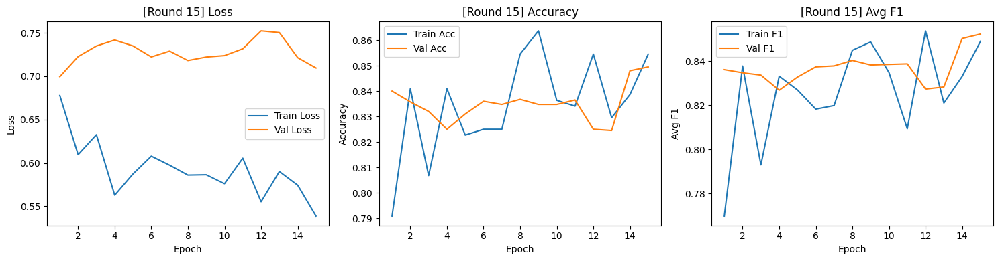


[AL Round 16/20] — Labeled samples: 450



Epoch 15/15
Train — Loss: 0.6095 | Acc: 0.8111 | Avg F1: 0.8212
Val   — Loss: 0.8233 | Acc: 0.8067 | Avg F1: 0.8175


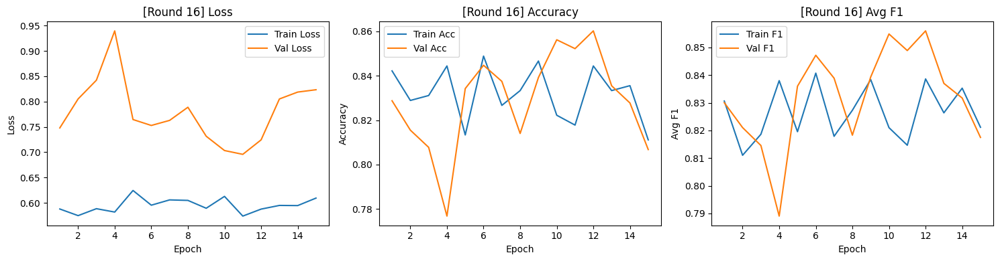


[AL Round 17/20] — Labeled samples: 460



Epoch 15/15
Train — Loss: 0.5673 | Acc: 0.8587 | Avg F1: 0.8510
Val   — Loss: 0.7077 | Acc: 0.8475 | Avg F1: 0.8489


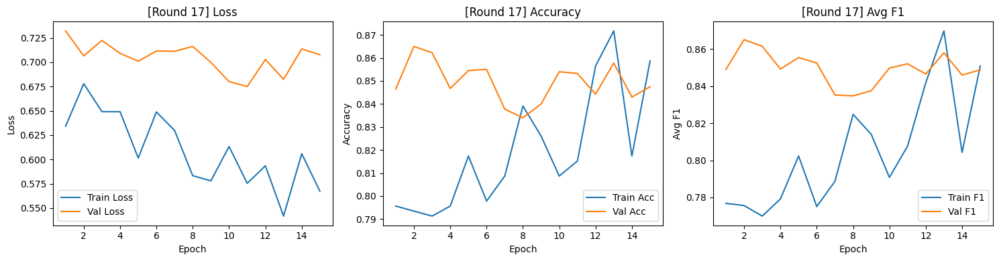


[AL Round 18/20] — Labeled samples: 470



Epoch 15/15
Train — Loss: 0.5849 | Acc: 0.8489 | Avg F1: 0.8393
Val   — Loss: 0.7109 | Acc: 0.8435 | Avg F1: 0.8458


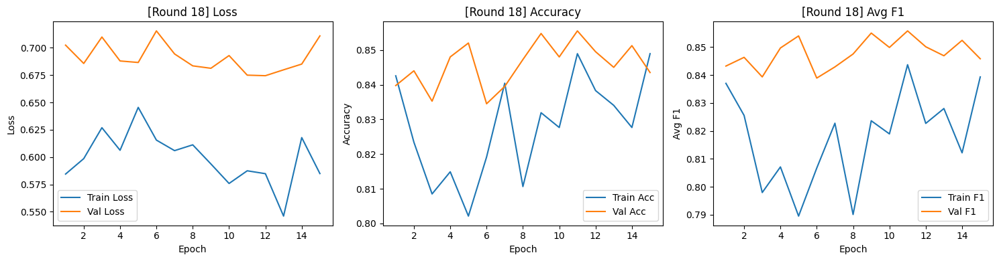


[AL Round 19/20] — Labeled samples: 480



Epoch 15/15
Train — Loss: 0.5699 | Acc: 0.8604 | Avg F1: 0.8528
Val   — Loss: 0.7389 | Acc: 0.8325 | Avg F1: 0.8371


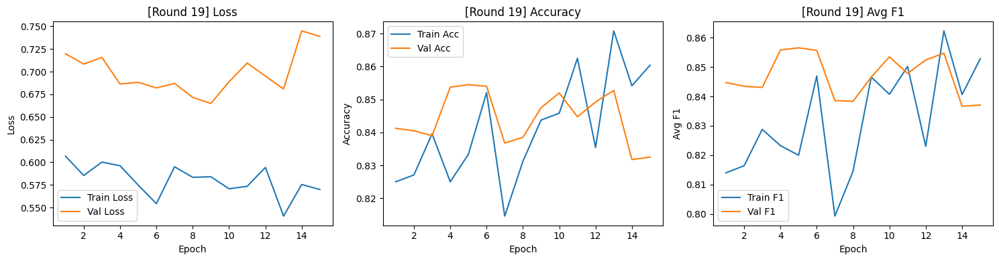


[AL Round 20/20] — Labeled samples: 490



Epoch 15/15
Train — Loss: 0.5776 | Acc: 0.8551 | Avg F1: 0.8476
Val   — Loss: 0.6827 | Acc: 0.8508 | Avg F1: 0.8535


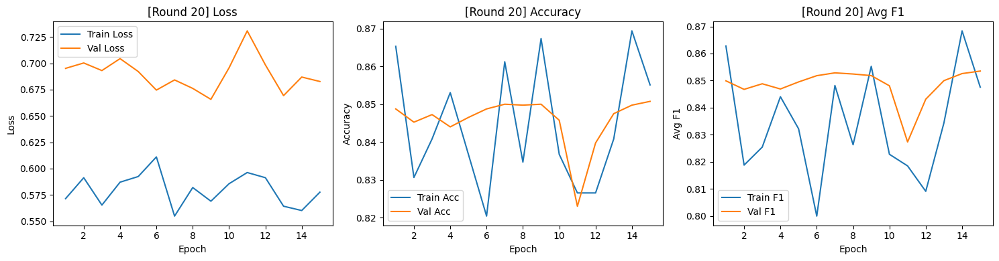

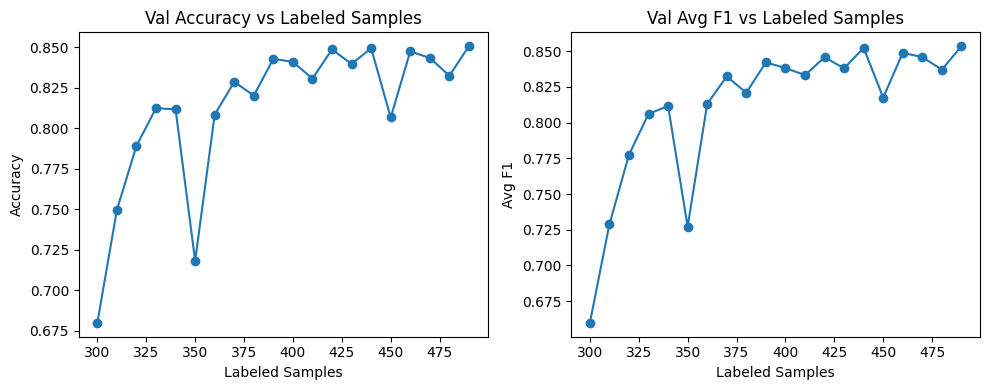

X_labeled shape: (500, 6, 28)
y_labeled shape: (500,)
X_unlabeled shape: (15500, 6, 28)
y_unlabeled shape: (15500,)

=== Running strategy: DIVERSITY ===

[AL Round 1/20] — Labeled samples: 500



Epoch 5/5
Train — Loss: 1.6347 | Acc: 0.6040 | Avg F1: 0.5875
Val   — Loss: 1.5426 | Acc: 0.7588 | Avg F1: 0.7359


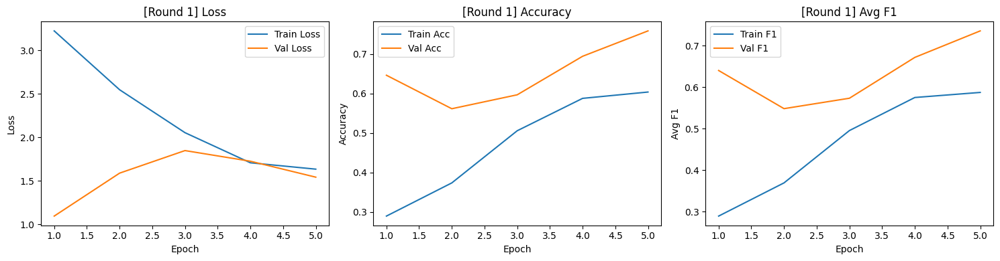


[AL Round 2/20] — Labeled samples: 510



Epoch 5/5
Train — Loss: 1.1323 | Acc: 0.7137 | Avg F1: 0.6939
Val   — Loss: 1.2600 | Acc: 0.7802 | Avg F1: 0.7712


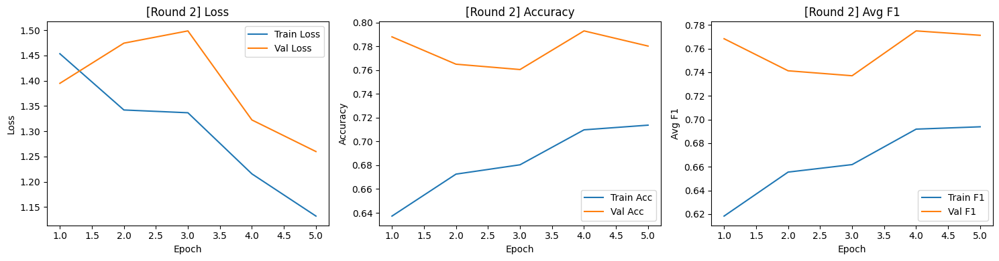


[AL Round 3/20] — Labeled samples: 520



Epoch 5/5
Train — Loss: 1.0658 | Acc: 0.7077 | Avg F1: 0.6923
Val   — Loss: 0.9723 | Acc: 0.8293 | Avg F1: 0.8174


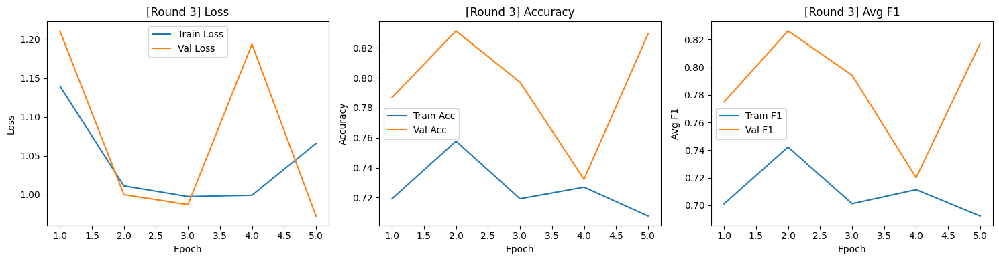


[AL Round 4/20] — Labeled samples: 530



Epoch 5/5
Train — Loss: 0.8903 | Acc: 0.7302 | Avg F1: 0.7147
Val   — Loss: 0.8147 | Acc: 0.8325 | Avg F1: 0.8289


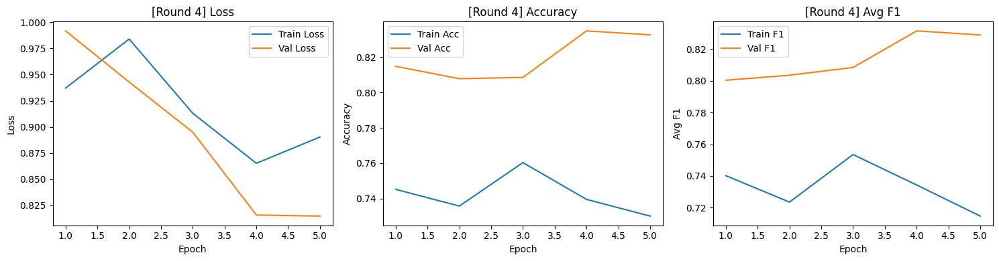


[AL Round 5/20] — Labeled samples: 540



Epoch 10/10
Train — Loss: 0.6921 | Acc: 0.8000 | Avg F1: 0.8021
Val   — Loss: 0.7803 | Acc: 0.8100 | Avg F1: 0.8190


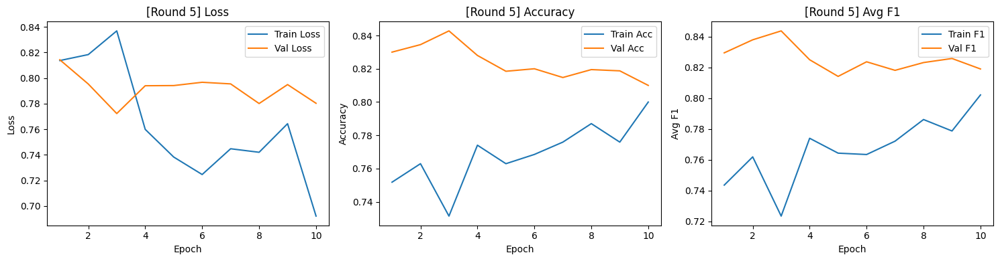


[AL Round 6/20] — Labeled samples: 550



Epoch 10/10
Train — Loss: 0.6852 | Acc: 0.7836 | Avg F1: 0.7889
Val   — Loss: 0.7090 | Acc: 0.8297 | Avg F1: 0.8383


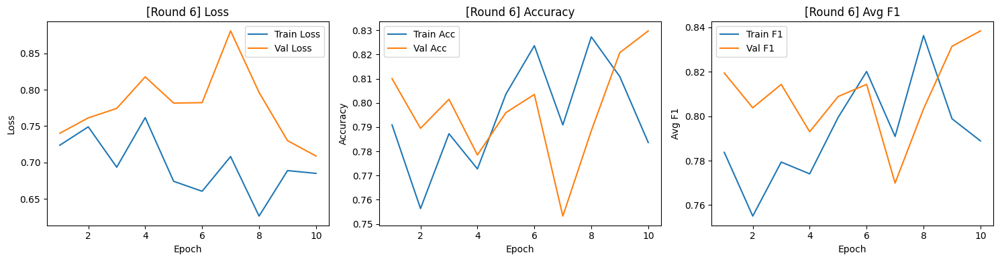


[AL Round 7/20] — Labeled samples: 560



Epoch 10/10
Train — Loss: 0.6515 | Acc: 0.8089 | Avg F1: 0.8119
Val   — Loss: 0.7495 | Acc: 0.8067 | Avg F1: 0.8191


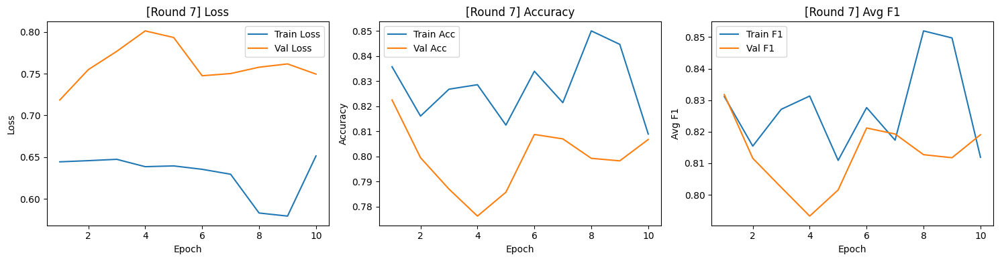


[AL Round 8/20] — Labeled samples: 570



Epoch 10/10
Train — Loss: 0.5887 | Acc: 0.8351 | Avg F1: 0.8409
Val   — Loss: 0.7617 | Acc: 0.7905 | Avg F1: 0.8035


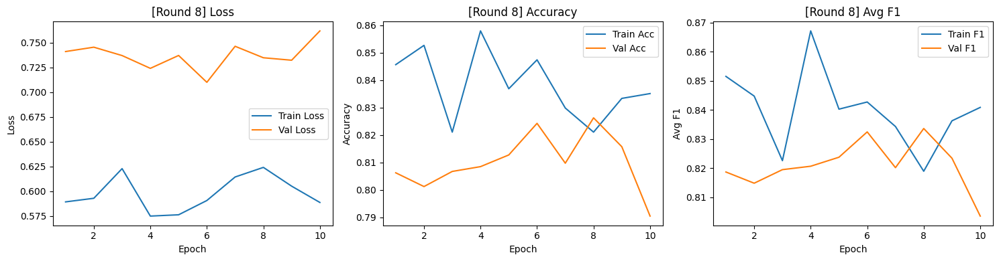


[AL Round 9/20] — Labeled samples: 580



Epoch 10/10
Train — Loss: 0.5611 | Acc: 0.8517 | Avg F1: 0.8551
Val   — Loss: 0.7338 | Acc: 0.8090 | Avg F1: 0.8152


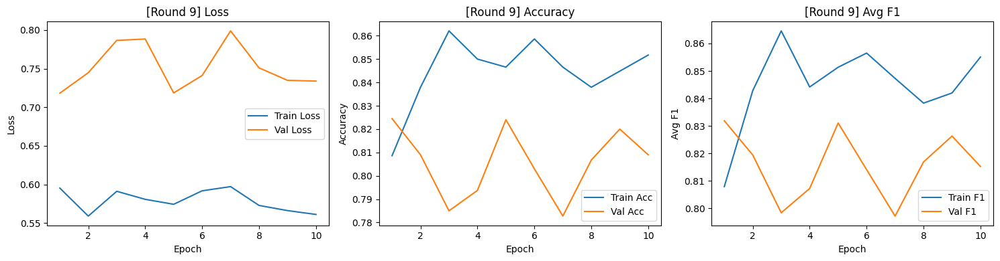


[AL Round 10/20] — Labeled samples: 590



Epoch 10/10
Train — Loss: 0.5398 | Acc: 0.8610 | Avg F1: 0.8587
Val   — Loss: 0.7444 | Acc: 0.7975 | Avg F1: 0.8098


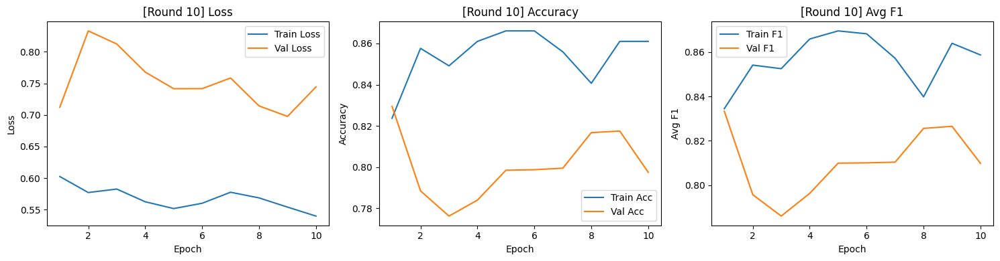


[AL Round 11/20] — Labeled samples: 600



Epoch 10/10
Train — Loss: 0.5302 | Acc: 0.8550 | Avg F1: 0.8548
Val   — Loss: 0.6787 | Acc: 0.8237 | Avg F1: 0.8325


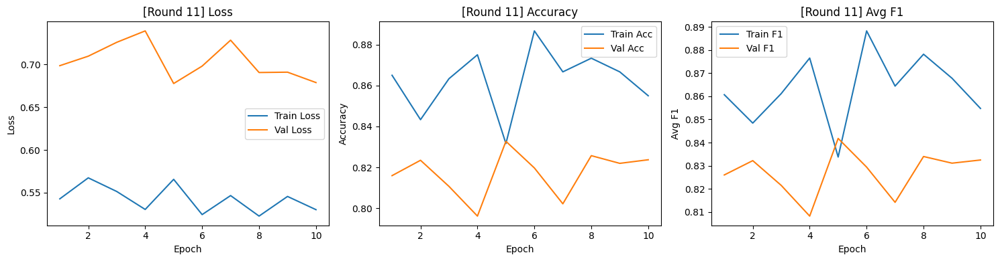


[AL Round 12/20] — Labeled samples: 610



Epoch 15/15
Train — Loss: 0.5157 | Acc: 0.8689 | Avg F1: 0.8738
Val   — Loss: 0.6972 | Acc: 0.8165 | Avg F1: 0.8265


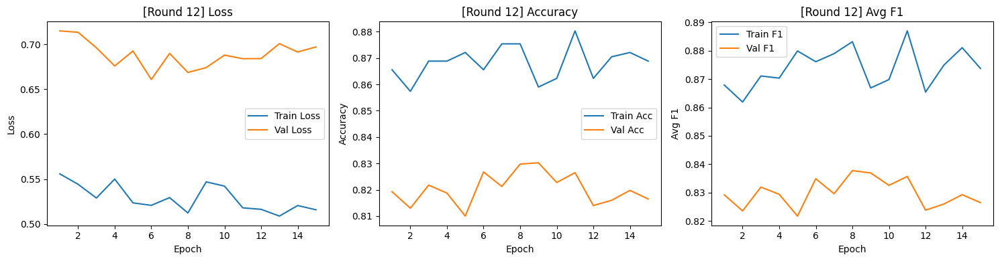


[AL Round 13/20] — Labeled samples: 620



Epoch 15/15
Train — Loss: 0.5041 | Acc: 0.8790 | Avg F1: 0.8843
Val   — Loss: 0.6734 | Acc: 0.8267 | Avg F1: 0.8356


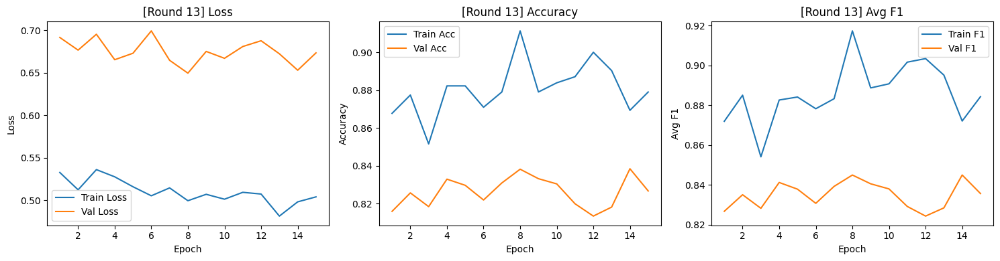


[AL Round 14/20] — Labeled samples: 630



Epoch 15/15
Train — Loss: 0.4758 | Acc: 0.9079 | Avg F1: 0.9045
Val   — Loss: 0.7204 | Acc: 0.8063 | Avg F1: 0.8180


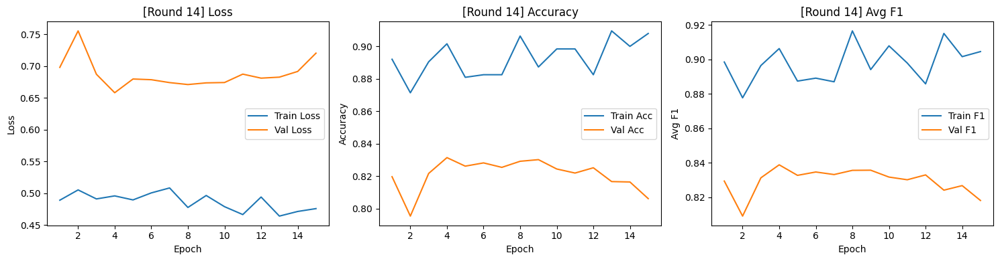


[AL Round 15/20] — Labeled samples: 640



Epoch 15/15
Train — Loss: 0.4661 | Acc: 0.9141 | Avg F1: 0.9151
Val   — Loss: 0.6440 | Acc: 0.8435 | Avg F1: 0.8480


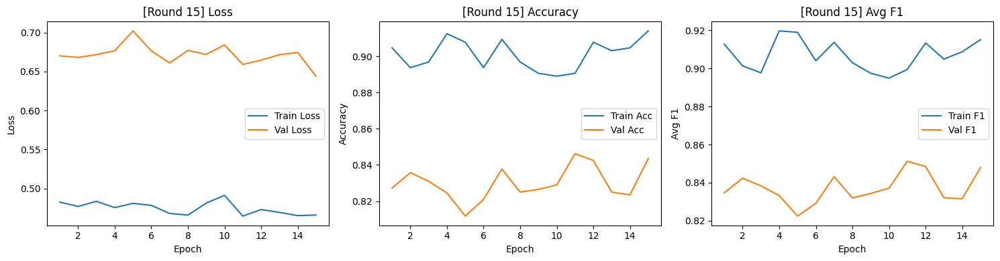


[AL Round 16/20] — Labeled samples: 650



Epoch 15/15
Train — Loss: 0.4715 | Acc: 0.9123 | Avg F1: 0.9174
Val   — Loss: 0.6847 | Acc: 0.8283 | Avg F1: 0.8363


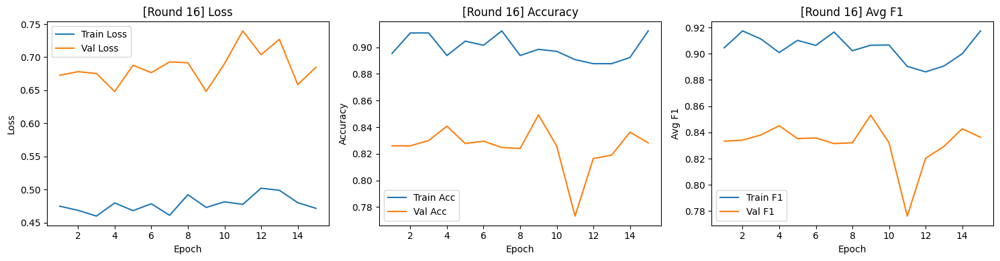


[AL Round 17/20] — Labeled samples: 660



Epoch 15/15
Train — Loss: 0.4537 | Acc: 0.9091 | Avg F1: 0.9176
Val   — Loss: 0.6796 | Acc: 0.8315 | Avg F1: 0.8352


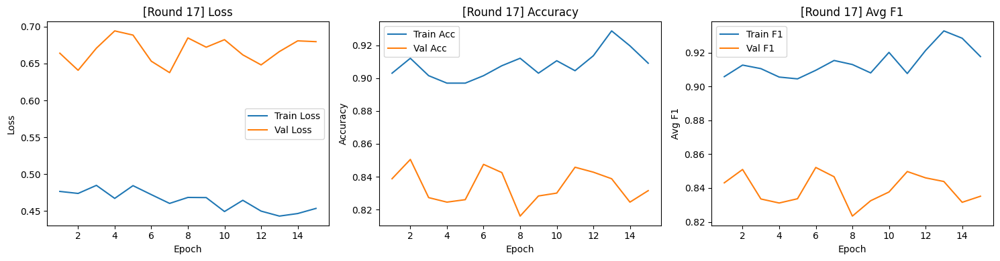


[AL Round 18/20] — Labeled samples: 670



Epoch 15/15
Train — Loss: 0.4434 | Acc: 0.9164 | Avg F1: 0.9248
Val   — Loss: 0.6674 | Acc: 0.8347 | Avg F1: 0.8400


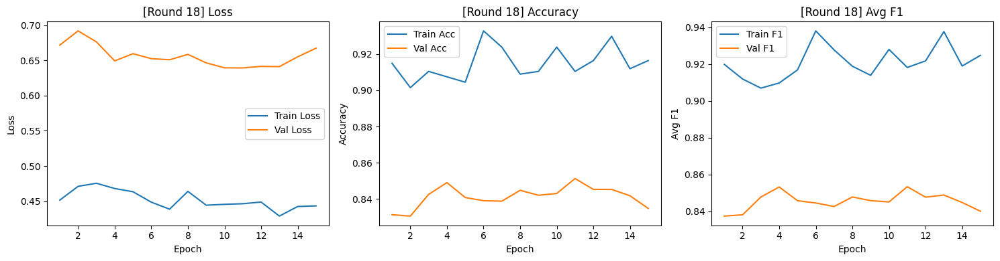


[AL Round 19/20] — Labeled samples: 680



Epoch 15/15
Train — Loss: 0.4401 | Acc: 0.9235 | Avg F1: 0.9249
Val   — Loss: 0.6429 | Acc: 0.8512 | Avg F1: 0.8553


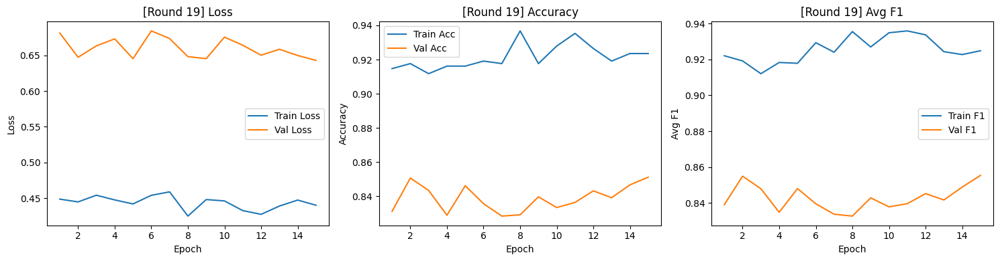


[AL Round 20/20] — Labeled samples: 690



Epoch 15/15
Train — Loss: 0.4184 | Acc: 0.9319 | Avg F1: 0.9368
Val   — Loss: 0.6444 | Acc: 0.8423 | Avg F1: 0.8442


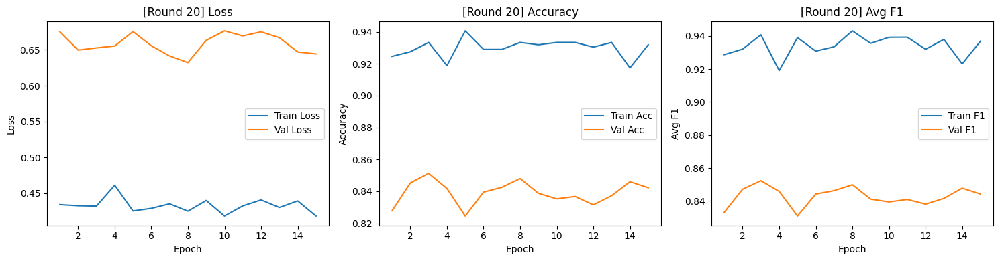

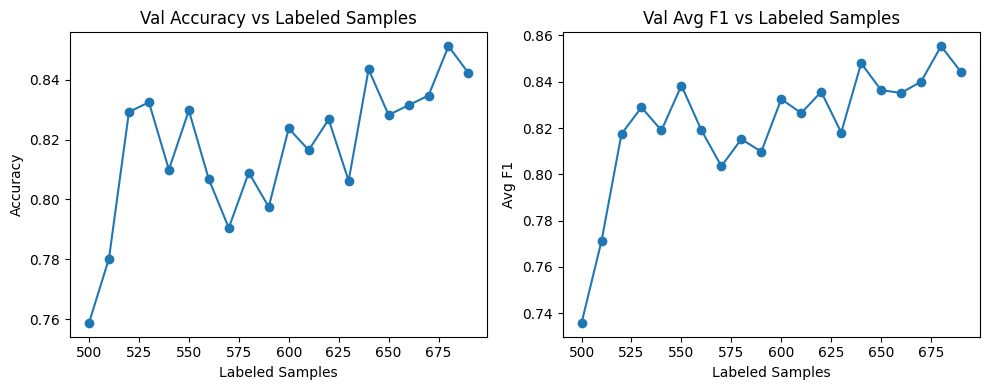


=== Running strategy: ENTROPY ===

[AL Round 1/20] — Labeled samples: 500



Epoch 5/5
Train — Loss: 1.6240 | Acc: 0.5920 | Avg F1: 0.5788
Val   — Loss: 1.5978 | Acc: 0.7300 | Avg F1: 0.7072


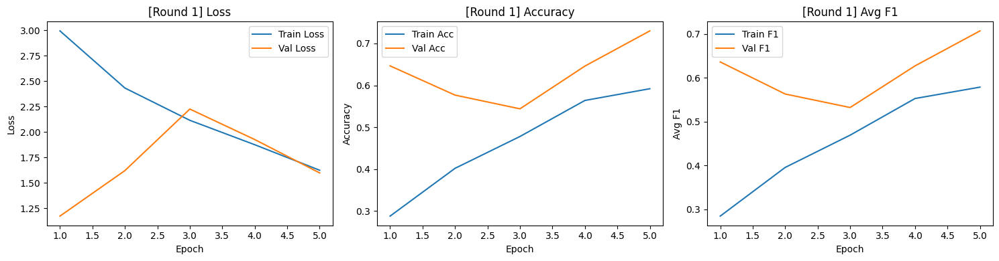


[AL Round 2/20] — Labeled samples: 510



Epoch 5/5
Train — Loss: 1.1205 | Acc: 0.7333 | Avg F1: 0.7144
Val   — Loss: 1.1436 | Acc: 0.8247 | Avg F1: 0.8184


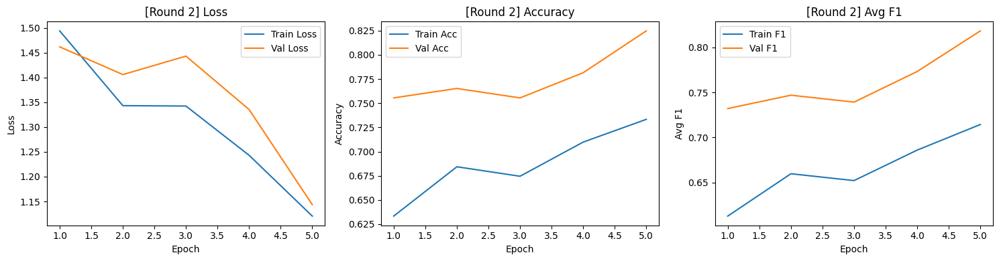


[AL Round 3/20] — Labeled samples: 520



Epoch 5/5
Train — Loss: 1.0311 | Acc: 0.7038 | Avg F1: 0.6880
Val   — Loss: 1.2290 | Acc: 0.7880 | Avg F1: 0.7702


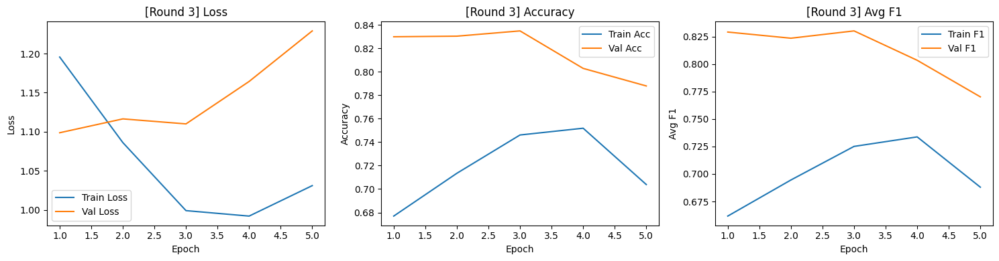


[AL Round 4/20] — Labeled samples: 530



Epoch 5/5
Train — Loss: 0.8610 | Acc: 0.7604 | Avg F1: 0.7557
Val   — Loss: 0.9519 | Acc: 0.8397 | Avg F1: 0.8426


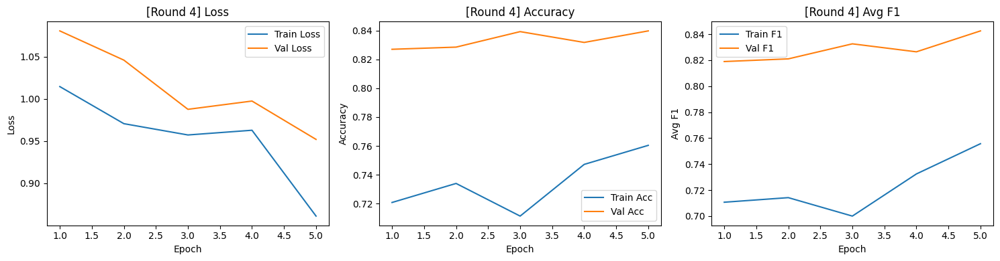


[AL Round 5/20] — Labeled samples: 540



Epoch 10/10
Train — Loss: 0.6921 | Acc: 0.8111 | Avg F1: 0.8047
Val   — Loss: 0.8272 | Acc: 0.8325 | Avg F1: 0.8385


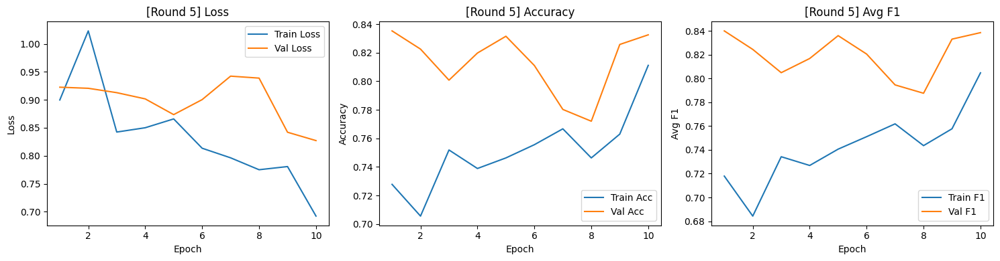


[AL Round 6/20] — Labeled samples: 550



Epoch 10/10
Train — Loss: 0.6881 | Acc: 0.7800 | Avg F1: 0.7746
Val   — Loss: 0.8617 | Acc: 0.7883 | Avg F1: 0.8021


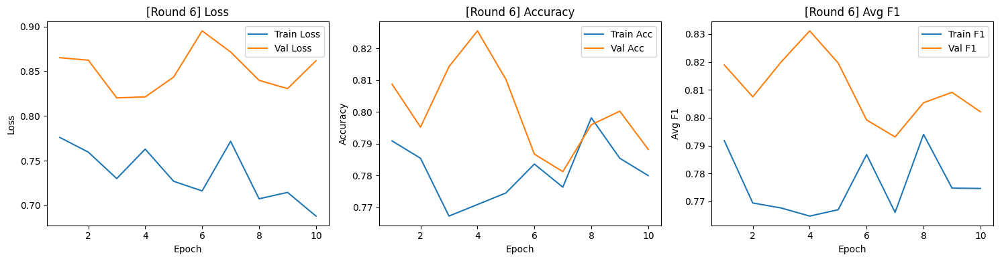


[AL Round 7/20] — Labeled samples: 560



Epoch 10/10
Train — Loss: 0.6731 | Acc: 0.7911 | Avg F1: 0.7935
Val   — Loss: 0.7800 | Acc: 0.8273 | Avg F1: 0.8349


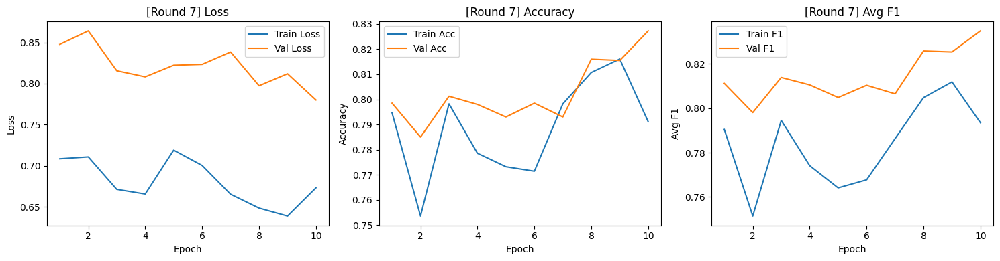


[AL Round 8/20] — Labeled samples: 570



Epoch 10/10
Train — Loss: 0.6554 | Acc: 0.8018 | Avg F1: 0.7888
Val   — Loss: 0.7880 | Acc: 0.8043 | Avg F1: 0.8161


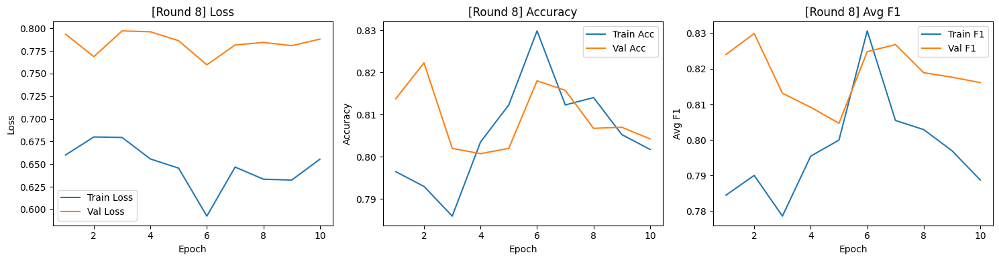


[AL Round 9/20] — Labeled samples: 580



Epoch 10/10
Train — Loss: 0.6526 | Acc: 0.7948 | Avg F1: 0.7962
Val   — Loss: 0.8089 | Acc: 0.7715 | Avg F1: 0.7854


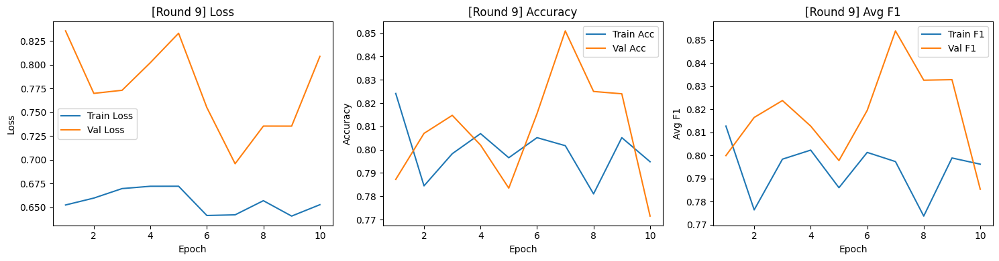


[AL Round 10/20] — Labeled samples: 590



Epoch 10/10
Train — Loss: 0.5981 | Acc: 0.8034 | Avg F1: 0.8013
Val   — Loss: 0.7103 | Acc: 0.8197 | Avg F1: 0.8276


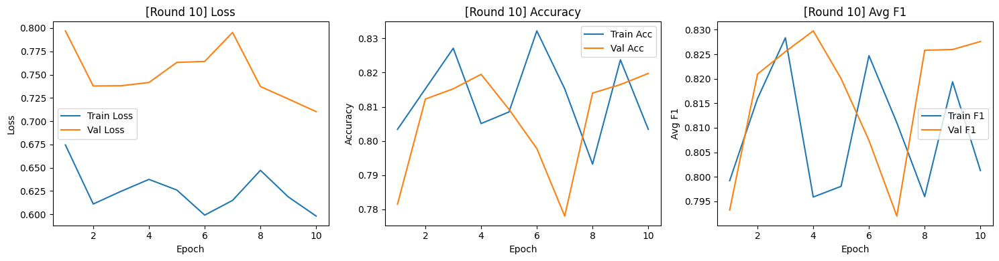


[AL Round 11/20] — Labeled samples: 600



Epoch 10/10
Train — Loss: 0.6397 | Acc: 0.7800 | Avg F1: 0.7632
Val   — Loss: 0.7768 | Acc: 0.7963 | Avg F1: 0.8030


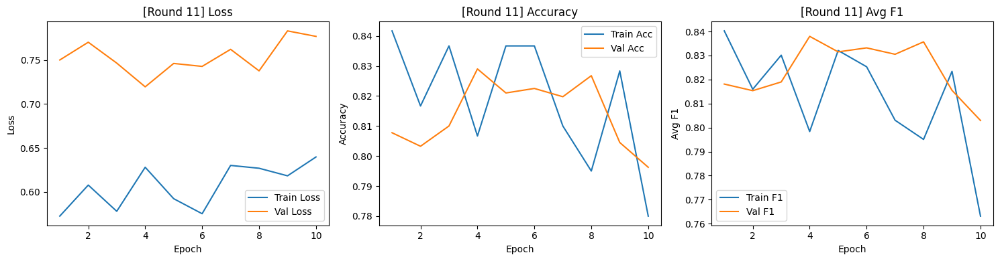


[AL Round 12/20] — Labeled samples: 610



Epoch 15/15
Train — Loss: 0.5997 | Acc: 0.8098 | Avg F1: 0.7993
Val   — Loss: 0.6888 | Acc: 0.8385 | Avg F1: 0.8426


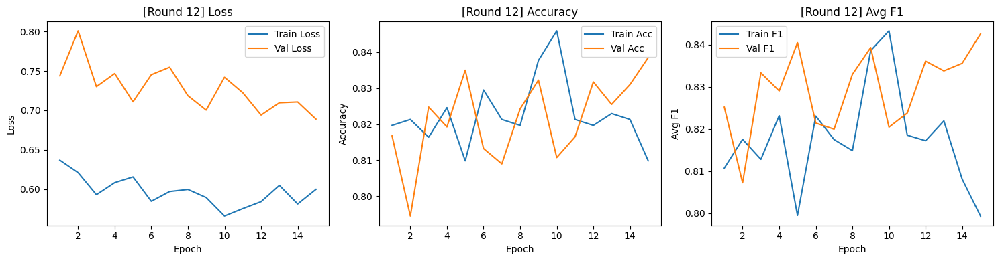


[AL Round 13/20] — Labeled samples: 620



Epoch 15/15
Train — Loss: 0.5917 | Acc: 0.8161 | Avg F1: 0.8105
Val   — Loss: 0.7302 | Acc: 0.8185 | Avg F1: 0.8259


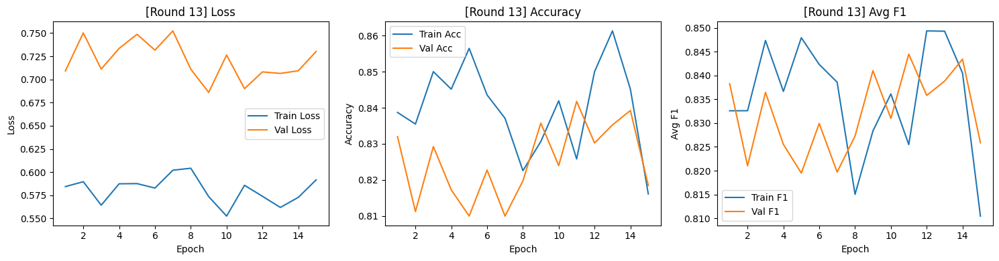


[AL Round 14/20] — Labeled samples: 630



Epoch 15/15
Train — Loss: 0.5737 | Acc: 0.8429 | Avg F1: 0.8385
Val   — Loss: 0.6817 | Acc: 0.8500 | Avg F1: 0.8485


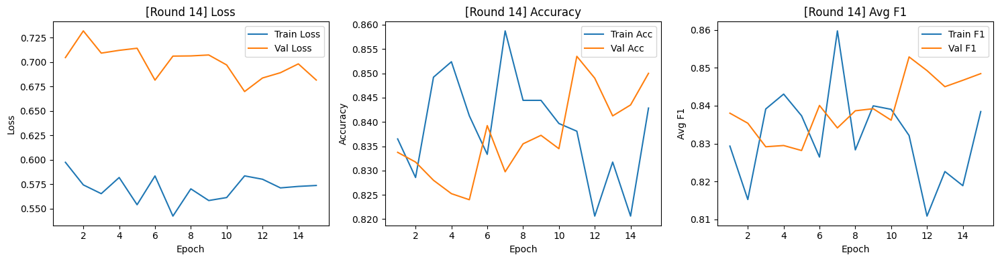


[AL Round 15/20] — Labeled samples: 640



Epoch 15/15
Train — Loss: 0.5486 | Acc: 0.8438 | Avg F1: 0.8413
Val   — Loss: 0.6915 | Acc: 0.8430 | Avg F1: 0.8438


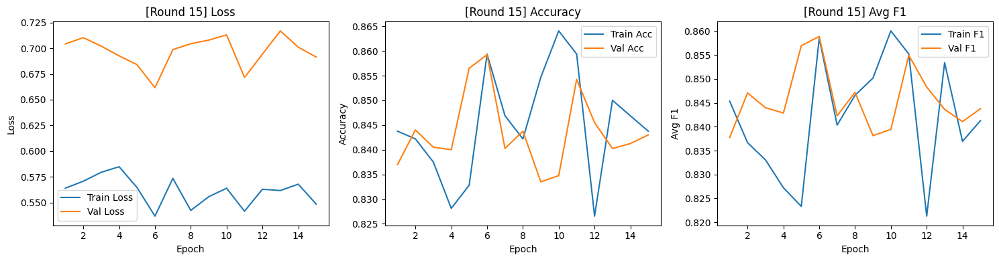


[AL Round 16/20] — Labeled samples: 650



Epoch 15/15
Train — Loss: 0.5446 | Acc: 0.8554 | Avg F1: 0.8524
Val   — Loss: 0.6846 | Acc: 0.8442 | Avg F1: 0.8433


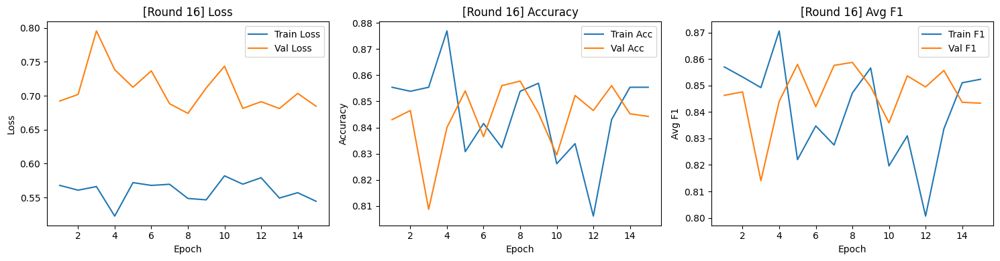


[AL Round 17/20] — Labeled samples: 660



Epoch 15/15
Train — Loss: 0.5276 | Acc: 0.8727 | Avg F1: 0.8719
Val   — Loss: 0.6892 | Acc: 0.8535 | Avg F1: 0.8546


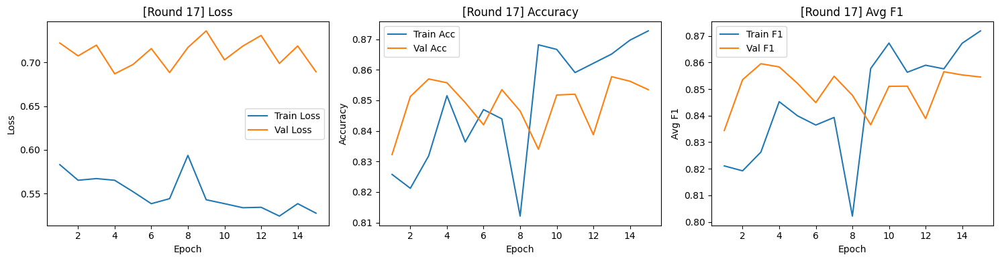


[AL Round 18/20] — Labeled samples: 670



Epoch 15/15
Train — Loss: 0.5281 | Acc: 0.8657 | Avg F1: 0.8550
Val   — Loss: 0.7085 | Acc: 0.8468 | Avg F1: 0.8457


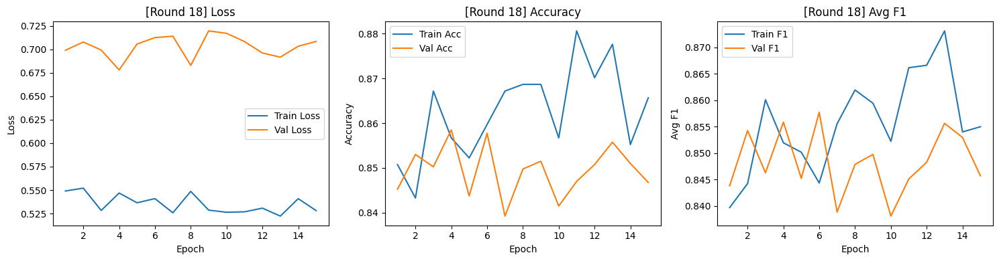


[AL Round 19/20] — Labeled samples: 680



Epoch 15/15
Train — Loss: 0.5195 | Acc: 0.8721 | Avg F1: 0.8591
Val   — Loss: 0.7070 | Acc: 0.8510 | Avg F1: 0.8481


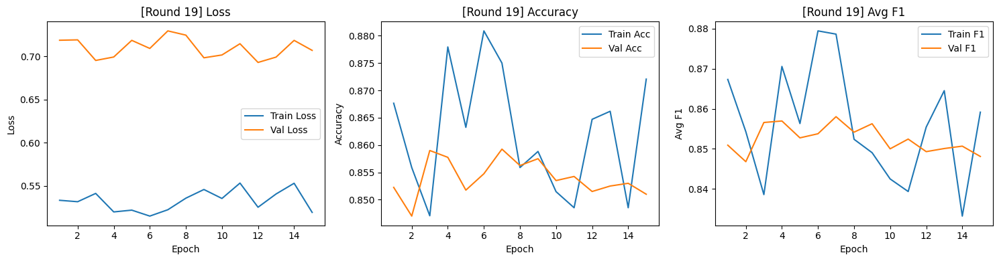


[AL Round 20/20] — Labeled samples: 690



Epoch 15/15
Train — Loss: 0.5372 | Acc: 0.8551 | Avg F1: 0.8571
Val   — Loss: 0.6976 | Acc: 0.8525 | Avg F1: 0.8503


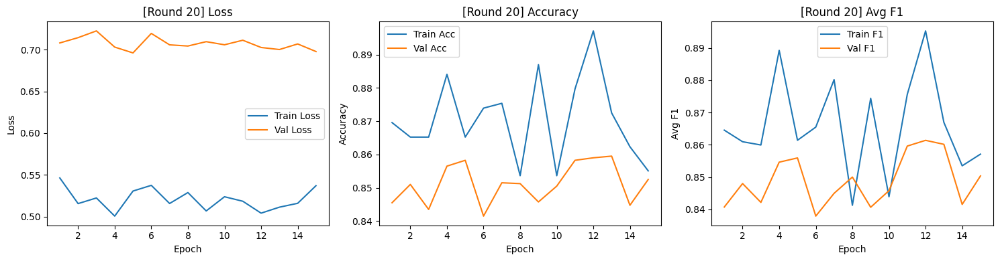

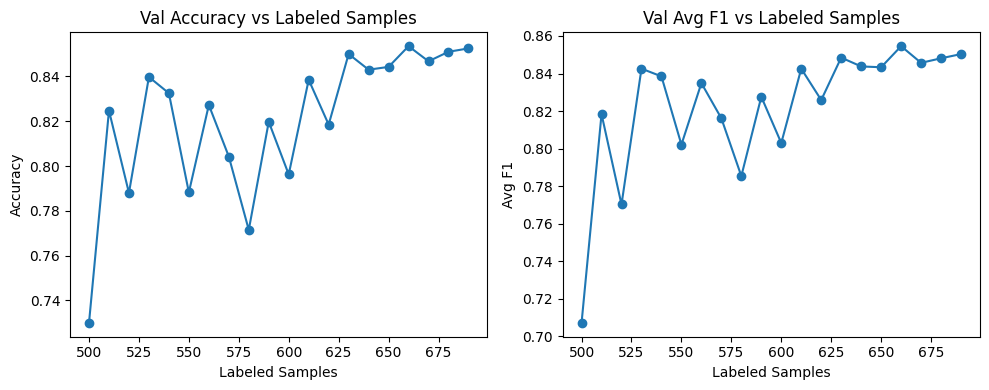


=== Running strategy: ENTROPY_DIVERSITY ===

[AL Round 1/20] — Labeled samples: 500



Epoch 5/5
Train — Loss: 1.5582 | Acc: 0.6100 | Avg F1: 0.5922
Val   — Loss: 1.6230 | Acc: 0.7458 | Avg F1: 0.7240


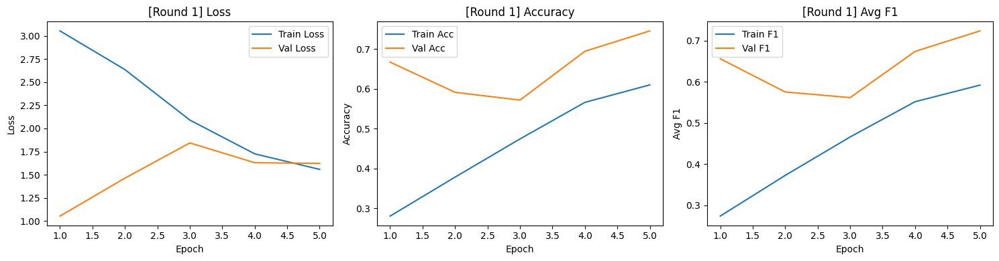


[AL Round 2/20] — Labeled samples: 510



Epoch 5/5
Train — Loss: 1.2104 | Acc: 0.7157 | Avg F1: 0.6943
Val   — Loss: 1.1812 | Acc: 0.8337 | Avg F1: 0.8310


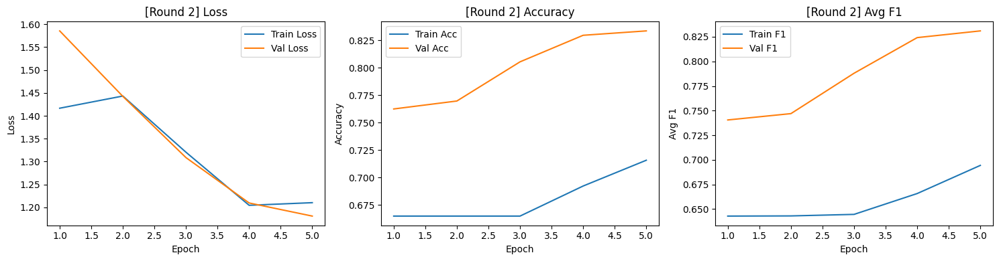


[AL Round 3/20] — Labeled samples: 520



Epoch 5/5
Train — Loss: 0.9798 | Acc: 0.7192 | Avg F1: 0.7032
Val   — Loss: 0.9707 | Acc: 0.8327 | Avg F1: 0.8245


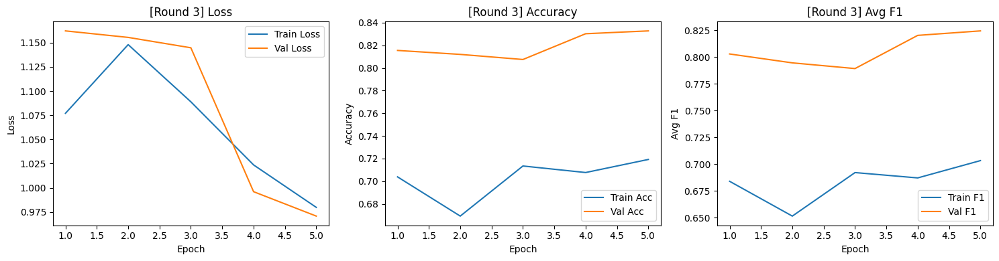


[AL Round 4/20] — Labeled samples: 530



Epoch 5/5
Train — Loss: 0.8687 | Acc: 0.7491 | Avg F1: 0.7434
Val   — Loss: 0.8603 | Acc: 0.8445 | Avg F1: 0.8461


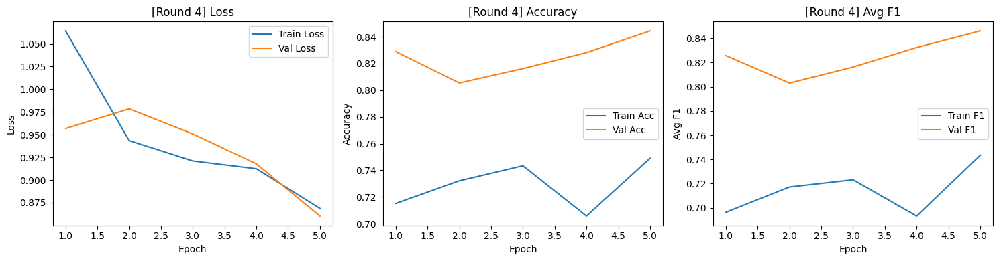


[AL Round 5/20] — Labeled samples: 540



Epoch 10/10
Train — Loss: 0.7633 | Acc: 0.7537 | Avg F1: 0.7411
Val   — Loss: 0.8213 | Acc: 0.8203 | Avg F1: 0.8297


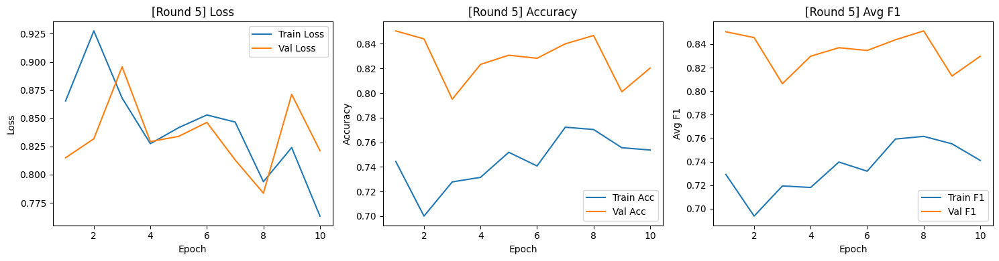


[AL Round 6/20] — Labeled samples: 550



Epoch 10/10
Train — Loss: 0.7054 | Acc: 0.7727 | Avg F1: 0.7697
Val   — Loss: 0.7295 | Acc: 0.8433 | Avg F1: 0.8493


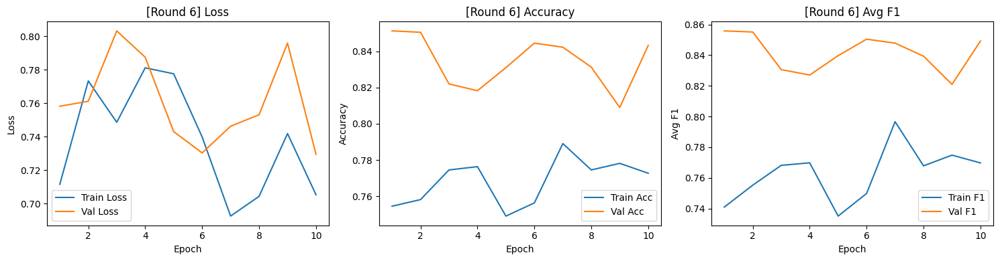


[AL Round 7/20] — Labeled samples: 560



Epoch 10/10
Train — Loss: 0.7323 | Acc: 0.7679 | Avg F1: 0.7532
Val   — Loss: 0.7828 | Acc: 0.8070 | Avg F1: 0.8180


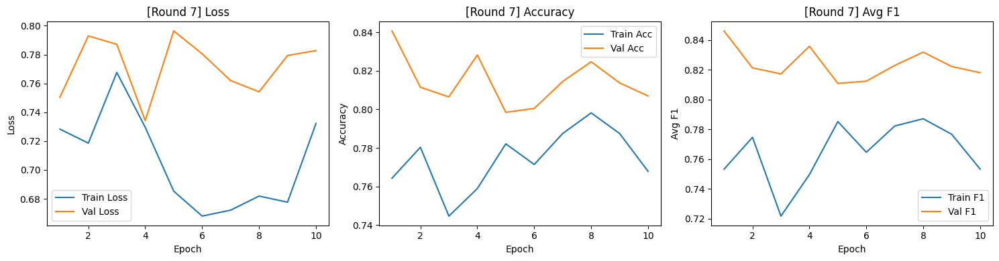


[AL Round 8/20] — Labeled samples: 570



Epoch 10/10
Train — Loss: 0.6195 | Acc: 0.8246 | Avg F1: 0.8120
Val   — Loss: 0.7061 | Acc: 0.8403 | Avg F1: 0.8442


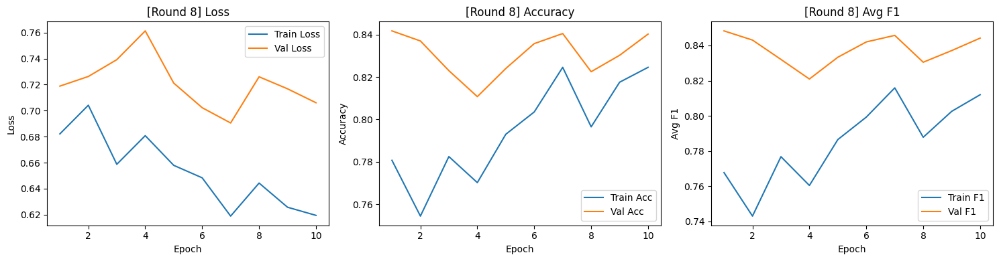


[AL Round 9/20] — Labeled samples: 580



Epoch 10/10
Train — Loss: 0.6480 | Acc: 0.8000 | Avg F1: 0.7970
Val   — Loss: 0.6378 | Acc: 0.8468 | Avg F1: 0.8504


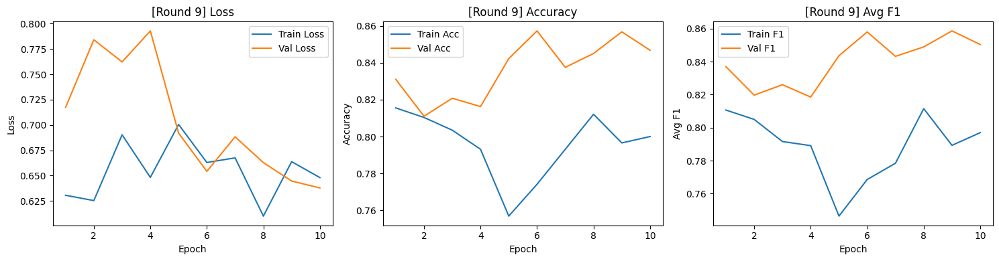


[AL Round 10/20] — Labeled samples: 590



Epoch 10/10
Train — Loss: 0.6240 | Acc: 0.8220 | Avg F1: 0.8128
Val   — Loss: 0.6536 | Acc: 0.8460 | Avg F1: 0.8505


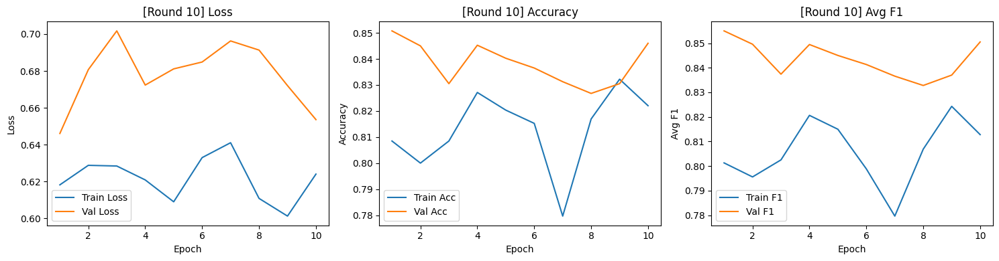


[AL Round 11/20] — Labeled samples: 600



Epoch 10/10
Train — Loss: 0.6094 | Acc: 0.8167 | Avg F1: 0.8128
Val   — Loss: 0.6535 | Acc: 0.8365 | Avg F1: 0.8420


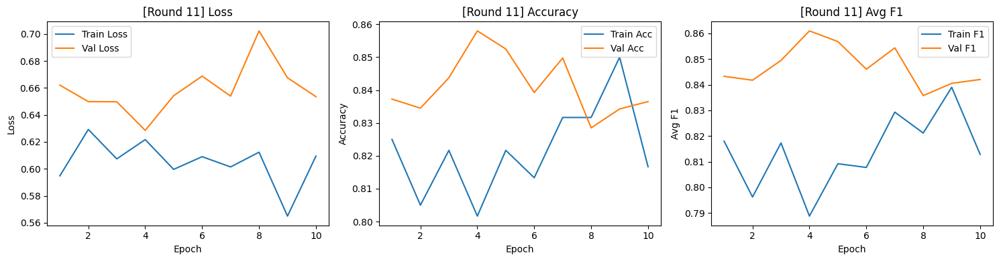


[AL Round 12/20] — Labeled samples: 610



Epoch 15/15
Train — Loss: 0.5947 | Acc: 0.8230 | Avg F1: 0.8178
Val   — Loss: 0.6877 | Acc: 0.8297 | Avg F1: 0.8362


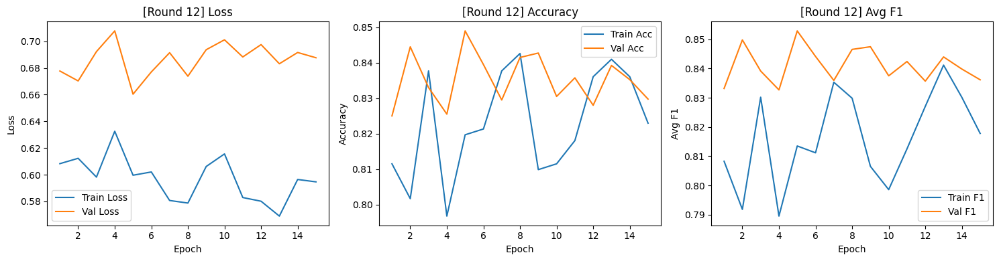


[AL Round 13/20] — Labeled samples: 620



Epoch 15/15
Train — Loss: 0.5842 | Acc: 0.8387 | Avg F1: 0.8316
Val   — Loss: 0.6929 | Acc: 0.8260 | Avg F1: 0.8325


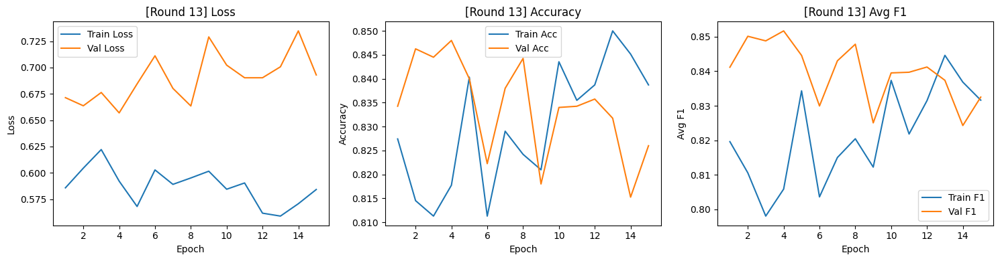


[AL Round 14/20] — Labeled samples: 630



Epoch 15/15
Train — Loss: 0.5680 | Acc: 0.8238 | Avg F1: 0.8146
Val   — Loss: 0.6930 | Acc: 0.8375 | Avg F1: 0.8413


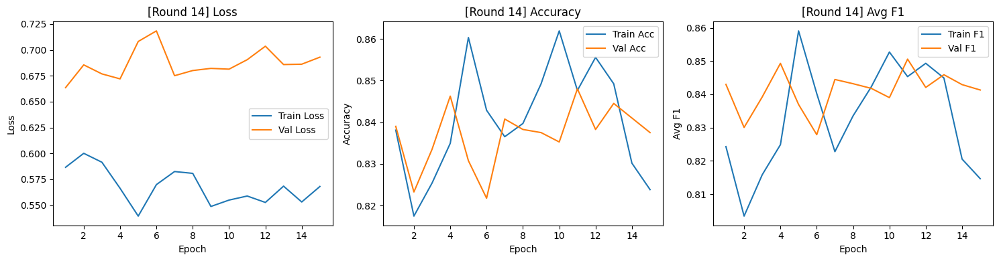


[AL Round 15/20] — Labeled samples: 640



Epoch 15/15
Train — Loss: 0.5377 | Acc: 0.8609 | Avg F1: 0.8465
Val   — Loss: 0.6831 | Acc: 0.8455 | Avg F1: 0.8468


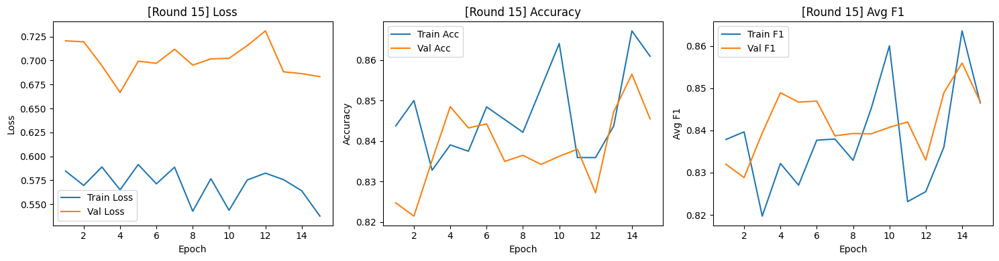


[AL Round 16/20] — Labeled samples: 650



Epoch 15/15
Train — Loss: 0.5679 | Acc: 0.8462 | Avg F1: 0.8365
Val   — Loss: 0.7339 | Acc: 0.8373 | Avg F1: 0.8410


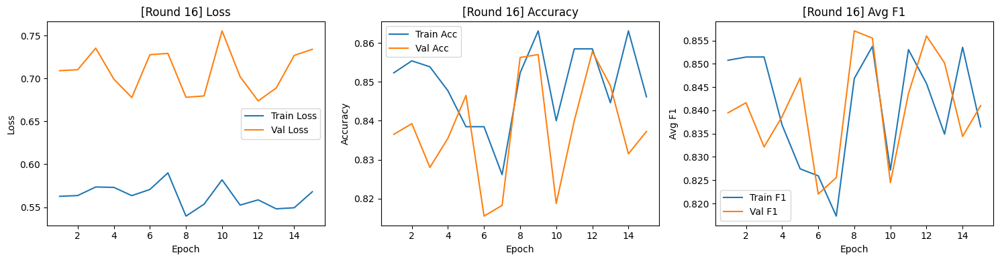


[AL Round 17/20] — Labeled samples: 660



Epoch 15/15
Train — Loss: 0.5462 | Acc: 0.8621 | Avg F1: 0.8614
Val   — Loss: 0.6978 | Acc: 0.8377 | Avg F1: 0.8416


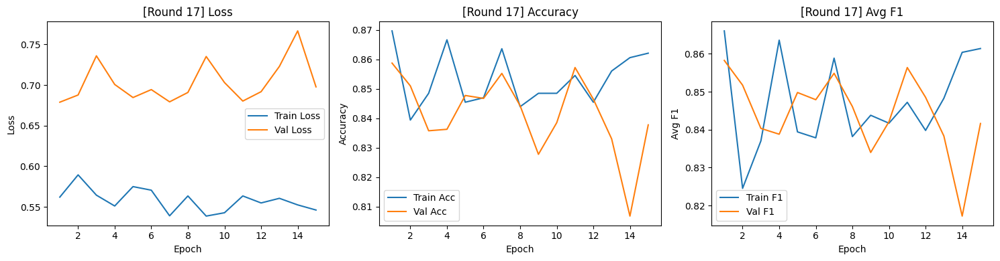


[AL Round 18/20] — Labeled samples: 670



Epoch 15/15
Train — Loss: 0.5503 | Acc: 0.8403 | Avg F1: 0.8401
Val   — Loss: 0.6989 | Acc: 0.8478 | Avg F1: 0.8504


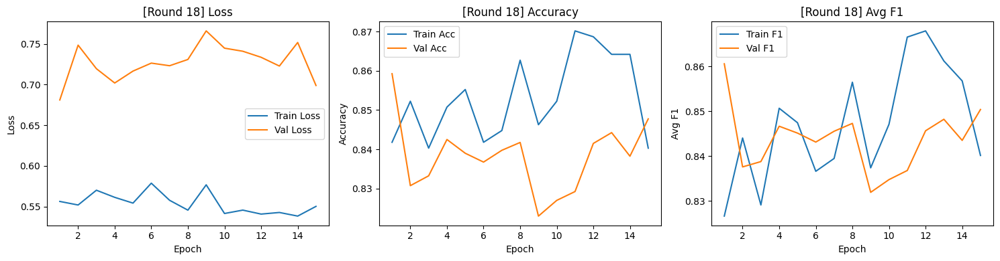


[AL Round 19/20] — Labeled samples: 680



Epoch 15/15
Train — Loss: 0.5318 | Acc: 0.8574 | Avg F1: 0.8496
Val   — Loss: 0.7225 | Acc: 0.8410 | Avg F1: 0.8443


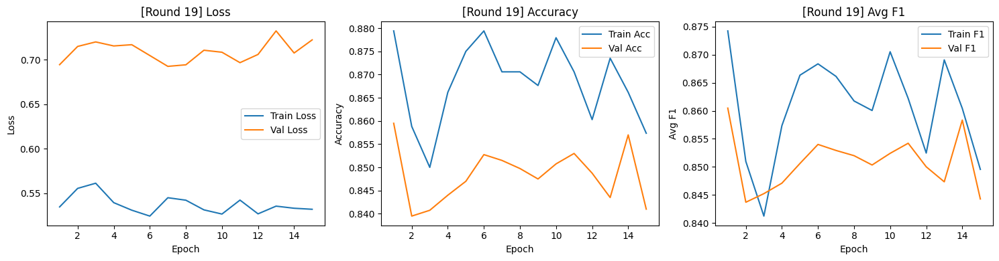


[AL Round 20/20] — Labeled samples: 690



Epoch 15/15
Train — Loss: 0.5388 | Acc: 0.8667 | Avg F1: 0.8613
Val   — Loss: 0.7032 | Acc: 0.8578 | Avg F1: 0.8595


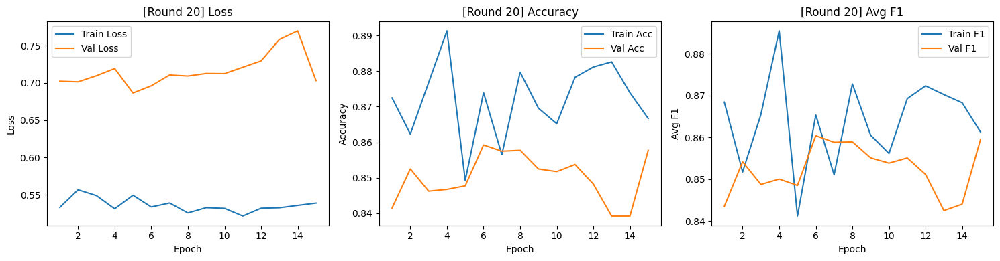

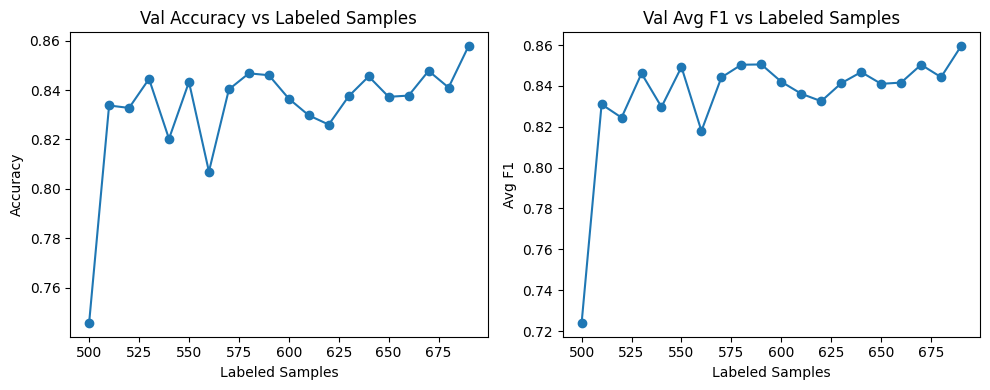

In [13]:

strategies = [ 'diversity', "entropy", "entropy_diversity"]
all_histories = {}

data = [(100,30,10),(300,30,10),(500,30,10)]

for initial_labeled, iters,query_size in data:
    initial_labeled= 1-initial_labeled/len(X_pool)
    X_labeled, X_unlabeled, y_labeled, y_unlabeled = train_test_split(X_pool, y_pool, test_size=initial_labeled, stratify=y_pool, random_state=42)
    print(f"X_labeled shape: {X_labeled.shape}")
    print(f"y_labeled shape: {y_labeled.shape}")
    print(f"X_unlabeled shape: {X_unlabeled.shape}")
    print(f"y_unlabeled shape: {y_unlabeled.shape}")
    
    
    labeled_dataset = Dataset(X_labeled, y_labeled)
    unlabeled_dataset = Dataset(X_unlabeled, y_unlabeled)
    val_dataset = Dataset(X_val, y_val)
    
    for strat in strategies:
        print(f"\n=== Running strategy: {strat.upper()} ===")
        
        # Reset datasets to initial versions (deepcopy to avoid mutations)
        labeled = copy.deepcopy(labeled_dataset)
        unlabeled = copy.deepcopy(unlabeled_dataset)
    
        model.load_state_dict(copy.deepcopy(initial_state_dict))
        
        hist = active_learning_loop(
            model,
            labeled_dataset=labeled,
            unlabeled_dataset=unlabeled,
            val_dataset=val_dataset,
            strategy=strat,
            device=device,
            iters=iters,
            query_size=query_size,
            final_epochs=15
        )
        
        all_histories[(strat, initial_labeled, iters, query_size)] = hist


with open("/kaggle/working/history_entropy.pkl", "wb") as f:
    pickle.dump(all_histories, f)

# Plotting final result

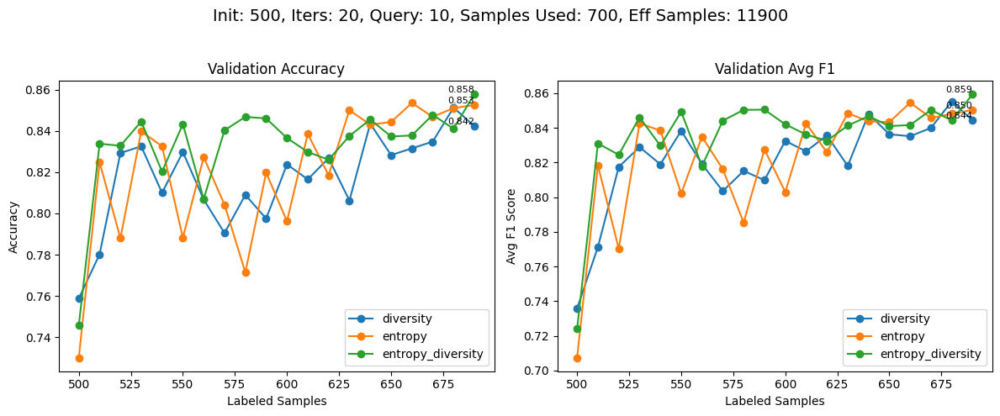

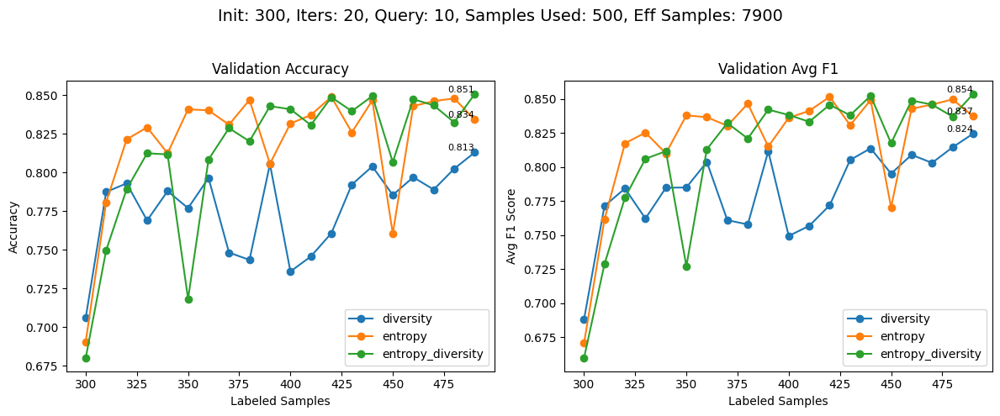

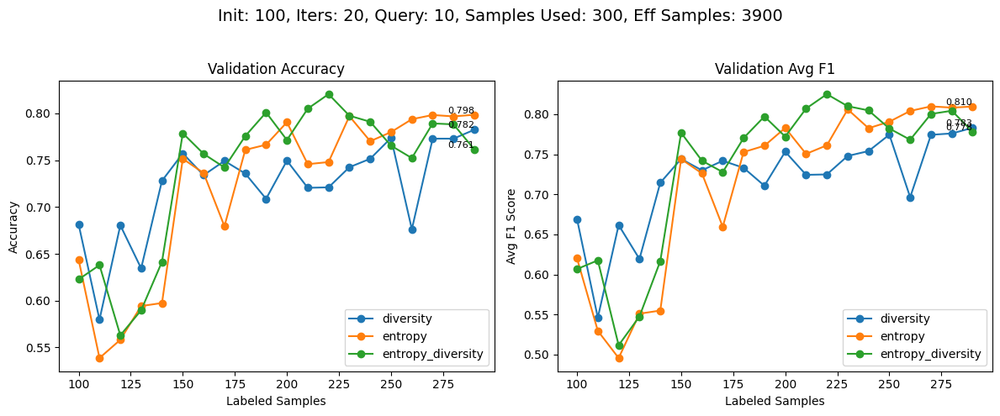

In [26]:
def eff_total_labeled_samples(init, iterations, query):
    return round(iterations * init + query * (iterations * (iterations - 1)) // 2)

def total_labeled_samples(init, iterations, query):
    return init+query*iterations

unique_configs = sorted(set((init_size, iters, query) for (_, init_size, iters, query) in all_histories.keys()))

for init_size, iters, query in unique_configs:
    plt.figure(figsize=(12, 5))
    plt.suptitle(f"Init: {round(len(X_pool)*(1-init_size))}, Iters: {iters}, Query: {query}, Samples Used: {total_labeled_samples(round(len(X_pool)*(1-init_size)), iters, query)}, Eff Samples: {eff_total_labeled_samples(round(len(X_pool)*(1-init_size)), iters, query)}", fontsize=14)
    # Accuracy
    plt.subplot(1, 2, 1)
    for (strat, size, iters_, query_), hist in all_histories.items():
        if (size, iters_, query_) == (init_size, iters, query):
            plt.plot(hist["samples"], hist["round_val_acc"], label=strat, marker='o')
            # Show final accuracy value
            x_final = hist["samples"][-1]
            y_final = hist["round_val_acc"][-1]
            plt.text(x_final, y_final, f"{y_final:.3f}", fontsize=8, ha='right', va='bottom')
    plt.title("Validation Accuracy")
    plt.xlabel("Labeled Samples")
    plt.ylabel("Accuracy")
    plt.legend()

    # F1 Score
    plt.subplot(1, 2, 2)
    for (strat, size, iters_, query_), hist in all_histories.items():
        if (size, iters_, query_) == (init_size, iters, query):
            plt.plot(hist["samples"], hist["round_val_avg_f1"], label=strat, marker='o')
            # Show final F1 value
            x_final = hist["samples"][-1]
            y_final = hist["round_val_avg_f1"][-1]
            plt.text(x_final, y_final, f"{y_final:.3f}", fontsize=8, ha='right', va='bottom')
    plt.title("Validation Avg F1")
    plt.xlabel("Labeled Samples")
    plt.ylabel("Avg F1 Score")
    plt.legend()

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()
